# Packages and Functions

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import seaborn as sns

pd.set_option('display.max_columns', None)

In [3]:
def adjust_data_types(df):
    for col in df.columns:
        unique_vals = df[col].unique()
        if df[col].dtypes == 'object':
            None
#         elif (set(unique_vals) == {0, 1}) or col == 'userId':
#             df[col] = df[col].astype('int64')
#         else:
#             df[col] = df[col].astype('float64')
        elif (set(unique_vals) != {0, 1}):
            df[col] = df[col].astype('float64')
        else:
            df[col] = df[col].astype('int64')
    return df

In [4]:
# ho_t02['userId'] = ho_t02['userId'].astype('str')
# ho_t02 = adjust_data_types(ho_t02)
# ho_t02.info()

In [5]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier
from lightgbm import LGBMClassifier
from xgboost.sklearn import XGBClassifier

from sklearn.feature_selection import RFE, RFECV, VarianceThreshold

from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, make_scorer, confusion_matrix, roc_curve
from sklearn.model_selection import GridSearchCV, StratifiedKFold, permutation_test_score
from sklearn.base import clone


from imblearn.metrics import geometric_mean_score
import shap

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from imblearn.pipeline import Pipeline
# from sklearn.pipeline import Pipeline

import dice_ml

from catboost import CatBoostClassifier

Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
UserConfigValidationException will be deprecated from dice_ml.utils. Please import UserConfigValidationException from raiutils.exceptions.


In [6]:
def specificity_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    specificity = tn / (tn + fp)
    return specificity

specificity_scorer = make_scorer(specificity_score)

def npv_score(y_true, y_pred):
    tn, fp, fn, tp = confusion_matrix(y_true, y_pred).ravel()
    npv = tn / (tn + fn)
    return npv

npv_scorer = make_scorer(npv_score)

g_mean_scorer = make_scorer(geometric_mean_score)


skf = StratifiedKFold(10, shuffle=True, random_state=0)

# def get_cat_cols(df):
#     one_hot_encoded_columns = []

#     for idx, column in enumerate(df.columns):
#         if df[column].nunique() == 2 and set(df[column].unique()) == {0, 1}:
#             one_hot_encoded_columns.append(idx)

#     return one_hot_encoded_columns

def get_cat_cols(df):
    return df.select_dtypes(include=['object']).columns.tolist()

# get_cat_cols(ho_t02)
# cat_cols = get_cat_cols(ho_t02)
# num_cols = [col for col in ho_t02.columns if col not in cat_cols]
# cat_cols, num_cols

In [7]:
from sklearn.decomposition import PCA

from imblearn.over_sampling import SMOTE, ADASYN, SMOTENC, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler, EditedNearestNeighbours, TomekLinks
from imblearn.combine import SMOTEENN, SMOTETomek


from sklearn.base import BaseEstimator, TransformerMixin

class DropCategoricalFeatures(BaseEstimator, TransformerMixin):
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        # Assuming X is a DataFrame
        non_categorical_cols = X.select_dtypes(exclude=['object']).columns.tolist()
        return X[non_categorical_cols]


def knn_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]
    
    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', KNeighborsClassifier())
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_neighbors': list(range(1, 16)),
        'classifier__metric': ['euclidean', 'cosine', 'hamming', 'braycurtis',
                               'chebyshev', 'canberra', 'cityblock', 'sqeuclidean'
                              ]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def svm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', SVC(random_state=random_state, max_iter=1000,
                           verbose=True))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#         ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__probability': [True, False],
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def logreg_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
#         ('drop_categorical', None),
#         ('encoder', None),
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', LogisticRegression(random_state=random_state, max_iter=1000))
    ])

    param_grid = {
#         'drop_categorical': [None, DropCategoricalFeatures()]
#         'encoder': [None, OneHotEncoder(sparse_output=False)],
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__C': list(np.logspace(-6, 6, num=13)),
        'classifier__penalty': ['l2', None],
        'classifier__solver': ['liblinear', 'lbfgs', 'newton-cholesky']
#         'classifier__penalty': ['l1', l2', 'elasticnet', 'None']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df



def dt_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]


    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', DecisionTreeClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(), 
#             RobustScaler(),
#             MinMaxScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
            SMOTEENN(random_state=random_state),
            SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
            TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
#         'classifier__max_depth': [3],
# #         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [1],
#         'classifier__max_depth': [2, 5],
#         'classifier__min_samples_split': [3],
#         'classifier__min_samples_leaf': [3],
# #         'classifier__max_features': ['auto', 'sqrt', 'log2', None],
#         'classifier__criterion': ["entropy", "log_loss"]
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [1],
#         'classifier__min_samples_leaf': [2, 3],
        'classifier__max_depth': [2, 3, 5],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [1, 2, 3],
        'classifier__max_features': ['auto', 'sqrt', 'log2', None],
        'classifier__criterion': ["gini", "entropy", "log_loss"]
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

from sklearn.decomposition import TruncatedSVD

def rf_class2(df, scorer, label_col, scaler, random_state=0):
#     df_majority = df[df.home_ownership_class == 0]
#     df_minority = df[df.home_ownership_class == 1]

# #     display(df_majority)
# #     display(df_minority)
# #     print(len(df_majority), len(df_minority))
#     # Randomly downsample majority class
#     df_majority_downsampled = df_majority.sample(frac=0.2,
#                                                  random_state=random_state)
#     df = pd.concat([df_majority_downsampled, df_minority], axis=0)

    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)

#     n_components = X_scaled.shape[1]  # Maximum number of components
#     svd = TruncatedSVD(n_components=n_components)
#     X_svd = svd.fit_transform(X_scaled)

#     # Step 3: Find number of components that explain at least 90% variance
#     cum_variance = np.cumsum(svd.explained_variance_ratio_)
#     num_components = np.argmax(cum_variance >= 0.90) + 1  # +1 because Python indexing starts from 0
#     X_selected = X_svd[:, :num_components]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

#     X_resampled, y_resampled = RandomOverSampler(random_state=random_state).fit_resample(X_train, y_train)
#     class_counts_original = np.bincount(y_train.astype(int))
#     class_counts_resampled = np.bincount(y_resampled.astype(int))

    # Assuming 0 is the majority class, calculate its upweight factor
#     majority_class_original = class_counts_original[0]
#     majority_class_resampled = class_counts_resampled[0]
#     upweight_factor = majority_class_original / majority_class_resampled

#     minority_class_original = class_counts_original[1]
#     minority_class_resampled = class_counts_resampled[1]
#     downweight_factor = minority_class_original / minority_class_resampled

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', RandomForestClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)
        ],
        'classifier__n_estimators': [200, 300],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__oob_score': [True, False],
        'classifier__criterion': ["gini", "entropy", "log_loss"]

#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__oob_score': [True, False],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
    }
#         'classifier__n_estimators': [200, 250, 300],
# #         'classifier__max_depth': [2, 3, 4],
#         'classifier__max_depth': [2],
#         'classifier__class_weight': [{0: 263/807, 1:1}],
#         'classifier__oob_score': [True],
# #         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__min_samples_split': [3, 4],
#         'classifier__min_samples_leaf': [3, 4],
#         'classifier__criterion': ["gini", "entropy", "log_loss"]
#     }
    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
#                                cv=10, scoring=scorer,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def gbm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', GradientBoostingClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
        'classifier__n_estimators': [200, 250],
        'classifier__max_depth': [2, 3],
        'classifier__min_samples_leaf': [2, 3],
        'classifier__min_samples_split': [2, 3],
        'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def lgbm_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     plt.figure(figsize=(10, 6))
#     plt.plot(range(1, len(explained_var_ratio)+1), cumulative_explained_var, marker='o', linestyle='--')
#     plt.title('Cumulative Explained Variance Plot')
#     plt.xlabel('Number of Components')
#     plt.ylabel('Cumulative Explained Variance')
#     plt.grid(True)
#     plt.show()

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', LGBMClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [400, 450],
#         'classifier__learning_rate': [0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
#         'classifier__max_depth': [2, 3],
#         'classifier__boosting_type': ['gbdt', 'dart', 'goss']

        'classifier__n_estimators': [200, 300, 400],
        'classifier__learning_rate': [0.1, 0.01],
#         'classifier__num_leaves': [20, 25],
#         'classifier__min_child_samples': [40, 45],
#         'classifier__class_weight': [{0: 263/807, 1:1}, {0: 1, 1:807/263}],
#         'classifier__class_weight': [{0: 1, 1:807/263}],
        'classifier__max_depth': [2, 3],
        'classifier__boosting_type': ['gbdt', 'dart', 'goss']
    }
#         'classifier__num_leaves': [20, 31, 40],
#         'classifier__min_child_samples': [10, 20, 30],
#         'classifier__max_depth': [-1, 5, 10],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def xgb_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', XGBClassifier(random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
#         'resampling': [SMOTE(random_state=random_state),
#                        SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
#                        ADASYN(random_state=random_state),
# #                        RandomOverSampler(random_state=random_state),
#                        RandomUnderSampler(random_state=random_state)],
#         'scaler': [RobustScaler(),
#                    PowerTransformer()],
#         'resampling': [SMOTENC(categorical_features=get_cat_cols(X),
#                                random_state=random_state),
        'resampling': [SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
# #         'classifier__n_estimators': [200, 250],
#         'classifier__learning_rate': [2, 3],
# #         'classifier__max_depth': [2, 3],
#         'classifier__max_leaves': [5],
#         'classifier__grow_policy': ['depthwise', 'lossguide']
        'classifier__n_estimators': [200, 250],
        'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__max_depth': [None, 2, 3],
        'classifier__max_leaves': [10, 20, 30],
        'classifier__grow_policy': ['depthwise', 'lossguide']
    }
#         'classifier__max_depth': [None, 5, 10],
#         'classifier__max_leaves': [0, 10, 20],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def adaboost_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', AdaBoostClassifier(
            random_state=random_state))
    ])

    param_grid = {
#         'scaler': [
#             StandardScaler(),
#             MinMaxScaler(),
#             RobustScaler()
#         ],
        'resampling': [
            SMOTE(random_state=random_state),
            ADASYN(random_state=random_state),
#             SMOTEENN(random_state=random_state),
#             SMOTETomek(random_state=random_state),
            EditedNearestNeighbours(),
#             TomekLinks(),
            RandomOverSampler(random_state=random_state),
            RandomUnderSampler(random_state=random_state)],
        'classifier__n_estimators': [200, 300],
        'classifier__estimator': [DecisionTreeClassifier(
            random_state=random_state,
#             criterion='entropy', max_depth=3,
#             min_samples_leaf=2, min_samples_split=2
        ),
                                  RandomForestClassifier(
            random_state=random_state,
#             max_depth=3, min_samples_leaf=2,
#             min_samples_split=2, n_estimators=250,
#             oob_score=True
                                                        )],
#         'classifier__learning_rate': [0.01, 0.1, 1],
        'classifier__algorithm': ['SAMME', 'SAMME.R']
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

from sklearn.linear_model import RidgeClassifier

def ridge_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

#     scaler = RobustScaler()
#     X_scaled = scaler.fit_transform(X)
#     pca = PCA().fit(X_scaled)

#     # 2. Plot the cumulative explained variance
#     explained_var_ratio = pca.explained_variance_ratio_
#     cumulative_explained_var = np.cumsum(explained_var_ratio)

#     # 3. Find the number of components that explain up to 90% of the variance
#     num_components = np.argmax(cumulative_explained_var >= 0.90) + 1
#     print(f"Number of components that explain up to 90% of variance: {num_components}")

#     # Refit PCA with the selected number of components
#     pca_90 = PCA(n_components=num_components)
#     X = pca_90.fit_transform(X_scaled)

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    cat_cols = get_cat_cols(X_train)
    num_cols = [col for col in X_train.columns if col not in cat_cols]
    
    cat_transformer = Pipeline([
        ('onehot', OneHotEncoder(handle_unknown='ignore'))
    ])
    
    num_transformer = Pipeline([
        ('variance_threshold', VarianceThreshold(threshold=0.15))
    ])
    
    preprocessor = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols),
            ('cat', cat_transformer, cat_cols)
        ],
        remainder='passthrough'
    )

    preprocessor_num = ColumnTransformer(
        transformers = [
            ('num', num_transformer, num_cols)
        ],
        remainder='drop'
    )

    preprocessor_drop_cat = ColumnTransformer(
        transformers = [
            ('num', 'passthrough', num_cols)
        ],
        remainder='drop'
    )

    pipeline = Pipeline([
#         ('preprocessor', None),
        ('preprocessor', preprocessor_drop_cat),
        ('scaler', scaler),
        ('resampling', None),
        ('var_threshold', VarianceThreshold(threshold=0.15)),
        ('classifier', RidgeClassifier(max_iter=1000, random_state=random_state))
    ])

    param_grid = {
#         'preprocessor': [
#             preprocessor_drop_cat,
#             preprocessor,
#             preprocessor_num            
#         ],
        'resampling': [ADASYN(random_state=random_state),
                       SMOTEENN(random_state=random_state),
                       SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
                       TomekLinks(),
                       RandomUnderSampler(random_state=random_state)],
        'classifier__alpha': [0.01, 0.1, 1, 10, 100, 1000],
        'classifier__solver': ['auto', 'svd', 'cholesky', 'lsqr', 'sag', 'saga'],
    }

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=10, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

def catboost_class2(df, scorer, label_col, scaler, random_state=0):
    X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
    y = df.loc[:, label_col]

    X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                        test_size=0.25,
                                                        stratify=y,
                                                        random_state=random_state)

    pipeline = Pipeline([
        ('scaler', scaler),
        ('resampling', None),
        ('classifier', CatBoostClassifier(random_state=random_state, ))
    ])

    param_grid = {
#         'scaler': [StandardScaler(),
#                    MinMaxScaler(),
#                    RobustScaler()
#                   ],
        'resampling': [
            SMOTE(random_state=random_state),
                       ADASYN(random_state=random_state),
#                        SMOTEENN(random_state=random_state),
#                        SMOTETomek(random_state=random_state),
                       EditedNearestNeighbours(),
#                        TomekLinks(),
                       RandomOverSampler(random_state=random_state),
                       RandomUnderSampler(random_state=random_state)],
#         'classifier__n_estimators': [200],
#         'classifier__max_depth': [None],
#         'classifier__min_samples_leaf': [3],
#         'classifier__min_samples_split': [5],
#         'classifier__learning_rate': [0.1]
#         'classifier__n_estimators': [200, 250],
#         'classifier__max_depth': [2, 3],
#         'classifier__min_samples_leaf': [2, 3],
#         'classifier__min_samples_split': [2, 3],
#         'classifier__learning_rate': [0.1]
    }
#         'loss': ['log_loss', 'deviance', 'exponential']
#         'min_samples_leaf': [1, 2, 3],
#         'min_samples_split': [2, 3, 5],

    start_time_cv = time.time()
    grid_search = GridSearchCV(pipeline, param_grid,
                               cv=skf, scoring=scorer,
                               n_jobs=-1,
                               verbose=4, return_train_score=True)
    grid_search.fit(X_train, y_train)

    best_params = grid_search.best_params_
    best_score = grid_search.best_score_
    best_estimator = grid_search.best_estimator_
    cv_results = grid_search.cv_results_
    end_time_cv = time.time()

    print("Best Hyperparameters:", best_params)
    print("Best Validation Score (Precision):", best_score)
    print('Best Estimator:', best_estimator)
    print('Mean Train Score (Precision)', np.mean(cv_results['mean_train_score']))
    print('Std Train Score (Precision)', np.mean(cv_results['std_train_score']))
    elapsed_time_cv = (end_time_cv - start_time_cv)
    print(f'GridSearchCV Runtime: {elapsed_time_cv} secs')

    num_runs = 5
    metrics_per_run = []

    for run in range(num_runs):
        modified_random_state = random_state + run

        start_time = time.time()
        X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                            test_size=0.25,
                                                            stratify=y,
                                                            random_state=modified_random_state)

        modified_estimator = clone(best_estimator)
#         if not (isinstance(best_estimator.named_steps['resampling'], EditedNearestNeighbours) or
#             isinstance(best_estimator.named_steps['resampling'], TomekLinks)):
#             modified_estimator.named_steps['resampling'].set_params(random_state=modified_random_state)
#         modified_estimator.named_steps['classifier'].set_params(random_state=modified_random_state)
        modified_estimator.fit(X_train, y_train)

        y_pred = modified_estimator.predict(X_test)

        end_time = time.time()
        elapsed_time = (end_time - start_time)

        accuracy = accuracy_score(y_test, y_pred)
        precision = precision_score(y_test, y_pred)
        recall = recall_score(y_test, y_pred)
        f1 = f1_score(y_test, y_pred)
        specificity = specificity_score(y_test, y_pred)
        npv = npv_score(y_test, y_pred)
        g_mean = geometric_mean_score(y_test, y_pred)

        print(f"Run {run + 1} - Random State: {modified_random_state}")
        print(f"Test Precision: {precision}")

#         y_hat = modified_estimator.predict_proba(X_test)[:, 1]

#         fpr, tpr, thresholds = roc_curve(y_test, y_hat)
#         gmeans = np.sqrt(tpr * (1-fpr))
#         ix = np.argmax(gmeans)
#         print('Best Threshold=%f, G-Mean=%.3f' % (thresholds[ix], gmeans[ix]))

#         plt.plot([0,1], [0,1], linestyle='--', label='No Skill')
#         plt.plot(fpr, tpr, marker='.', label='Original')
#         plt.scatter(fpr[ix], tpr[ix], marker='o', color='black', label='Best')

#         plt.xlabel('False Positive Rate')
#         plt.ylabel('True Positive Rate')
#         plt.legend()

#         plt.show()

        metrics_per_run.append({
            'Random State': modified_random_state,
            'Test Accuracy': accuracy,
            'Test Precision': precision,
            'Test Recall': recall,
            'Test F1 Score': f1,
            'Test Specificity': specificity,
            'Test G-mean': g_mean,
            'Test NPV': npv,
            'Runtime': elapsed_time
        })

    metrics_df = pd.DataFrame(metrics_per_run)

    avg_metrics = metrics_df.mean()
    std_metrics = metrics_df.std()

    print('Ave Test Precision:', avg_metrics['Test Precision'])
    print('Stdev Test Precision:', std_metrics['Test Precision'])
    print("Ave Test Accuracy:", avg_metrics['Test Accuracy'])
    print('Stdev Test Accuracy:', std_metrics['Test Accuracy'])
    print("Ave Test Specificity:", avg_metrics['Test Specificity'])
    print("Ave Test Recall:", avg_metrics['Test Recall'])
    print('Ave Test NPV:', avg_metrics['Test NPV'])
    print("Ave Test F1-Score:", avg_metrics['Test F1 Score'])
    print("Ave Test G-mean:", avg_metrics['Test G-mean'])
    print("Ave Runtime:", avg_metrics['Runtime'])

    model_info = {
        'best_params': best_params,
        'best_cv_score': best_score,
        'mean_train_score': np.mean(cv_results['mean_train_score']),
        'std_train_score': np.mean(cv_results['std_train_score']),
        'average_test_precision': avg_metrics['Test Precision'],
        'stdev_test_precision': std_metrics['Test Precision'],
        'average_test_accuracy': avg_metrics['Test Accuracy'],
        'stdev_test_accuracy': std_metrics['Test Accuracy'],
        'average_runtime': avg_metrics['Runtime'],
        'average_test_specificity': avg_metrics['Test Specificity'],
        'average_test_recall': avg_metrics['Test Recall'],
        'average_test_npv': avg_metrics['Test NPV'],
        'average_test_f1_score': avg_metrics['Test F1 Score'],
        'average_test_g_mean': avg_metrics['Test G-mean']
    }

    return grid_search, best_estimator, model_info, metrics_df

In [367]:
help(CatBoostClassifier)
CatBoostClassifier()

Help on class CatBoostClassifier in module catboost.core:

class CatBoostClassifier(CatBoost)
 |  CatBoostClassifier(iterations=None, learning_rate=None, depth=None, l2_leaf_reg=None, model_size_reg=None, rsm=None, loss_function=None, border_count=None, feature_border_type=None, per_float_feature_quantization=None, input_borders=None, output_borders=None, fold_permutation_block=None, od_pval=None, od_wait=None, od_type=None, nan_mode=None, counter_calc_method=None, leaf_estimation_iterations=None, leaf_estimation_method=None, thread_count=None, random_seed=None, use_best_model=None, best_model_min_trees=None, verbose=None, silent=None, logging_level=None, metric_period=None, ctr_leaf_count_limit=None, store_all_simple_ctr=None, max_ctr_complexity=None, has_time=None, allow_const_label=None, target_border=None, classes_count=None, class_weights=None, auto_class_weights=None, class_names=None, one_hot_max_size=None, random_strength=None, random_score_type=None, name=None, ignored_feature

## Outlier Analysis Functions

In [8]:
from sklearn.covariance import EllipticEnvelope
from sklearn.mixture import GaussianMixture
from sklearn.neighbors import LocalOutlierFactor
from sklearn.svm import OneClassSVM
from sklearn.ensemble import IsolationForest

def plot_hist_ee(df, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = EllipticEnvelope(random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel('Elliptic Envelope scores')
    plt.ylabel('Frequency')
    plt.title(f'Elliptic Envelope score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ee(df, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'Elliptic Envelope, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_gmm(df, n_components, covariance_type='full', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = GaussianMixture(n_components=n_components,
                            covariance_type=covariance_type,
                            random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_components}-component Gaussian Mixture Model scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_components}-component Gaussian Mixture Model score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_gmm(df, n_components, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_components}-component Gaussian Mixture Model, Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_lof(df, n_neighbors=20, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = LocalOutlierFactor(n_neighbors=n_neighbors)
    model.fit(scaled_data)
    
#     model_scores = model.score_samples(scaled_data)
    model_scores = model.negative_outlier_factor_
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_lof(df, n_neighbors, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_neighbors}-neighbor Local Outlier Factor (LOF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

def plot_hist_ocsvm(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_hist_ocsvm2(df, kernel='rbf', bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'ageing_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = OneClassSVM(kernel=kernel, degree=4)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{kernel}-kernel One-Class SVM (OCSVM) scores')
    plt.ylabel('Frequency')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_ocsvm(df, kernel, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{kernel}-kernel One-Class SVM (OCSVM), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

def plot_hist_if(df, n_estimators=100, bins=1_000, xlim=None):
    df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
    df_names = df.copy()[['userId', 'lastFirstName']]
    n_samples = df.shape[0]
    
#     scaler = StandardScaler()
#     scaled_data = scaler.fit_transform(df_X)
    scaled_data = df_X

    model = IsolationForest(n_estimators=n_estimators, random_state=0)
    model.fit(scaled_data)
    
    model_scores = model.score_samples(scaled_data)
    
    plt.hist(model_scores, bins=bins)
    plt.xlabel(f'{n_estimators}-estimator Isolation Forest (IF) scores')
    plt.ylabel('Frequency')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF) score histogram')
    if xlim is not None:
        plt.xlim(xlim, 0)
    plt.show()

    return model_scores

def plot_if(df, n_estimators, scores, threshold):
    model_scores = scores

    outlier_mask = model_scores < threshold
    plt.scatter(df.iloc[outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='purple',
                label='Predicted Outliers')
    plt.scatter(df.iloc[~outlier_mask, df.columns.get_loc('basicMonthlySalary')],
                df.iloc[~outlier_mask, df.columns.get_loc('monthlyFamilyIncome')], c='yellow',
                label='Predicted Inliers')
    plt.xlabel('Basic Monthly Salary')
    plt.ylabel('Monthly Family Income')
    plt.title(f'{n_estimators}-estimator Isolation Forest (IF), Threshold = {threshold}')
    plt.legend()
    plt.show()

    df2 = df.copy()
    df2['pred_outlier'] = (model_scores.reshape(-1, 1) < threshold)

    print('Number of predicted outliers:',
          df2[df2['pred_outlier'] == True].shape[0])
    display(df2[df2['pred_outlier'] == True])

    return list(df2[df2['pred_outlier'] == True].index)

# Loading and Preprocessing the Dataset

In [9]:
# Loading the dataset
dataset = pd.read_csv('data/df_cluster_Cao_3.csv')
# dataset = dataset.drop('Unnamed: 0', axis=1)

# Creating 'daysFromDateEntryStart'
dataset['dateEntry'] = pd.to_datetime(dataset['dateEntry'], format='%Y-%m-%d')
dateEntryStart = pd.to_datetime('2022-03-28', format='%Y-%m-%d')
dataset['daysFromDateEntryStart'] = (dataset['dateEntry'] - dateEntryStart).dt.days

# Dropping irrelevant columns
cols_to_drop = [
    'id', 'fullName', 'firstName', 'lastName', 'address', 'occupation', 'dateEntry'
]
dataset = dataset.drop(cols_to_drop, axis=1)

boolean_columns = [col for col in dataset.columns if dataset[col].dtype == bool]
dataset[boolean_columns] = dataset[boolean_columns].apply(lambda x: x.astype('int'))

columns_to_move = ['lastFirstName', 'age', 'gender', 'province', 'job']
columns_remaining = [col for col in dataset.columns if col not in columns_to_move]

new_column_order = columns_to_move + columns_remaining
dataset = dataset[new_column_order]
dataset.insert(0, 'userId', dataset.pop('userId'))

def map_ageing_class(row):
    found_in_hdmf = row['foundInHDMF']
    home_ownership_class = row['home_ownership_class']

    if home_ownership_class == 0:
        return np.nan
    elif found_in_hdmf in [' Current', 'FP', '01 mos', '02 mos', '03 mos']:
        return 0
    elif found_in_hdmf in ['04 mos', '05 mos']:
        return 1

# One-hot encoding of categorical columns
# dataset = pd.get_dummies(dataset, columns=['gender'], prefix='gender', drop_first='True')
# dataset = pd.get_dummies(dataset, columns=['province'], prefix='province')
# dataset = pd.get_dummies(dataset, columns=['job'], prefix='job')

dataset['home_ownership_class'] = ((dataset['foundInOS'] != 'False') |
                                   (dataset['foundInHDMF'] != 'False')).astype('int')

# dataset['ageing_class'] = dataset['home_ownership_class'].astype('int64')
# dataset['ageing_class'] = dataset.apply(map_ageing_class, axis=1)

cols_to_drop = ['foundInOS', 'foundInHDMF']
dataset = dataset.drop(cols_to_drop, axis=1)

# Selecting only Cluster 1 from the dataset
dataset = dataset[dataset['cluster'] == 2].drop(columns=['cluster'])
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class
12,4772,"VILLAROZA, BLESEELYN",40,FEMALE,CAVITE,SERVICE AND SALES,12,30000,3,1,3,30000.0,3000,2000,1000,1500,1000,1500,2000,500,300,200,100,100,500,600,4600,500,200,200,500,100,100,50,1000,1200,100,1000,1000,1000,10,10,0,50,20,15000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,58,0
14,5415,"LAMOSTE, JO-ANN",36,FEMALE,BULACAN,PROFESIONAL,14,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,69,0
32,9274,"ALMUETE, CRISTEL",35,FEMALE,ILOCOS NORTE,ELEMENTARY OCCUPATION,32,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,151,0
79,10526,"PEREZ, JOHN RIGOR",26,MALE,UNKNOWN,SERVICE AND SALES,79,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,179,0
103,10581,"DEJARME, JOAVASAN",40,MALE,BULACAN,SERVICE AND SALES,103,19000,3,1,9,24000.0,10000,2000,1000,1500,300,1500,200,1800,1500,500,1000,500,280,1500,3000,500,0,100,250,150,1000,600,0,2500,2000,3000,500,3000,0,0,0,500,200,5000,0,0,1,1,1,0,0,0,1,0,0,0,0,1,0,194,0
111,10593,"ABARICO, YENNIESER",30,MALE,METRO MANILA,CLERICAL SUPPORT,111,33000,3,3,5,50000.0,3500,150,100,50,30,100,100,100,100,100,3000,1500,500,2000,1500,1500,200,500,500,200,500,300,300,100,100,100,100,100,100,100,100,100,100,500,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,181,1
114,10596,"ALERE, DINOS",40,MALE,METRO MANILA,SERVICE AND SALES,114,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,181,0
126,10618,"CALDERON, JESSICA",29,FEMALE,CAVITE,ASSOCIATE PROFESSIONAL,126,80000,3,2,4,160000.0,4000,1000,500,500,100,100,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,181,0
134,10631,"BIEN, RICARDO JONEL",25,MALE,METRO MANILA,ASSOCIATE PROFESSIONAL,134,18500,2,2,2,50000.0,2000,1000,500,500,1,1,1,1,1,1,500,500,150,300,2000,500,1,1,1,500,500,300,1399,1,1,1,1,1,1,1,1,1,1,2500,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,181,0
139,10640,"ARELLANO, MARK ANGELO",30,MALE,METRO MANILA,CRAFT AND TRADE,139,17000,2,1,2,17000.0,5000,1000,1000,500,500,500,500,1000,2000,500,5000,1000,500,500,2000,2000,1000,500,500,500,1000,360,100,1000,1000,1000,1000,1000,150,500,100,100,100,2000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,181,0


In [10]:
df = dataset.copy()

df['monthlyUtilityBills'] = (
    df['water'] + df['electricity'] + df['rent'] +
    df['internet'] + df['mobileLoad']
)
df['monthlyVices'] = (
    df['smoking'] + df['alcohol'] + df['gambling'] +
    df['smallLottery'] + df['otherVices']
)
df['monthlyExpenses'] = (
    df['food'] + df['hygiene'] + df['houseCleaning'] +
    df['fare'] + df['parking'] + df['gasoline'] +
    df['tuition'] + df['allowance'] + df['uniform'] +
    df['otherEducation'] + df['emergency'] + df['medicine'] +
    df['repair'] + df['cinema'] + df['dineOut'] +
    df['leisure'] + df['personalCare'] + df['clothing'] +
    df['vehicleLoan'] + df['monthlyUtilityBills'] +
    df['informalLenders'] + df['companyLoan'] + df['privateLoans'] +
    df['governmentLoans'] + df['monthlyVices']
)
df['monthlySoloNetIncome'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncome'] = (
    df['monthlySoloNetIncome'] > 0
).astype(int)
df['monthlyFamilyNetIncome'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncome'] = (
    df['monthlyFamilyNetIncome'] > 0
).astype(int)
df['monthlySoloNetIncomeWithSavings'] = (
    df['basicMonthlySalary'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlySoloNetIncomeWithSavings'] = (
    df['monthlySoloNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyIncome'] + df['savings'] - df['monthlyExpenses']
)
df['positiveMonthlyFamilyNetIncomeWithSavings'] = (
    df['monthlyFamilyNetIncomeWithSavings'] > 0
).astype(int)
df['monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome'] - df['basicMonthlySalary']
)
df['positive monthlyFamilyIncome - basicMonthlySalary'] = (
    df['monthlyFamilyIncome - basicMonthlySalary'] > 0
).astype(int)
df['basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary'] - df['monthlyExpenses']
)
df['positive basicMonthlySalary - monthlyExpenses'] = (
    df['basicMonthlySalary - monthlyExpenses'] > 0
).astype(int)
df['monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome'] - df['monthlyExpenses']
)
df['positive monthlyFamilyIncome - monthlyExpenses'] = (
    df['monthlyFamilyIncome - monthlyExpenses'] > 0
).astype(int)
df['basicMonthlySalary / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['monthlyFamilyIncome']
)
df['monthlyExpenses / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['basicMonthlySalary']
)
df['monthlyExpenses / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['monthlyFamilyIncome']
)
df['monthlyVices / basicMonthlySalary'] = np.where(
    df['basicMonthlySalary'] == 0,
    np.nan,
    df['monthlyVices'] / df['basicMonthlySalary']
)
df['monthlyVices / monthlyFamilyIncome'] = np.where(
    df['monthlyFamilyIncome'] == 0,
    np.nan,
    df['monthlyVices'] / df['monthlyFamilyIncome']
)
df['basicMonthlySalary / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['workingFamilyCount']
)
df['basicMonthlySalary / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['basicMonthlySalary'] / df['residentsCount']
)
df['monthlyFamilyIncome / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['workingFamilyCount']
)
df['monthlyFamilyIncome / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyFamilyIncome'] / df['residentsCount']
)
df['monthlyExpenses / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['workingFamilyCount']
)
df['monthlyExpenses / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyExpenses'] / df['residentsCount']
)
df['monthlyUtilityBills / workingFamilyCount'] = np.where(
    df['workingFamilyCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['workingFamilyCount']
)
df['monthlyUtilityBills / residentsCount'] = np.where(
    df['residentsCount'] == 0,
    np.nan,
    df['monthlyUtilityBills'] / df['residentsCount']
)
dataset = df.copy()

# Convert all int32 columns to int64
for col in dataset.select_dtypes(include='int32').columns:
    dataset[col] = dataset[col].astype('int64')

dataset['userId'] = dataset['userId'].astype(str)
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
12,4772,"VILLAROZA, BLESEELYN",40,FEMALE,CAVITE,SERVICE AND SALES,12,30000,3,1,3,30000.0,3000,2000,1000,1500,1000,1500,2000,500,300,200,100,100,500,600,4600,500,200,200,500,100,100,50,1000,1200,100,1000,1000,1000,10,10,0,50,20,15000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,58,0,6750,90,25940,4060,1,4060.0,1,19060,1,19060.0,1,0.0,0,4060,1,4060.0,1,1.000000,0.864667,0.864667,0.003000,0.003000,3.000000e+04,10000.000000,30000.000000,10000.000000,25940.000000,8646.666667,6750.000000,2250.000000
14,5415,"LAMOSTE, JO-ANN",36,FEMALE,BULACAN,PROFESIONAL,14,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,69,0,13000,1102,127102,2407798,1,-77102.0,0,2412798,1,-72102.0,0,-2484900.0,0,2407798,1,-77102.0,0,50.698000,0.050141,2.542040,0.000435,0.022040,1.267450e+06,506980.000000,25000.000000,10000.000000,63551.000000,25420.400000,6500.000000,2600.000000
32,9274,"ALMUETE, CRISTEL",35,FEMALE,ILOCOS NORTE,ELEMENTARY OCCUPATION,32,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,151,0,4200,500,22300,177700,1,27700.0,1,178700,1,28700.0,1,-150000.0,0,177700,1,27700.0,1,4.000000,0.111500,0.446000,0.002500,0.010000,1.000000e+05,66666.666667,25000.000000,16666.666667,11150.000000,7433.333333,2100.000000,1400.000000
79,10526,"PEREZ, JOHN RIGOR",26,MALE,UNKNOWN,SERVICE AND SALES,79,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,179,0,4200,1600,22346,2654,1,2654.0,1,3154,1,3154.0,1,0.0,0,2654,1,2654.0,1,1.000000,0.893840,0.893840,0.064000,0.064000,5.000000e+03,8333.333333,5000.000000,8333.333333,4469.200000,7448.666667,840.000000,1400.000000
103,10581,"DEJARME, JOAVASAN",40,MALE,BULACAN,SERVICE AND SALES,103,19000,3,1,9,24000.0,10000,2000,1000,1500,300,1500,200,1800,1500,500,1000,500,280,1500,3000,500,0,100,250,150,1000,600,0,2500,2000,3000,500,3000,0,0,0,5

In [11]:
cols_with_nulls = [
    'monthlyExpenses / basicMonthlySalary',
    'monthlyVices / basicMonthlySalary',
    'basicMonthlySalary / workingFamilyCount',
    'basicMonthlySalary / residentsCount',
    'monthlyFamilyIncome / workingFamilyCount',
    'monthlyFamilyIncome / residentsCount',
    'monthlyExpenses / workingFamilyCount',
    'monthlyExpenses / residentsCount',
    'monthlyUtilityBills / workingFamilyCount',
    'monthlyUtilityBills / residentsCount'
]
dataset.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 55 entries, 12 to 1065
Data columns (total 93 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   userId                                             55 non-null     object 
 1   lastFirstName                                      55 non-null     object 
 2   age                                                55 non-null     int64  
 3   gender                                             55 non-null     object 
 4   province                                           55 non-null     object 
 5   job                                                55 non-null     object 
 6   Unnamed: 0                                         55 non-null     int64  
 7   basicMonthlySalary                                 55 non-null     int64  
 8   preferredNetDisposableIncomeId                     55 non-null     int64  
 9   workingFa

In [12]:
# dataset[dataset['monthlyExpenses / basicMonthlySalary'].isnull()]
dataset

,userId,lastFirstName,age,gender,province,job,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyUtilityBills,monthlyVices,monthlyExpenses,monthlySoloNetIncome,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,monthlySoloNetIncomeWithSavings,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary - monthlyExpenses,positive basicMonthlySalary - monthlyExpenses,monthlyFamilyIncome - monthlyExpenses,positive monthlyFamilyIncome - monthlyExpenses,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / basicMonthlySalary,monthlyExpenses / monthlyFamilyIncome,monthlyVices / basicMonthlySalary,monthlyVices / monthlyFamilyIncome,basicMonthlySalary / workingFamilyCount,basicMonthlySalary / residentsCount,monthlyFamilyIncome / workingFamilyCount,monthlyFamilyIncome / residentsCount,monthlyExpenses / workingFamilyCount,monthlyExpenses / residentsCount,monthlyUtilityBills / workingFamilyCount,monthlyUtilityBills / residentsCount
12,4772,"VILLAROZA, BLESEELYN",40,FEMALE,CAVITE,SERVICE AND SALES,12,30000,3,1,3,30000.0,3000,2000,1000,1500,1000,1500,2000,500,300,200,100,100,500,600,4600,500,200,200,500,100,100,50,1000,1200,100,1000,1000,1000,10,10,0,50,20,15000,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,58,0,6750,90,25940,4060,1,4060.0,1,19060,1,19060.0,1,0.0,0,4060,1,4060.0,1,1.000000,0.864667,0.864667,0.003000,0.003000,3.000000e+04,10000.000000,30000.000000,10000.000000,25940.000000,8646.666667,6750.000000,2250.000000
14,5415,"LAMOSTE, JO-ANN",36,FEMALE,BULACAN,PROFESIONAL,14,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,69,0,13000,1102,127102,2407798,1,-77102.0,0,2412798,1,-72102.0,0,-2484900.0,0,2407798,1,-77102.0,0,50.698000,0.050141,2.542040,0.000435,0.022040,1.267450e+06,506980.000000,25000.000000,10000.000000,63551.000000,25420.400000,6500.000000,2600.000000
32,9274,"ALMUETE, CRISTEL",35,FEMALE,ILOCOS NORTE,ELEMENTARY OCCUPATION,32,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,151,0,4200,500,22300,177700,1,27700.0,1,178700,1,28700.0,1,-150000.0,0,177700,1,27700.0,1,4.000000,0.111500,0.446000,0.002500,0.010000,1.000000e+05,66666.666667,25000.000000,16666.666667,11150.000000,7433.333333,2100.000000,1400.000000
79,10526,"PEREZ, JOHN RIGOR",26,MALE,UNKNOWN,SERVICE AND SALES,79,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,1,1,1,1,0,0,1,0,179,0,4200,1600,22346,2654,1,2654.0,1,3154,1,3154.0,1,0.0,0,2654,1,2654.0,1,1.000000,0.893840,0.893840,0.064000,0.064000,5.000000e+03,8333.333333,5000.000000,8333.333333,4469.200000,7448.666667,840.000000,1400.000000
103,10581,"DEJARME, JOAVASAN",40,MALE,BULACAN,SERVICE AND SALES,103,19000,3,1,9,24000.0,10000,2000,1000,1500,300,1500,200,1800,1500,500,1000,500,280,1500,3000,500,0,100,250,150,1000,600,0,2500,2000,3000,500,3000,0,0,0,5

# HO_T01: Original (OHE only), Yes - 30

In [14]:
t01 = dataset.copy().drop(columns=cols_with_nulls)
# t01_num = t01.drop(columns=['gender', 'province', 'job'])
t01 = pd.get_dummies(t01, columns=['gender'], prefix='gender', drop_first='True')
t01 = pd.get_dummies(t01, columns=['province'], prefix='province', drop_first='True')
t01 = pd.get_dummies(t01, columns=['job'], prefix='job', drop_first='True')

t01.isna().sum()[t01.isna().sum() > 0]
df = t01

## Outlier Analysis

### Elliptic Envelope

In [23]:
# scores = plot_hist_ee(ho_t01_num, bins=10_000, xlim=-1e8)

In [24]:
# for i in np.arange(-1e11, 1, 2e10):
#     plot_ee(ho_t01, scores, i)

### Gaussian Mixture Model (GMM)

#### 1-component GMM

In [7]:
# k = 1

# scores = plot_hist_gmm(ho_t01_num, k, covariance_type='full',
#                        bins=1_000)

In [8]:
# for i in np.arange(-600, -150, 30):
#     plot_gmm(ho_t01, k, scores, i)

### Local Outlier Factor

### One-Class SVM

### Isolation Forest

In [9]:
# k = 'rbf'

# scores = plot_hist_ocsvm(ho_t01_num, kernel=k,
#                          bins=1_000)

# ho_t01_outliers = plot_ocsvm(ho_t01_num, k, scores, 360)
# print(ho_t01_outliers)

### Final Outlier Removal

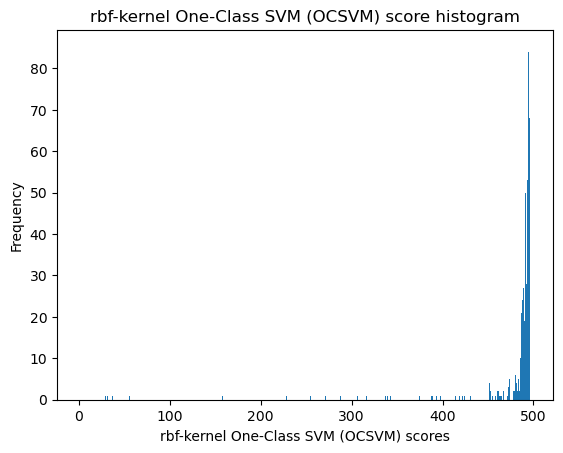

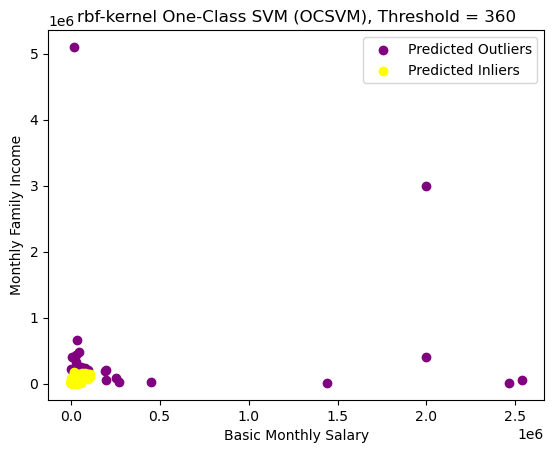

Number of predicted outliers: 38


,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanOthers,payInsurance,loanSSS,payFamilySupport,loanPagIbig,loanGSIS,loanPersonal,houseHasPensioner,houseHasPrivateEmployee,houseHasBusiness,houseHasFreelancer,houseHasGovtEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,home_ownership_class,pred_outlier
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,1,1,0,0,0,0,0,1,0,1,0,0,True
24,8342,"VALDEZ, MOSES",28,50000,3,4,8,200000.0,10000,10000,10000,4000,0,0,0,0,0,2100,10000,1000,2000,2000,0,1000,0,2000,2000,2000,1000,599,1899,0,0,0,0,0,0,0,0,0,0,10000,0,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,True
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,True
50,9989,"BITAS, SHARRAH",23,37266,3,2,4,50000.0,6000,2000,2000,2500,0,0,0,0,0,0,5000,1000,300,2500,0,0,0,0,0,500,500,100,1500,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,0,True
70,10503,"CASTRO, GLENDA",46,200000,3,1,5,200000.0,5000,1000,500,1000,500,1000,1000,500,500,500,1000,0,1000,1000,2000,0,0,0,100,500,500,500,1000,0,0,0,0,0,0,0,0,0,0,5000,0,0,1,0,1,0,0,0,0,1,0,0,0,1,0,1,True
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,True
162,10679,"GONEZ, JAMES",25,80000,3,2,3,203000.0,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,1,0,0,0,1,1,0,1,True
200,10764,"SANTOS, JOHN CARLO",27,60000,3,1,5,65000.0,5000,1000,500,500,0,0,0,0,0,0,20000,5000,500,6000,0,1000,300,300,300,300,300,0,1625,0,0,0,0,0,0,0,0,0,0,200000,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,True
231,11170,"SANTOR, EMELITA",54,7500,1,6,3,16000.0,1000,500,100,48,0,0,0,0,0,0,0,0,100,150,150000,0,0,0,0,0,0,20,366,0,0,10,0,24,0,0,0,0,0,1000,0,0,1,1,0,0,0,0,1,1,0,0,1,1,0,0,True
253,11201,"ABALOS, GLYNN",36,80000,3,2,2,230000.0,13000,2000,1000,3640,0,0,0,0,0,0,0,0,2275,3900,57200,0,0,3000,0,0,0,1300,1625,0,0,0,0,0,0,0,0,0,0,50000,0,0,0,1,0,0,0,0,0,0,0,0,1,1,0,1,True


[14, 24, 32, 50, 70, 114, 162, 200, 231, 253, 299, 323, 325, 380, 391, 405, 417, 435, 515, 556, 558, 563, 568, 584, 608, 677, 692, 702, 706, 762, 773, 830, 868, 912, 929, 940, 1009, 1046]


In [6]:
k = 'rbf'

scores = plot_hist_ocsvm(ho_t01_num, kernel=k,
                         bins=1_000)

ho_t01_outliers = plot_ocsvm(ho_t01_num, k, scores, 360)
print(ho_t01_outliers)

## EDA on Dataset

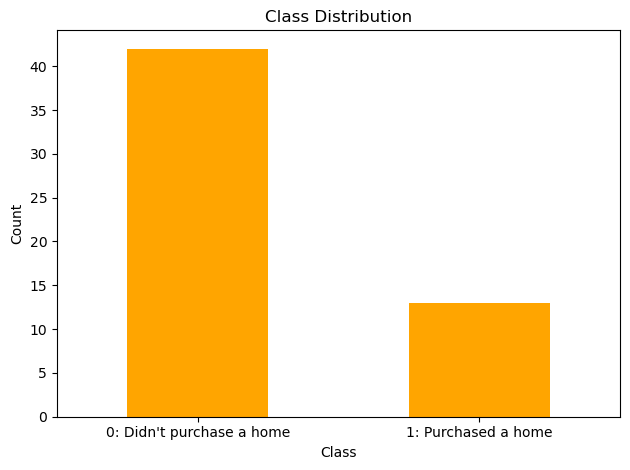

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

0    42
1    13
Name: home_ownership_class, dtype: int64

In [16]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

## Runs: RobustScaler

In [17]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8110370862311737
Std Train Score (Precision) 0.03995795121462126
GridSearchCV Runtime: 5.556687593460083 secs
Run 1 - Random State: 0
Test Precision: 0.16666666666666666
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.

In [18]:
t01_dt_gs, t01_dt_be, t01_dt_model_info, t01_dt_metrics_df = dt_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.38333333333333336
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 30.374574899673462 secs
Run 1 - Random State: 0
Test Precision: 0.16666666666666666
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.2222222222222222
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.1666666666666666


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2350 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [19]:
t01_logreg_gs, t01_logreg_be, t01_logreg_model_info, t01_logreg_metrics_df = logreg_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': None, 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, penalty=None,
                                    random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 8.237990140914917 secs
Run 1 - Random State: 0
Test Precision: 0.125
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Precision: 0.24500000000000002
Stdev Test Precision: 0.11660712766474536
Ave Test Accuracy: 0.5142857142857143
Stdev Test Accuracy: 0.1628822035855


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [20]:
t01_knn_gs, t01_knn_be, t01_knn_model_info, t01_knn_metrics_df = knn_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 5, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4083333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='hamming'))])
Mean Train Score (Precision) 0.4677847249193094
Std Train Score (Precision) 0.11122357938532595
GridSearchCV Runtime: 12.244704723358154 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2222222222222222
Run 5 - Random State: 4
Test Precision: 0.14285714285714285
Ave Test Precision: 0.18968253968253967
Stdev Test Precision: 0.12600065587498815
Ave Test Accuracy: 0.5428571428571428
Stdev Test Accuracy: 0.10832679205787933
Ave Test Specificity: 0.5818181818181818


In [21]:
t01_svm_gs, t01_svm_be, t01_svm_model_info, t01_svm_metrics_df = svm_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 10000.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=10000.0, max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.6815217673202257
Std Train Score (Precision) 0.13526250210419485
GridSearchCV Runtime: 10.951339483261108 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.0
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.5
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2222222222222222
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Precision: 0.2444444444444444
Stdev Test Precision: 0.18675

In [22]:
t01_catboost_gs, t01_catboost_be, t01_catboost_model_info, t01_catboost_metrics_df = catboost_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.001939
0:	learn: 0.6923299	total: 134ms	remaining: 2m 13s
1:	learn: 0.6918970	total: 135ms	remaining: 1m 7s
2:	learn: 0.6904412	total: 138ms	remaining: 45.8s
3:	learn: 0.6891213	total: 140ms	remaining: 34.9s
4:	learn: 0.6881099	total: 143ms	remaining: 28.4s
5:	learn: 0.6870770	total: 145ms	remaining: 24.1s
6:	learn: 0.6860550	total: 148ms	remaining: 21s
7:	learn: 0.6851883	total: 150ms	remaining: 18.5s
8:	learn: 0.6840025	total: 151ms	remaining: 16.7s
9:	learn: 0.6827007	total: 154ms	remaining: 15.2s
10:	learn: 0.6813243	total: 156ms	remaining: 14s
11:	learn: 0.6804811	total: 158ms	remaining: 13s
12:	learn: 0.6788368	total: 161ms	remaining: 12.2s
13:	learn: 0.6775022	total: 163ms	remaining: 11.5s
14:	learn: 0.6763043	total: 165ms	remaining: 10.9s
15:	learn: 0.6752125	total: 168ms	remaining: 10.4s
16:	learn: 0.6741241	total: 171ms	remaining: 9.88s
17:	learn: 0.6731939	total: 173ms	remaining: 9.45s
18:	learn: 0.6721149	total: 175ms	remaining: 9.06s
19:	learn: 0.670

In [23]:
t01_lgbm_gs, t01_lgbm_be, t01_lgbm_model_info, t01_lgbm_metrics_df = lgbm_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

In [24]:
t01_gbm_gs, t01_gbm_be, t01_gbm_model_info, t01_gbm_metrics_df = gbm_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.33333333333333337
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8031315615305747
Std Train Score (Precision) 0.02777425511179767
GridSearchCV Runtime: 56.568517208099365 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.14285714285714285
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - R

In [25]:
t01_rf_gs, t01_rf_be, t01_rf_model_info, t01_rf_metrics_df = rf_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.23333333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.7843005021619783
Std Train Score (Precision) 0.07088381711270271
GridSearchCV Runtime: 223.25564527511597 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State:

In [26]:
t01_xgb_gs, t01_xgb_be, t01_xgb_model_info, t01_xgb_metrics_df = xgb_class2(t01, 'precision',
                                                            'home_ownership_class', RobustScaler(), random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.35833333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', imp

## Results

In [27]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't01_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t01_model_summ)
t01_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t01_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
6,LightGBM,0.420000,0.266250,0.433333,0.446823,0.043189,0.785714,0.071429,0.872727,0.466667,0.865967,0.430000,0.551150
7,Extreme Gradient Boosting (XGBoost),0.326825,0.090268,0.358333,0.801925,0.026443,0.600000,0.129756,0.563636,0.733333,0.879444,0.448283,0.637644
9,CatBoost,0.294444,0.097973,0.266667,0.821678,0.040460,0.585714,0.127775,0.581818,0.600000,0.837778,0.389394,0.579207
5,Gradient Boosting Machine (GBM),0.275714,0.136427,0.333333,0.803132,0.027774,0.571429,0.133631,0.563636,0.600000,0.836508,0.376061,0.571225
2,Logistic Regression,0.245000,0.116607,0.233333,NaN,NaN,0.514286,0.162882,0.509091,0.533333,0.786111,0.331235,0.509722
1,SVM Classifier,0.244444,0.186753,0.300000,0.681522,0.135263,0.557143,0.184888,0.600000,0.400000,0.778636,0.292063,0.435910
4,Random Forest,0.243030,0.058844,0.233333,0.784301,0.070884,0.471429,0.148117,0.418182,0.666667,0.810000,0.348551,0.498321
0,k-Nearest Neighbors,0.189683,0.126001,0.408333,0.467785,0.111224,0.542857,0.108327,0.581818,0.400000,0.783312,0.252698,0.405064
8,AdaBoost,0.180000,0.119257,0.200000,0.811037,0.039958,0.600000,0.081441,0.690909,0.266667,0.774747,0.211111,0.373953
3,Decision Tree,0.177778,0.120442,0.383333,NaN,NaN,0.442857,0.137396,0.418182,0.533333,0.750000,0.264444,0.367830


In [28]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t01_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.785714,LightGBM
Highest Test G-mean,0.637644,Extreme Gradient Boosting (XGBoost)
Highest Test Recall,0.733333,Extreme Gradient Boosting (XGBoost)
Highest Test Precision,0.420000,LightGBM
Highest Test Specificity,0.872727,LightGBM
Highest Test F1-score,0.448283,Extreme Gradient Boosting (XGBoost)


In [287]:
# model = t01_adaboost_be.named_steps['classifier']

# explainer = shap.TreeExplainer(model=model,
#                                data=None,
#                                model_output='raw',
#                                feature_perturbation='tree_path_dependent')

## Runs: StandardScaler

In [29]:
scaler = StandardScaler()

In [30]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8490843456079524
Std Train Score (Precision) 0.042020058063288956
GridSearchCV Runtime: 6.755908966064453 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.2
Ave Test Precision: 0.196666

In [31]:
t01_dt_gs, t01_dt_be, t01_dt_model_info, t01_dt_metrics_df = dt_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.38333333333333336
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 71.26403641700745 secs
Run 1 - Random State: 0
Test Precision: 0.16666666666666666
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.2222222222222222
Run 4 - Random State: 3
Test Precision: 0.375
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test P


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2246 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [32]:
t01_logreg_gs, t01_logreg_be, t01_logreg_model_info, t01_logreg_metrics_df = logreg_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 15.197680950164795 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.125
Run 5 - Random State: 4
Test Precision: 0.4
Ave Test Precision: 0.16214285714285714
Stdev Test Precision: 0.17734579389499178
Ave Test Accuracy: 0.5428571428571429
Stdev Test Accuracy: 0.14811743823805515
Ave Test Specificit


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [33]:
t01_knn_gs, t01_knn_be, t01_knn_model_info, t01_knn_metrics_df = knn_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 7, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.45
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=7))])
Mean Train Score (Precision) 0.5406376976456723
Std Train Score (Precision) 0.1311545172182542
GridSearchCV Runtime: 29.068090200424194 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.38
Stdev Test Precision: 0.07302967433402216
Ave Test Accuracy: 0.7142857142857143
Stdev Test Accuracy: 0.05050762722761051
Ave Test Specificity: 0.78181818181

In [34]:
t01_svm_gs, t01_svm_be, t01_svm_model_info, t01_svm_metrics_df = svm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'sigmoid', 'classifier__probability': True, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.35
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='sigmoid', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.7174102827497268
Std Train Score (Precision) 0.08631999637670777
GridSearchCV Runtime: 21.428970098495483 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.0
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.0
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.0
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2
Ave Test Precision: 0.04
Stdev Test Precision: 0.08944271909999159
Ave Test Accuracy: 0.47142857142857136
Stdev Test 

In [35]:
t01_catboost_gs, t01_catboost_be, t01_catboost_model_info, t01_catboost_metrics_df = catboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.001939
0:	learn: 0.6923299	total: 2.68ms	remaining: 2.67s
1:	learn: 0.6918970	total: 4.18ms	remaining: 2.08s
2:	learn: 0.6904412	total: 7ms	remaining: 2.33s
3:	learn: 0.6891213	total: 9.93ms	remaining: 2.47s
4:	learn: 0.6881099	total: 12.7ms	remaining: 2.52s
5:	learn: 0.6870770	total: 15.3ms	remaining: 2.54s
6:	learn: 0.6860550	total: 17.9ms	remaining: 2.54s
7:	learn: 0.6851883	total: 20.3ms	remaining: 2.52s
8:	learn: 0.6840025	total: 22.4ms	remaining: 2.46s
9:	learn: 0.6827007	total: 25.3ms	remaining: 2.5s
10:	learn: 0.6813243	total: 28.1ms	remaining: 2.53s
11:	learn: 0.6804811	total: 30.8ms	remaining: 2.53s
12:	learn: 0.6788368	total: 33.7ms	remaining: 2.56s
13:	learn: 0.6775022	total: 36.6ms	remaining: 2.58s
14:	learn: 0.6763043	total: 39.4ms	remaining: 2.59s
15:	learn: 0.6752125	total: 42ms	remaining: 2.58s
16:	learn: 0.6741241	total: 44.7ms	remaining: 2.58s
17:	learn: 0.6731939	total: 47.4ms	remaining: 2.58s
18:	learn: 0.6721149	total: 49.9ms	remaining: 2.58

In [36]:
t01_lgbm_gs, t01_lgbm_be, t01_lgbm_model_info, t01_lgbm_metrics_df = lgbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000846 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 764
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive 

In [37]:
t01_gbm_gs, t01_gbm_be, t01_gbm_model_info, t01_gbm_metrics_df = gbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.33333333333333337
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8403410227350049
Std Train Score (Precision) 0.03575838777562047
GridSearchCV Runtime: 27.622240781784058 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.14285714285714285
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 -

In [38]:
t01_rf_gs, t01_rf_be, t01_rf_model_info, t01_rf_metrics_df = rf_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.23333333333333334
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.8290567812641148
Std Train Score (Precision) 0.07902901270755805
GridSearchCV Runtime: 168.93948578834534 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random Stat

In [39]:
t01_xgb_gs, t01_xgb_be, t01_xgb_model_info, t01_xgb_metrics_df = xgb_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.375
Best Estimator: Pipeline(steps=[('scaler', StandardScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type

In [40]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't01_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t01_model_summ)
t01_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t01_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
6,LightGBM,0.433333,0.278887,0.400000,0.445493,0.041194,0.785714,0.071429,0.854545,0.533333,0.881119,0.466667,0.586407
0,k-Nearest Neighbors,0.380000,0.073030,0.450000,0.540638,0.131155,0.714286,0.050508,0.781818,0.466667,0.846717,0.402222,0.588519
7,Extreme Gradient Boosting (XGBoost),0.326825,0.090268,0.375000,0.842031,0.035377,0.600000,0.129756,0.563636,0.733333,0.879444,0.448283,0.637644
9,CatBoost,0.294444,0.097973,0.266667,0.869723,0.044288,0.585714,0.127775,0.581818,0.600000,0.837778,0.389394,0.579207
5,Gradient Boosting Machine (GBM),0.285238,0.138938,0.333333,0.840341,0.035758,0.585714,0.137396,0.581818,0.600000,0.840079,0.384949,0.580888
4,Random Forest,0.256667,0.048016,0.233333,0.829057,0.079029,0.485714,0.127775,0.418182,0.733333,0.876667,0.371409,0.513970
8,AdaBoost,0.196667,0.122701,0.250000,0.849084,0.042020,0.628571,0.059761,0.727273,0.266667,0.784747,0.223810,0.387146
3,Decision Tree,0.186111,0.134514,0.383333,NaN,NaN,0.457143,0.156492,0.436364,0.533333,0.750000,0.273535,0.380700
2,Logistic Regression,0.162143,0.177346,0.400000,NaN,NaN,0.542857,0.148117,0.600000,0.333333,0.765873,0.216364,0.329498
1,SVM Classifier,0.040000,0.089443,0.350000,0.717410,0.086320,0.471429,0.199489,0.581818,0.066667,0.664343,0.050000,0.092113


In [41]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t01_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.785714,LightGBM
Highest Test G-mean,0.637644,Extreme Gradient Boosting (XGBoost)
Highest Test Recall,0.733333,Random Forest
Highest Test Precision,0.433333,LightGBM
Highest Test Specificity,0.854545,LightGBM
Highest Test F1-score,0.466667,LightGBM


## Runs: MinMaxScaler

In [42]:
scaler = MinMaxScaler()

In [43]:
t01_adaboost_gs, t01_adaboost_be, t01_adaboost_model_info, t01_adaboost_metrics_df = adaboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8529817349832829
Std Train Score (Precision) 0.034258822845028084
GridSearchCV Runtime: 6.906320810317993 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.6666666666666666
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.3333333333333333


In [44]:
t01_dt_gs, t01_dt_be, t01_dt_model_info, t01_dt_metrics_df = dt_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.38333333333333336
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 61.718708992004395 secs
Run 1 - Random State: 0
Test Precision: 0.16666666666666666
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.2222222222222222
Run 4 - Random State: 3
Test Precision: 0.33333333


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2335 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [45]:
t01_logreg_gs, t01_logreg_be, t01_logreg_model_info, t01_logreg_metrics_df = logreg_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 0.0001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.41666666666666663
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 LogisticRegression(C=0.0001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 14.5981924533844 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.1
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.17714285714285713
Stdev Test Precision: 0.13566832972956502
Ave Test Accuracy: 0.5
Stdev Test Accuracy: 0.16751484856512247
Ave Test Specificity: 0.5272727272727272
Ave Test Rec


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [46]:
t01_knn_gs, t01_knn_be, t01_knn_model_info, t01_knn_metrics_df = knn_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 12, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.5
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=12))])
Mean Train Score (Precision) 0.5651326979696476
Std Train Score (Precision) 0.11098729813589932
GridSearchCV Runtime: 27.995612621307373 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.5
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Precision: 0.29047619047619044
Stdev Test Precision: 0.1816402964072443
Ave Test Accuracy: 0.6714285714285714
Stdev Test Accuracy: 0.08144110179279557
Ave Test Specificity: 0.7272727272727273


In [47]:
t01_svm_gs, t01_svm_be, t01_svm_model_info, t01_svm_metrics_df = svm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 10.0, 'classifier__kernel': 'sigmoid', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.5333333333333334
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=10.0, kernel='sigmoid', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.6282126811873702
Std Train Score (Precision) 0.08358953970484509
GridSearchCV Runtime: 20.191447973251343 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.3333333333333333
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.0
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.3333333333333333
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.285714285714

In [48]:
t01_catboost_gs, t01_catboost_be, t01_catboost_model_info, t01_catboost_metrics_df = catboost_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.001939
0:	learn: 0.6923299	total: 2.14ms	remaining: 2.14s
1:	learn: 0.6918970	total: 3.45ms	remaining: 1.72s
2:	learn: 0.6904412	total: 6.06ms	remaining: 2.02s
3:	learn: 0.6891213	total: 21.1ms	remaining: 5.26s
4:	learn: 0.6881099	total: 23.8ms	remaining: 4.74s
5:	learn: 0.6870770	total: 26.3ms	remaining: 4.35s
6:	learn: 0.6860550	total: 28.8ms	remaining: 4.08s
7:	learn: 0.6851883	total: 30.6ms	remaining: 3.8s
8:	learn: 0.6840025	total: 32.5ms	remaining: 3.58s
9:	learn: 0.6827007	total: 34.8ms	remaining: 3.44s
10:	learn: 0.6813243	total: 37ms	remaining: 3.33s
11:	learn: 0.6804811	total: 39.3ms	remaining: 3.23s
12:	learn: 0.6788368	total: 41.3ms	remaining: 3.13s
13:	learn: 0.6775022	total: 43.5ms	remaining: 3.06s
14:	learn: 0.6763043	total: 45.7ms	remaining: 3s
15:	learn: 0.6752125	total: 47.8ms	remaining: 2.94s
16:	learn: 0.6741241	total: 50.1ms	remaining: 2.9s
17:	learn: 0.6731939	total: 52.6ms	remaini

In [49]:
t01_lgbm_gs, t01_lgbm_be, t01_lgbm_model_info, t01_lgbm_metrics_df = lgbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 697
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [50]:
t01_gbm_gs, t01_gbm_be, t01_gbm_model_info, t01_gbm_metrics_df = gbm_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.33333333333333337
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8282011891746025
Std Train Score (Precision) 0.027339795491196223
GridSearchCV Runtime: 26.652092456817627 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.14285714285714285
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - 

In [51]:
t01_rf_gs, t01_rf_be, t01_rf_model_info, t01_rf_metrics_df = rf_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 300, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.23333333333333334
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=300, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.8488213258082647
Std Train Score (Precision) 0.06375314016430823
GridSearchCV Runtime: 169.64862251281738 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State:

In [52]:
t01_xgb_gs, t01_xgb_be, t01_xgb_model_info, t01_xgb_metrics_df = xgb_class2(t01, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.35833333333333334
Best Estimator: Pipeline(steps=[('scaler', MinMaxScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', imp

In [53]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't01_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t01_model_summ)
t01_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t01_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
6,LightGBM,0.386667,0.236408,0.433333,0.443460,0.040841,0.771429,0.059761,0.872727,0.400000,0.850816,0.376667,0.505546
7,Extreme Gradient Boosting (XGBoost),0.326825,0.090268,0.358333,0.846711,0.038503,0.600000,0.129756,0.563636,0.733333,0.879444,0.448283,0.637644
9,CatBoost,0.294444,0.097973,0.266667,0.874901,0.039246,0.585714,0.127775,0.581818,0.600000,0.837778,0.389394,0.579207
0,k-Nearest Neighbors,0.290476,0.181640,0.500000,0.565133,0.110987,0.671429,0.081441,0.727273,0.466667,0.840065,0.349841,0.503029
5,Gradient Boosting Machine (GBM),0.275714,0.136427,0.333333,0.828201,0.027340,0.571429,0.133631,0.563636,0.600000,0.836508,0.376061,0.571225
8,AdaBoost,0.266667,0.278887,0.300000,0.852982,0.034259,0.685714,0.095831,0.763636,0.400000,0.831818,0.311111,0.416235
4,Random Forest,0.243030,0.058844,0.233333,0.848821,0.063753,0.471429,0.148117,0.418182,0.666667,0.810000,0.348551,0.498321
1,SVM Classifier,0.190476,0.174964,0.533333,0.628213,0.083590,0.600000,0.119523,0.690909,0.266667,0.777489,0.213333,0.329498
3,Decision Tree,0.177778,0.120442,0.383333,NaN,NaN,0.442857,0.137396,0.418182,0.533333,0.750000,0.264444,0.367830
2,Logistic Regression,0.177143,0.135668,0.416667,NaN,NaN,0.500000,0.167515,0.527273,0.400000,0.741883,0.244103,0.385389


In [54]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t01_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.771429,LightGBM
Highest Test G-mean,0.637644,Extreme Gradient Boosting (XGBoost)
Highest Test Recall,0.733333,Extreme Gradient Boosting (XGBoost)
Highest Test Precision,0.386667,LightGBM
Highest Test Specificity,0.872727,LightGBM
Highest Test F1-score,0.448283,Extreme Gradient Boosting (XGBoost)


# HO_T02: Yes - 1, 30

In [55]:
t02 = dataset.copy().drop(columns=cols_with_nulls)
# t02_num = t02.drop(columns=['gender', 'province', 'job'])
t02 = pd.get_dummies(t02, columns=['gender'], prefix='gender', drop_first='True')
t02 = pd.get_dummies(t02, columns=['province'], prefix='province', drop_first='True')
t02 = pd.get_dummies(t02, columns=['job'], prefix='job', drop_first='True')

t02.loc[t02['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t02.isna().sum()[t02.isna().sum() > 0]
df = t02

## EDA on Dataset

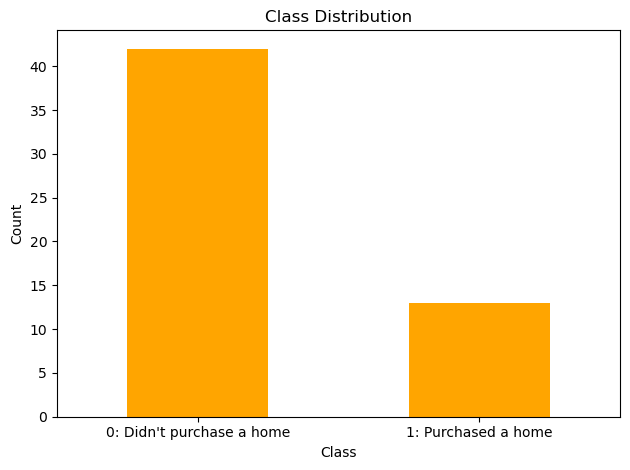

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

0    42
1    13
Name: home_ownership_class, dtype: int64

In [56]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

## Runs: RobustScaler()

In [57]:
scaler = RobustScaler()

In [58]:
t02_adaboost_gs, t02_adaboost_be, t02_adaboost_model_info, t02_adaboost_metrics_df = adaboost_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.812072712369741
Std Train Score (Precision) 0.03396583392154517
GridSearchCV Runtime: 6.3760597705841064 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - Random State: 4
Test Precision: 0.25
Ave 

In [59]:
t02_dt_gs, t02_dt_be, t02_dt_model_info, t02_dt_metrics_df = dt_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4499999999999999
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=2,
                                        max_features='sqrt', random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 92.07697033882141 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 1.0
Run 5 - Random State: 4


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2295 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [60]:
t02_logreg_gs, t02_logreg_be, t02_logreg_model_info, t02_logreg_metrics_df = logreg_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': None, 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, penalty=None,
                                    random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 21.69107723236084 secs
Run 1 - Random State: 0
Test Precision: 0.1111111111111111
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2222222222222222
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Precision: 0.24666666666666665
Stdev Test Precision: 0.11873822228793376
Ave Test Accuracy: 0.5142857142857142
Stdev Te


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [61]:
t02_knn_gs, t02_knn_be, t02_knn_model_info, t02_knn_metrics_df = knn_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 15, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.41666666666666663
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=15))])
Mean Train Score (Precision) 0.47154191827859127
Std Train Score (Precision) 0.11131255486389513
GridSearchCV Runtime: 36.743855237960815 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.3071428571428571
Stdev Test Precision: 0.038020760530169784
Ave Test Accuracy: 0.6285714285714287
Stdev Test Accuracy: 0.09313

In [62]:
t02_svm_gs, t02_svm_be, t02_svm_model_info, t02_svm_metrics_df = svm_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=1000000.0, kernel='poly', max_iter=1000,
                     probability=True, random_state=0, verbose=True))])
Mean Train Score (Precision) 0.6764640139082833
Std Train Score (Precision) 0.13777734069631017
GridSearchCV Runtime: 29.1316819190979 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.6666666666666666
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.5
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.0
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.2333333333333333
Stdev Test Precision: 0.32489314482696546
Ave Test Accuracy: 0.7

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [63]:
t02_catboost_gs, t02_catboost_be, t02_catboost_model_info, t02_catboost_metrics_df = catboost_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.001939
0:	learn: 0.6923299	total: 2.68ms	remaining: 2.68s
1:	learn: 0.6912812	total: 6.02ms	remaining: 3s
2:	learn: 0.6904314	total: 8.9ms	remaining: 2.96s
3:	learn: 0.6892269	total: 12.1ms	remaining: 3s
4:	learn: 0.6882991	total: 15ms	remaining: 2.99s
5:	learn: 0.6870175	total: 18.4ms	remaining: 3.05s
6:	learn: 0.6861607	total: 21.5ms	remaining: 3.05s
7:	learn: 0.6848834	total: 24.8ms	remaining: 3.08s
8:	learn: 0.6833632	total: 27.9ms	remaining: 3.07s
9:	learn: 0.6819532	total: 31.1ms	remaining: 3.08s
10:	learn: 0.6808869	total: 34.2ms	remaining: 3.07s
11:	learn: 0.6795986	total: 37ms	remaining: 3.04s
12:	learn: 0.6785795	total: 39.9ms	remaining: 3.03s
13:	learn: 0.6778620	total: 42.9ms	remaining: 3.02s
14:	learn: 0.6765267	total: 45.3ms	remaining: 2.98s
15:	learn: 0.6752727	total: 48.2ms	remaining: 2.96s
16:	learn: 0.6745859	total: 51.1ms	remaining: 2.95s
17:	learn: 0.6731322	total: 54.1ms	remaining: 2.95s
18:	learn: 0.6717230	total: 57ms	remaining: 2.94s
19:	l

In [64]:
t02_lgbm_gs, t02_lgbm_be, t02_lgbm_model_info, t02_lgbm_metrics_df = lgbm_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001289 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1037
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 73
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with posi

[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


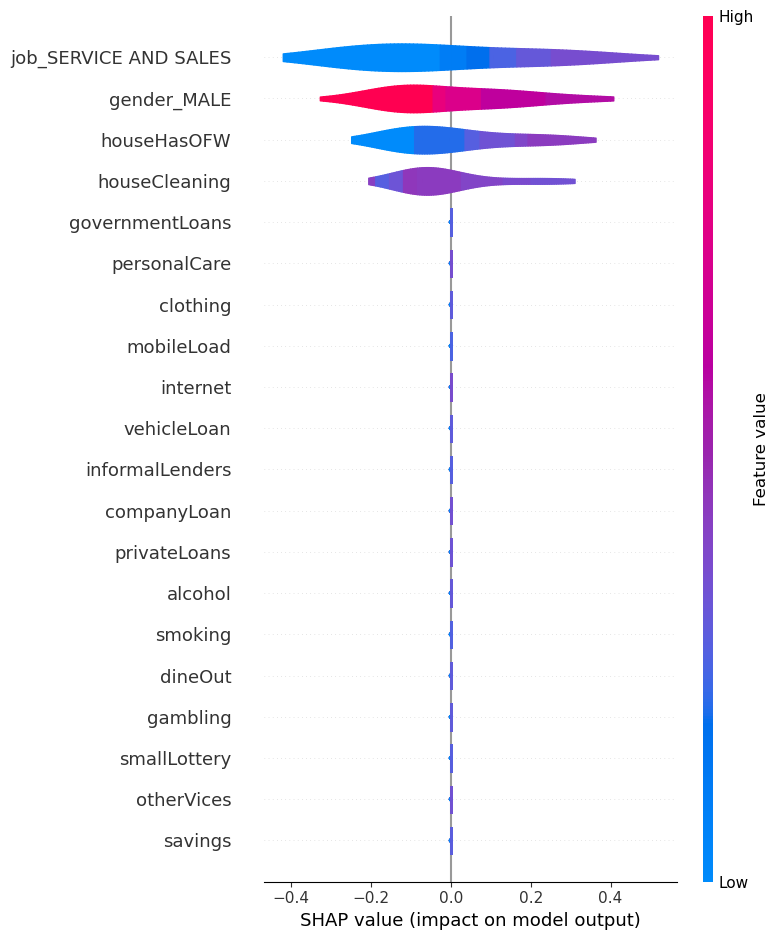

In [262]:
df = t02.copy()
# model = ho_t02_xgb_be.named_steps['classifier']
model = t02_lgbm_be
label_col = 'home_ownership_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)
# explainer = shap.TreeExplainer(model=model,
#                                data=X_test,
#                                model_output='raw',
# #                                feature_perturbation='tree_path_dependent'
#                               )

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)
# shap_values = explainer.shap_values(X_test)

feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [65]:
t02_gbm_gs, t02_gbm_be, t02_gbm_model_info, t02_gbm_metrics_df = gbm_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8077735640377594
Std Train Score (Precision) 0.030988145390521117
GridSearchCV Runtime: 29.623978853225708 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.5
Run 5 - Random State: 4
Test Precision: 0.25
Ave Test Precision: 

In [66]:
t02_rf_gs, t02_rf_be, t02_rf_model_info, t02_rf_metrics_df = rf_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.7822524465132067
Std Train Score (Precision) 0.0741803277236855
GridSearchCV Runtime: 182.24589800834656 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 1.0
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Rando

In [67]:
t02_xgb_gs, t02_xgb_be, t02_xgb_model_info, t02_xgb_metrics_df = xgb_class2(t02, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.35
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, l

## Results

In [68]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't02_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t02_model_summ)
t02_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t02_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
6,LightGBM,0.526667,0.271211,0.333333,0.437253,0.033025,0.757143,0.108327,0.781818,0.666667,0.893889,0.563175,0.719801
3,Decision Tree,0.333333,0.408248,0.450000,NaN,NaN,0.628571,0.162882,0.709091,0.333333,0.811655,0.266667,0.354757
4,Random Forest,0.316667,0.409946,0.200000,0.782252,0.074180,0.728571,0.078246,0.872727,0.200000,0.800559,0.223810,0.318390
0,k-Nearest Neighbors,0.307143,0.038021,0.416667,0.471542,0.111313,0.628571,0.093131,0.654545,0.533333,0.840368,0.374949,0.569862
9,CatBoost,0.301587,0.095185,0.233333,0.824316,0.037811,0.600000,0.119523,0.600000,0.600000,0.842540,0.396667,0.589715
7,Extreme Gradient Boosting (XGBoost),0.296032,0.116966,0.350000,0.809489,0.026727,0.542857,0.148117,0.490909,0.733333,0.858095,0.419394,0.598208
2,Logistic Regression,0.246667,0.118738,0.233333,NaN,NaN,0.514286,0.170533,0.509091,0.533333,0.782778,0.333333,0.513586
1,SVM Classifier,0.233333,0.324893,0.300000,0.676464,0.137777,0.771429,0.078246,0.909091,0.266667,0.826104,0.247619,0.303410
8,AdaBoost,0.217143,0.123367,0.250000,0.812073,0.033966,0.485714,0.078246,0.436364,0.666667,0.878095,0.325035,0.436586
5,Gradient Boosting Machine (GBM),0.200000,0.209165,0.300000,0.807774,0.030988,0.685714,0.063888,0.800000,0.266667,0.803846,0.228571,0.344656


In [69]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t02_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.771429,SVM Classifier
Highest Test G-mean,0.719801,LightGBM
Highest Test Recall,0.733333,Extreme Gradient Boosting (XGBoost)
Highest Test Precision,0.526667,LightGBM
Highest Test Specificity,0.909091,SVM Classifier
Highest Test F1-score,0.563175,LightGBM


# HO_T03: Yes - 30, 31

In [70]:
t03 = dataset.copy().drop(columns=cols_with_nulls)
# t03 = t03[t03['positiveMonthlySoloNetIncome'] != 0]
# t03_num = t03.drop(columns=['gender', 'province', 'job'])
t03 = pd.get_dummies(t03, columns=['gender'], prefix='gender', drop_first='True')
t03 = pd.get_dummies(t03, columns=['province'], prefix='province', drop_first='True')
t03 = pd.get_dummies(t03, columns=['job'], prefix='job', drop_first='True')

# t03.loc[t03['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t03.isna().sum()[t03.isna().sum() > 0]
df = t03

## EDA on Dataset

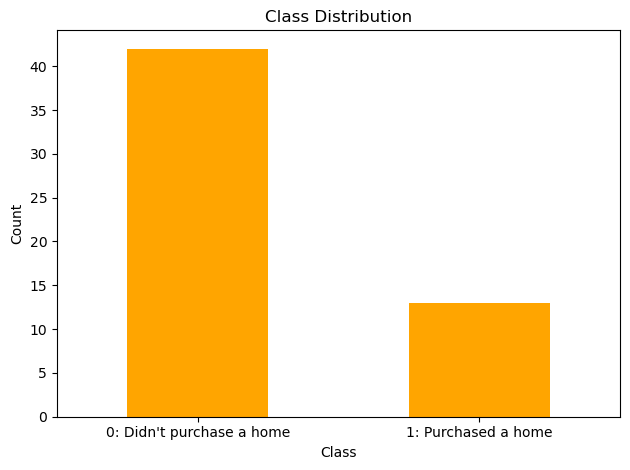

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

0    42
1    13
Name: home_ownership_class, dtype: int64

In [71]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

In [72]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

t03 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 23
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_RIZAL', 'province_UNKNOWN', 'job_ASSOCIATE PROFESSIONAL', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


## Runs: RobustScaler()

In [73]:
scaler = RobustScaler()

In [74]:
t03_adaboost_gs, t03_adaboost_be, t03_adaboost_model_info, t03_adaboost_metrics_df = adaboost_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.21666666666666665
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8155695287886162
Std Train Score (Precision) 0.03519368678814566
GridSearchCV Runtime: 8.070940732955933 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Prec

In [75]:
t03_dt_gs, t03_dt_be, t03_dt_model_info, t03_dt_metrics_df = dt_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2346 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3666666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        max_features='log2', random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 91.29742002487183 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.125
Run 3 - Random State: 2
Test Precision: 0.16666666666666666
Run 4 - Random State: 3
Test Precision: 0.14285714285714285
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.08690

In [76]:
t03_logreg_gs, t03_logreg_be, t03_logreg_model_info, t03_logreg_metrics_df = logreg_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': None, 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, penalty=None,
                                    random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 20.859471559524536 secs
Run 1 - Random State: 0
Test Precision: 0.1111111111111111
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.1111111111111111
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Precision: 0.23777777777777778
Stdev Test Precision: 0.1498147003616


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [77]:
t03_knn_gs, t03_knn_be, t03_knn_model_info, t03_knn_metrics_df = knn_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 5, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='hamming'))])
Mean Train Score (Precision) 0.4603952350726644
Std Train Score (Precision) 0.1088349893008467
GridSearchCV Runtime: 35.30899238586426 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.22666666666666666
Stdev Test Precision: 0.1534781924429512
Ave Test Accuracy: 0.6285714285714286
Stdev Test Accuracy: 0.05976143046671971
Ave Test Specificity: 0.6909090909090908
Ave Test Recall: 0.4
Ave Test NPV: 

In [78]:
t03_svm_gs, t03_svm_be, t03_svm_model_info, t03_svm_metrics_df = svm_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=1000000.0, kernel='poly', max_iter=1000,
                     probability=True, random_state=0, verbose=True))])
Mean Train Score (Precision) 0.6793696640405227
Std Train Score (Precision) 0.13538323937498714
GridSearchCV Runtime: 29.06362819671631 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.6666666666666666
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.6666666666666666
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.6666666666666666
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.4
Stdev Test Precision: 0.3651483716701107
Ave Tes

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [79]:
t03_catboost_gs, t03_catboost_be, t03_catboost_model_info, t03_catboost_metrics_df = catboost_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.001939
0:	learn: 0.6923323	total: 2.59ms	remaining: 2.59s
1:	learn: 0.6911746	total: 5.46ms	remaining: 2.72s
2:	learn: 0.6901593	total: 7.98ms	remaining: 2.65s
3:	learn: 0.6889845	total: 10.5ms	remaining: 2.6s
4:	learn: 0.6877845	total: 12.9ms	remaining: 2.57s
5:	learn: 0.6871014	total: 15.6ms	remaining: 2.58s
6:	learn: 0.6862764	total: 18.2ms	remaining: 2.58s
7:	learn: 0.6849690	total: 21.1ms	remaining: 2.62s
8:	learn: 0.6841657	total: 23.9ms	remaining: 2.63s
9:	learn: 0.6829500	total: 26.2ms	remaining: 2.59s
10:	learn: 0.6817442	total: 29ms	remaining: 2.6s
11:	learn: 0.6808774	total: 31.8ms	remaining: 2.62s
12:	learn: 0.6798807	total: 34.2ms	remaining: 2.6s
13:	learn: 0.6788779	total: 36.6ms	remaining: 2.58s
14:	learn: 0.6778279	total: 39.1ms	remaining: 2.57s
15:	learn: 0.6763014	total: 41.7ms	remaining: 2.57s
16:	learn: 0.6749686	total: 44.4ms	remaining: 2.56s
17:	learn: 0.6736380	total: 47.6ms	remaining: 2.6s
18:	learn: 0.6725104	total: 49.9ms	remaining: 2.58

In [80]:
t03_lgbm_gs, t03_lgbm_be, t03_lgbm_model_info, t03_lgbm_metrics_df = lgbm_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000849 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 714
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 68
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [81]:
t03_gbm_gs, t03_gbm_be, t03_gbm_model_info, t03_gbm_metrics_df = gbm_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.31666666666666665
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8020013197244941
Std Train Score (Precision) 0.027825502118930902
GridSearchCV Runtime: 25.153676748275757 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.1111111111111111
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - R

In [82]:
t03_rf_gs, t03_rf_be, t03_rf_model_info, t03_rf_metrics_df = rf_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.24166666666666664
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.7748026623024191
Std Train Score (Precision) 0.07200775273668428
GridSearchCV Runtime: 192.8770010471344 secs
Run 1 - Random State: 0
Test Precision: 0.125
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision:

In [83]:
t03_xgb_gs, t03_xgb_be, t03_xgb_model_info, t03_xgb_metrics_df = xgb_class2(t03, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.35833333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', imp

## Results

In [84]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't03_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t03_model_summ)
t03_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t03_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
6,LightGBM,0.420000,0.266250,0.433333,0.443869,0.044416,0.785714,0.071429,0.872727,0.466667,0.865967,0.430000,0.551150
1,SVM Classifier,0.400000,0.365148,0.300000,0.679370,0.135383,0.814286,0.063888,0.927273,0.400000,0.856444,0.400000,0.467099
7,Extreme Gradient Boosting (XGBoost),0.326825,0.090268,0.358333,0.800607,0.027245,0.600000,0.129756,0.563636,0.733333,0.879444,0.448283,0.637644
9,CatBoost,0.300159,0.106160,0.250000,0.829714,0.037982,0.585714,0.127775,0.563636,0.666667,0.860000,0.409394,0.599490
4,Random Forest,0.265476,0.145900,0.241667,0.774803,0.072008,0.571429,0.159719,0.618182,0.400000,0.781429,0.297951,0.484085
5,Gradient Boosting Machine (GBM),0.263810,0.146102,0.316667,0.802001,0.027826,0.528571,0.186263,0.509091,0.600000,0.806984,0.363333,0.542054
2,Logistic Regression,0.237778,0.149815,0.233333,NaN,NaN,0.500000,0.214286,0.509091,0.466667,0.745556,0.311111,0.484409
0,k-Nearest Neighbors,0.226667,0.153478,0.483333,0.460395,0.108835,0.628571,0.059761,0.690909,0.400000,0.813889,0.288889,0.453756
8,AdaBoost,0.163333,0.096032,0.216667,0.815570,0.035194,0.585714,0.059761,0.672727,0.266667,0.771111,0.201587,0.367980
3,Decision Tree,0.086905,0.080698,0.366667,NaN,NaN,0.471429,0.148117,0.545455,0.200000,0.705037,0.120808,0.232761


In [85]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t03_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.814286,SVM Classifier
Highest Test G-mean,0.637644,Extreme Gradient Boosting (XGBoost)
Highest Test Recall,0.733333,Extreme Gradient Boosting (XGBoost)
Highest Test Precision,0.420000,LightGBM
Highest Test Specificity,0.927273,SVM Classifier
Highest Test F1-score,0.448283,Extreme Gradient Boosting (XGBoost)


# HO_T04: Yes - 30, 31, 32

In [86]:
t04 = dataset.copy().drop(columns=cols_with_nulls)
# t04 = t04[t04['positiveMonthlyFamilyNetIncome'] != 0]
# t04_num = t04.drop(columns=['gender', 'province', 'job'])
t04 = pd.get_dummies(t04, columns=['gender'], prefix='gender', drop_first='True')
t04 = pd.get_dummies(t04, columns=['province'], prefix='province', drop_first='True')
t04 = pd.get_dummies(t04, columns=['job'], prefix='job', drop_first='True')

# t04.loc[t04['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t04.isna().sum()[t04.isna().sum() > 0]
df = t04

## EDA on Dataset

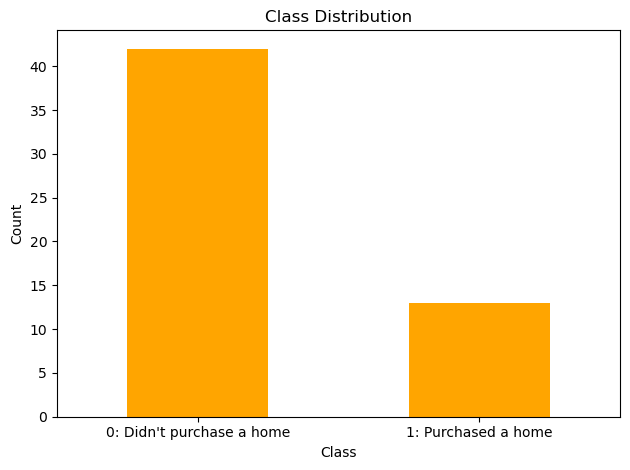

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

0    42
1    13
Name: home_ownership_class, dtype: int64

In [87]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()
display(df['home_ownership_class'].value_counts(normalize=True))
display(df['home_ownership_class'].value_counts())

In [88]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

t04 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 23
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_RIZAL', 'province_UNKNOWN', 'job_ASSOCIATE PROFESSIONAL', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


In [89]:
df_mod2 = df_mod.copy()
cols_to_drop = [
    # 'smallLottery', 'otherVices', 'alcohol', 'cinema',
    'monthlySoloNetIncome', 'monthlySoloNetIncomeWithSavings',
    'basicMonthlySalary - monthlyExpenses', 'monthlyUtilityBills',
    'positive basicMonthlySalary - monthlyExpenses', 'monthlyFamilyIncome - monthlyExpenses',
    'positive monthlyFamilyIncome - monthlyExpenses'
]
df_mod2 = df_mod2.drop(columns=cols_to_drop)

# Calculate the correlation matrix
correlation_matrix = df_mod2.corr()

# Find pairs of columns where the correlation is greater than 0.8
# This will ignore the diagonal which will always be 1 (self correlation)
to_drop = set()
for i in range(len(correlation_matrix)):
    for j in range(i+1, len(correlation_matrix)):
        if correlation_matrix.iloc[i, j] >= 0.9:
            colname = correlation_matrix.columns[j]  # Getting the column name
            to_drop.add(colname)
            print(correlation_matrix.columns[i], "|", colname, "| Correlation:",
                  correlation_matrix.iloc[i, j])

print("\nAfter dropping correlated features:")
df_mod2
# ho_t02_X_f02 = ho_t02.copy().drop(columns=cols_to_drop)

basicMonthlySalary | basicMonthlySalary / monthlyFamilyIncome | Correlation: 0.9975560699704674
hygiene | houseCleaning | Correlation: 0.9041448737327424
cinema | dineOut | Correlation: 0.9259936704358567
cinema | personalCare | Correlation: 0.9212934425876474
cinema | smoking | Correlation: 0.9800461667031197
cinema | alcohol | Correlation: 0.9840443650290287
cinema | gambling | Correlation: 0.982239021288554
cinema | smallLottery | Correlation: 0.9798700395037976
cinema | otherVices | Correlation: 0.9818552696353127
cinema | monthlyVices | Correlation: 0.9842965092551951
cinema | monthlyVices / monthlyFamilyIncome | Correlation: 0.9837343599650904
dineOut | personalCare | Correlation: 0.9776917865866701
dineOut | informalLenders | Correlation: 0.9301528444591949
dineOut | smoking | Correlation: 0.9193571988519342
dineOut | alcohol | Correlation: 0.9281951013908212
dineOut | gambling | Correlation: 0.9115954529878896
dineOut | smallLottery | Correlation: 0.9066608461864252
dineOut | o

,age,Unnamed: 0,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,monthlyVices,monthlyExpenses,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / monthlyFamilyIncome,monthlyVices / monthlyFamilyIncome,gender_MALE,province_CAVITE,province_METRO MANILA,job_SERVICE AND SALES
0,40.0,12.0,30000.0,3.0,1.0,3.0,30000.0,3000.0,2000.0,1000.0,1500.0,1000.0,1500.0,2000.0,500.0,300.0,200.0,100.0,100.0,500.0,600.0,4600.0,500.0,200.0,200.0,500.0,100.0,100.0,50.0,1000.0,1200.0,100.0,1000.0,1000.0,1000.0,10.0,10.0,0.0,50.0,20.0,15000.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,58.0,90.0,25940.0,1.0,4060.0,1.0,1.0,19060.0,1.0,0.0,0.0,1.000000,0.864667,0.003000,0.0,1.0,0.0,1.0
1,36.0,14.0,2534900.0,3.0,2.0,5.0,50000.0,5000.0,5000.0,5000.0,5000.0,4000.0,5000.0,2000.0,5000.0,1000.0,5000.0,10000.0,10000.0,1000.0,2500.0,4500.0,5000.0,500.0,5000.0,5000.0,5000.0,5000.0,2500.0,2500.0,5500.0,5000.0,5000.0,5000.0,5000.0,500.0,500.0,100.0,1.0,1.0,5000.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,69.0,1102.0,127102.0,1.0,-77102.0,0.0,1.0,-72102.0,0.0,-2484900.0,0.0,50.698000,2.542040,0.022040,0.0,0.0,0.0,0.0
2,35.0,32.0,200000.0,3.0,2.0,3.0,50000.0,2000.0,1000.0,500.0,1000.0,100.0,100.0,1500.0,2000.0,1000.0,1000.0,1000.0,1000.0,500.0,500.0,2000.0,1000.0,500.0,500.0,500.0,1000.0,500.0,700.0,500.0,100.0,100.0,100.0,100.0,1000.0,100.0,100.0,100.0,100.0,100.0,1000.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,151.0,500.0,22300.0,1.0,27700.0,1.0,1.0,28700.0,1.0,-150000.0,0.0,4.000000,0.446000,0.010000,0.0,0.0,0.0,0.0
3,26.0,79.0,25000.0,1.0,5.0,3.0,25000.0,7000.0,1500.0,1500.0,400.0,0.0,0.0,1500.0,200.0,300.0,500.0,1235.0,1411.0,600.0,600.0,2500.0,0.0,0.0,0.0,0.0,500.0,500.0,500.0,0.0,0.0,0.0,0.0,0.0,0.0,500.0,300.0,500.0,200.0,100.0,500.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,179.0,1600.0,22346.0,1.0,2654.0,1.0,1.0,3154.0,1.0,0.0,0.0,1.000000,0.893840,0.064000,1.0,0.0,0.0,1.0
4,40.0,103.0,19000.0,3.0,1.0,9.0,24000.0,10000.0,2000.0,1000.0,1500.0,300.0,1500.0,200.0,1800.0,1500.0,500.0,1000.0,500.0,280.0,1500.0,3000.0,500.0,0.0,100.0,250.0,150.0,1000.0,600.0,0.0,2500.0,2000.0,3000.0,500.0,3000.0,0.0,0.0,0.0,500.0,200.0,5000.0,1.0,1.0,1.0,1.0,0.0,1.0,0.0,194.0,700.0,40880.0,0.0,-16880.0,0.0,0.0,-11880.0,0.0,5000.0,1.0,0.791667,1.703333,0.029167,1.0,0.0,0.0,1.0
5,30.0,111.0,33000.0,3.0,3.0,5.0,50000.0,3500.0,150.0,100.0,50.0,30.0,100.0,100.0,100.0,100.0,100.0,3000.0,1500.0,500.0,2000.0,1500.0,1500.0,200.0,500.0,500.0,200.0,500.0,300.0,300.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,100.0,500.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,181.0,500.0,17830.0,1.0,32170.0,1.0,1.0,32670.0,1.0,17000.0,1.0,0.660000,0.356600,0.010000,1.0,0.0,1.0,0.0
6,40.0,114.0,19000.0,1.0,0.0,0.0,190000.0,1.0,3.0,4.0,3.0,1.0,1.0,1.0,2.0,2.0,1.0,4.0,4.0,5.0,5.0,4500.0,2.0,6.0,6.0,6.0,6.0,6.0,8.0,2.0,8.0,8.0,8.0,8.0,6.0,9.0,9.0,9.0,9.0,9.0,10.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,181.0,45.0,4662.0,1.0,185338.0,1.0,1.0,185348.0,1.0,171000.0,1.0,0.100000,0.024537,0.000237,1.0,0.0,1.0,1.0
7,29.0,126.0,80000.0,3.0,2.0,4.0,160000.0,4000.0,1000.0,500.0,500.0,100.0,100.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,181.0,5.0,6227.0,1.0,153773.0,1.0,1.0,153774.0,1.0,80000

In [90]:
t04 = t04.copy().drop(columns=cols_to_drop).drop(columns=['Unnamed: 0'])
t04

,userId,lastFirstName,age,basicMonthlySalary,preferredNetDisposableIncomeId,workingFamilyCount,residentsCount,monthlyFamilyIncome,food,hygiene,houseCleaning,fare,parking,gasoline,tuition,allowance,uniform,otherEducation,emergency,medicine,water,electricity,rent,repair,cinema,dineOut,leisure,personalCare,clothing,mobileLoad,internet,vehicleLoan,informalLenders,companyLoan,privateLoans,governmentLoans,smoking,alcohol,gambling,smallLottery,otherVices,savings,loanSSS,payFamilySupport,loanPagIbig,houseHasPrivateEmployee,houseHasOFW,houseOnlyFamily,houseExtendedFamily,daysFromDateEntryStart,home_ownership_class,monthlyVices,monthlyExpenses,positiveMonthlySoloNetIncome,monthlyFamilyNetIncome,positiveMonthlyFamilyNetIncome,positiveMonthlySoloNetIncomeWithSavings,monthlyFamilyNetIncomeWithSavings,positiveMonthlyFamilyNetIncomeWithSavings,monthlyFamilyIncome - basicMonthlySalary,positive monthlyFamilyIncome - basicMonthlySalary,basicMonthlySalary / monthlyFamilyIncome,monthlyExpenses / monthlyFamilyIncome,monthlyVices / monthlyFamilyIncome,gender_MALE,province_CAVITE,province_METRO MANILA,job_SERVICE AND SALES
12,4772,"VILLAROZA, BLESEELYN",40,30000,3,1,3,30000.0,3000,2000,1000,1500,1000,1500,2000,500,300,200,100,100,500,600,4600,500,200,200,500,100,100,50,1000,1200,100,1000,1000,1000,10,10,0,50,20,15000,0,0,1,0,1,1,0,58,0,90,25940,1,4060.0,1,1,19060.0,1,0.0,0,1.000000,0.864667,0.003000,0,1,0,1
14,5415,"LAMOSTE, JO-ANN",36,2534900,3,2,5,50000.0,5000,5000,5000,5000,4000,5000,2000,5000,1000,5000,10000,10000,1000,2500,4500,5000,500,5000,5000,5000,5000,2500,2500,5500,5000,5000,5000,5000,500,500,100,1,1,5000,1,0,1,0,0,1,0,69,0,1102,127102,1,-77102.0,0,1,-72102.0,0,-2484900.0,0,50.698000,2.542040,0.022040,0,0,0,0
32,9274,"ALMUETE, CRISTEL",35,200000,3,2,3,50000.0,2000,1000,500,1000,100,100,1500,2000,1000,1000,1000,1000,500,500,2000,1000,500,500,500,1000,500,700,500,100,100,100,100,1000,100,100,100,100,100,1000,0,0,0,0,1,1,0,151,0,500,22300,1,27700.0,1,1,28700.0,1,-150000.0,0,4.000000,0.446000,0.010000,0,0,0,0
79,10526,"PEREZ, JOHN RIGOR",26,25000,1,5,3,25000.0,7000,1500,1500,400,0,0,1500,200,300,500,1235,1411,600,600,2500,0,0,0,0,500,500,500,0,0,0,0,0,0,500,300,500,200,100,500,0,1,0,1,0,1,0,179,0,1600,22346,1,2654.0,1,1,3154.0,1,0.0,0,1.000000,0.893840,0.064000,1,0,0,1
103,10581,"DEJARME, JOAVASAN",40,19000,3,1,9,24000.0,10000,2000,1000,1500,300,1500,200,1800,1500,500,1000,500,280,1500,3000,500,0,100,250,150,1000,600,0,2500,2000,3000,500,3000,0,0,0,500,200,5000,1,1,1,1,0,1,0,194,0,700,40880,0,-16880.0,0,0,-11880.0,0,5000.0,1,0.791667,1.703333,0.029167,1,0,0,1
111,10593,"ABARICO, YENNIESER",30,33000,3,3,5,50000.0,3500,150,100,50,30,100,100,100,100,100,3000,1500,500,2000,1500,1500,200,500,500,200,500,300,300,100,100,100,100,100,100,100,100,100,100,500,0,1,0,1,0,1,0,181,1,500,17830,1,32170.0,1,1,32670.0,1,17000.0,1,0.660000,0.356600,0.010000,1,0,1,0
114,10596,"ALERE, DINOS",40,19000,1,0,0,190000.0,1,3,4,3,1,1,1,2,2,1,4,4,5,5,4500,2,6,6,6,6,6,8,2,8,8,8,8,6,9,9,9,9,9,10,1,0,0,0,0,0,0,181,0,45,4662,1,185338.0,1,1,185348.0,1,171000.0,1,0.100000,0.024537,0.000237,1,0,1,1
126,10618,"CALDERON, JESSICA",29,80000,3,2,4,160000.0,4000,1000,500,500,100,100,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,1,0,0,0,1,1,1,0,181,0,5,6227,1,153773.0,1,1,153774.0,1,80000.0,1,0.500000,0.038919,0.000031,0,1,0,0
134,10631,"BIEN, RICARDO JONEL",25,18500,2,2,2,50000.0,2000,1000,500,500,1,1,1,1,1,1,500,500,150,300,2000,500,1,1,1,500,500,300,1399,1,1,1,1,1,1,1,1,1,1,2500,0,1,0,1,0,1,0,181,0,5,10668,1,39332.0,1,1,41832.0,1,31500.0,1,0.370000,0.213360,0.000100,1,0,1,0
139,10640,"ARELLANO, MARK ANGELO",30,17000,2,1,2,17000.0,5000,1000,1000,500,500,500,500,1000,2000,500,5000,1000,500,500,2000,2000,1000,500,500,500,1000,360,100,1000,1000,1000,1000,1000,150,500,100,100,100,2000,0,1,0,1,0,1,0,181,0,950,33410,0,-16410.0,0,0,-14410.0,0,0.0,0,1.000000,1.965294,0.055882,1,0,1,0


## Runs: RobustScaler()

In [91]:
scaler = RobustScaler()

In [92]:
t04_adaboost_gs, t04_adaboost_be, t04_adaboost_model_info, t04_adaboost_metrics_df = adaboost_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8267044346150552
Std Train Score (Precision) 0.03659703495795495
GridSearchCV Runtime: 7.081998825073242 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.25
Ave Test Preci

In [93]:
t04_dt_gs, t04_dt_be, t04_dt_model_info, t04_dt_metrics_df = dt_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2276 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 3, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.5166666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5,
                                        max_features='sqrt',
                                        min_samples_split=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 108.51345896720886 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.4
Ave Test

In [94]:
t04_logreg_gs, t04_logreg_be, t04_logreg_model_info, t04_logreg_metrics_df = logreg_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
Best Hyperparameters: {'classifier__C': 0.1, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.1, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 18.872062921524048 secs
Run 1 - Random State: 0
Test Precision: 0.14285714285714285
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.1
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Precision: 0.17238095238095236
Stdev Test Precision: 0.06895


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [95]:
t04_knn_gs, t04_knn_be, t04_knn_model_info, t04_knn_metrics_df = knn_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 5, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.4833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='hamming'))])
Mean Train Score (Precision) 0.48114629812967613
Std Train Score (Precision) 0.12704690976233504
GridSearchCV Runtime: 32.69109272956848 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.2
Ave Test Precision: 0.21000000000000002
Stdev Test Precision: 0.14317821063276354
Ave Test Accuracy: 0.6285714285714284
Stdev Test Accuracy: 0.05976143046671971
Ave Test Specificity: 0.709090909090909
Ave Test Recall: 0.3333333333333333
Ave Test NP

In [96]:
t04_svm_gs, t04_svm_be, t04_svm_model_info, t04_svm_metrics_df = svm_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 1000000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=1000000.0, kernel='poly', max_iter=1000,
                     probability=True, random_state=0, verbose=True))])
Mean Train Score (Precision) 0.6865324728306323
Std Train Score (Precision) 0.1284051261783656
GridSearchCV Runtime: 24.70655608177185 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.5
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.4
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.6666666666666666
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.3133333333333333

In [97]:
t04_catboost_gs, t04_catboost_be, t04_catboost_model_info, t04_catboost_metrics_df = catboost_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.001939
0:	learn: 0.6917741	total: 2.93ms	remaining: 2.92s
1:	learn: 0.6910073	total: 5.55ms	remaining: 2.77s
2:	learn: 0.6898584	total: 8.06ms	remaining: 2.68s
3:	learn: 0.6884915	total: 10.8ms	remaining: 2.68s
4:	learn: 0.6875618	total: 13.3ms	remaining: 2.64s
5:	learn: 0.6865016	total: 15.3ms	remaining: 2.53s
6:	learn: 0.6854693	total: 17.2ms	remaining: 2.43s
7:	learn: 0.6846406	total: 19.3ms	remaining: 2.39s
8:	learn: 0.6837504	total: 21.6ms	remaining: 2.37s
9:	learn: 0.6826225	total: 23.9ms	remaining: 2.37s
10:	learn: 0.6815640	total: 25.8ms	remaining: 2.32s
11:	learn: 0.6804698	total: 28ms	remaining: 2.3s
12:	learn: 0.6794744	total: 30.1ms	remaining: 2.29s
13:	learn: 0.6782701	total: 32.6ms	remaining: 2.29s
14:	learn: 0.6770420	total: 34.4ms	remaining: 2.26s
15:	learn: 0.6758437	total: 35.9ms	remaining: 2.21s
16:	learn: 0.6743063	total: 38ms	remaining: 2.2s
17:	learn: 0.6729515	total: 40.1ms	remain

In [98]:
t04_lgbm_gs, t04_lgbm_be, t04_lgbm_model_info, t04_lgbm_metrics_df = lgbm_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000663 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 598
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 60
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [99]:
t04_gbm_gs, t04_gbm_be, t04_gbm_model_info, t04_gbm_metrics_df = gbm_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8086004090723519
Std Train Score (Precision) 0.03130362859101802
GridSearchCV Runtime: 27.280908584594727 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Prec

In [100]:
t04_rf_gs, t04_rf_be, t04_rf_model_info, t04_rf_metrics_df = rf_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.30833333333333335
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=3,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.7873062943161543
Std Train Score (Precision) 0.07429848513874535
GridSearchCV Runtime: 162.05279660224915 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.181818181818

In [101]:
t04_xgb_gs, t04_xgb_be, t04_xgb_model_info, t04_xgb_metrics_df = xgb_class2(t04, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                         

## Results

In [102]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't04_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t04_model_summ)
t04_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t04_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
6,LightGBM,0.413333,0.250111,0.500000,0.438043,0.044513,0.771429,0.059761,0.872727,0.400000,0.846775,0.393333,0.515155
7,Extreme Gradient Boosting (XGBoost),0.333333,0.204124,0.400000,0.808545,0.033017,0.742857,0.039123,0.872727,0.266667,0.814452,0.293333,0.429086
1,SVM Classifier,0.313333,0.301478,0.300000,0.686532,0.128405,0.728571,0.105946,0.818182,0.400000,0.838897,0.347619,0.442672
9,CatBoost,0.301587,0.095185,0.216667,0.838371,0.039887,0.600000,0.119523,0.600000,0.600000,0.842540,0.396667,0.589715
8,AdaBoost,0.240000,0.063026,0.250000,0.826704,0.036597,0.614286,0.081441,0.690909,0.333333,0.789192,0.275397,0.478787
0,k-Nearest Neighbors,0.210000,0.143178,0.483333,0.481146,0.127047,0.628571,0.059761,0.709091,0.333333,0.798889,0.257143,0.421962
3,Decision Tree,0.186667,0.184992,0.516667,NaN,NaN,0.628571,0.078246,0.727273,0.266667,0.787879,0.216667,0.335822
5,Gradient Boosting Machine (GBM),0.183333,0.170783,0.300000,0.808600,0.031304,0.657143,0.059761,0.781818,0.200000,0.782727,0.190476,0.307366
2,Logistic Regression,0.172381,0.068957,0.200000,NaN,NaN,0.442857,0.137396,0.454545,0.400000,0.714286,0.239658,0.418252
4,Random Forest,0.086364,0.120690,0.308333,0.787306,0.074298,0.500000,0.133631,0.563636,0.266667,0.735455,0.129870,0.179727


In [103]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t04_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.771429,LightGBM
Highest Test G-mean,0.589715,CatBoost
Highest Test Recall,0.600000,CatBoost
Highest Test Precision,0.413333,LightGBM
Highest Test Specificity,0.872727,LightGBM
Highest Test F1-score,0.396667,CatBoost


# HO_T05: Yes - 30, 31, 32 (VIF)

In [113]:
t05 = dataset.copy().drop(columns=cols_with_nulls)
# t05 = t05[t05['positiveMonthlyFamilyNetIncomeWithSavings'] != 0]
# t05_num = t05.drop(columns=['gender', 'province', 'job'])
t05 = pd.get_dummies(t05, columns=['gender'], prefix='gender', drop_first='True')
t05 = pd.get_dummies(t05, columns=['province'], prefix='province', drop_first='True')
t05 = pd.get_dummies(t05, columns=['job'], prefix='job', drop_first='True')

# t05.loc[t05['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t05.isna().sum()[t05.isna().sum() > 0]
df = t05

## EDA on Dataset

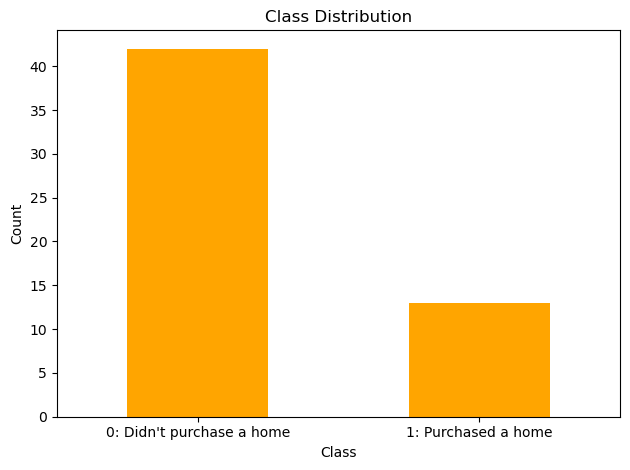

0    42
1    13
Name: home_ownership_class, dtype: int64

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

In [114]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

In [115]:
df_X = df.copy().drop(['userId', 'lastFirstName', 'home_ownership_class'], axis=1)
df_y = df.copy()[['home_ownership_class']]

selector = VarianceThreshold(threshold=0.15)
filtered_data = selector.fit_transform(df_X)

df_mod = pd.DataFrame(filtered_data, columns=df_X.columns[selector.get_support()])

# display(df_mod)
retained_columns_mask = selector.get_support()

filtered_out_columns = df_X.columns[~retained_columns_mask].tolist()

print('Number of columns:', len(filtered_out_columns))
print('Removed columns:', filtered_out_columns)

df_2 = df.copy().drop(columns=filtered_out_columns)

Number of columns: 23
Removed columns: ['loanOthers', 'payInsurance', 'loanGSIS', 'loanPersonal', 'houseHasPensioner', 'houseHasBusiness', 'houseHasFreelancer', 'houseHasGovtEmployee', 'province_CAGAYAN', 'province_CAMARINES SUR', 'province_CEBU', 'province_FOREIGN COUNTRY', 'province_ILOCOS NORTE', 'province_RIZAL', 'province_UNKNOWN', 'job_ASSOCIATE PROFESSIONAL', 'job_CLERICAL SUPPORT', 'job_CRAFT AND TRADE', 'job_ELEMENTARY OCCUPATION', 'job_MACHINE OPERATOR', 'job_NONE', 'job_PROFESIONAL', 'job_UNKNOWN']


In [116]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# calculate VIF for each feature
df = df_mod
vif = pd.DataFrame()
vif["VIF Factor"] = [variance_inflation_factor(df.values, i) for i in range(df.shape[1])]
vif["features"] = df.columns
vif_sorted = vif.sort_values(by="VIF Factor", ascending=False)
# vif_sorted

divide by zero encountered in scalar divide


In [117]:
# Identify columns to be removed
columns_to_remove = vif_sorted[vif_sorted['VIF Factor'] > 10]['features'].to_list()
columns_to_remove

['age',
 'gambling',
 'positiveMonthlySoloNetIncome',
 'monthlySoloNetIncome',
 'monthlyExpenses',
 'monthlyVices',
 'monthlyUtilityBills',
 'daysFromDateEntryStart',
 'houseExtendedFamily',
 'houseOnlyFamily',
 'houseHasOFW',
 'houseHasPrivateEmployee',
 'loanPagIbig',
 'payFamilySupport',
 'loanSSS',
 'savings',
 'otherVices',
 'monthlyFamilyNetIncome',
 'positiveMonthlyFamilyNetIncome',
 'monthlySoloNetIncomeWithSavings',
 'positive monthlyFamilyIncome - monthlyExpenses',
 'province_METRO MANILA',
 'province_CAVITE',
 'gender_MALE',
 'monthlyVices / monthlyFamilyIncome',
 'monthlyExpenses / monthlyFamilyIncome',
 'basicMonthlySalary / monthlyFamilyIncome',
 'monthlyFamilyIncome - monthlyExpenses',
 'positiveMonthlySoloNetIncomeWithSavings',
 'positive basicMonthlySalary - monthlyExpenses',
 'basicMonthlySalary - monthlyExpenses',
 'positive monthlyFamilyIncome - basicMonthlySalary',
 'monthlyFamilyIncome - basicMonthlySalary',
 'positiveMonthlyFamilyNetIncomeWithSavings',
 'monthlyF

In [118]:
t05 = df_2.copy().drop(columns=columns_to_remove)
t05.shape

(55, 3)

## Runs: RobustScaler()

In [119]:
scaler = RobustScaler()

In [120]:
t05_adaboost_gs, t05_adaboost_be, t05_adaboost_model_info, t05_adaboost_metrics_df = adaboost_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


ValueError: 
All the 400 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
400 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 240, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 353, in __call__
    return self.func(*args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\pipeline.py", line 957, in _fit_transform_one
    res = transformer.fit_transform(X, y, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\utils\_set_output.py", line 157, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 919, in fit_transform
    return self.fit(X, y, **fit_params).transform(X)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\preprocessing\_data.py", line 1533, in fit
    X = self._validate_data(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 605, in _validate_data
    out = check_array(X, input_name="X", **check_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\utils\validation.py", line 795, in check_array
    dtype_orig = np.result_type(*dtypes_orig)
  File "<__array_function__ internals>", line 200, in result_type
ValueError: at least one array or dtype is required


In [111]:
t05_dt_gs, t05_dt_be, t05_dt_model_info, t05_dt_metrics_df = dt_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


ValueError: 
All the 17280 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
17280 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 240, in _fit
    X, fitted_transformer = fit_transform_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 353, in __call__
    return self.func(*args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\pipeline.py", line 957, in _fit_transform_one
    res = transformer.fit_transform(X, y, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\utils\_set_output.py", line 157, in wrapped
    data_to_wrap = f(self, X, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 919, in fit_transform
    return self.fit(X, y, **fit_params).transform(X)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\preprocessing\_data.py", line 1533, in fit
    X = self._validate_data(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 605, in _validate_data
    out = check_array(X, input_name="X", **check_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\utils\validation.py", line 795, in check_array
    dtype_orig = np.result_type(*dtypes_orig)
  File "<__array_function__ internals>", line 200, in result_type
ValueError: at least one array or dtype is required


In [ ]:
t05_logreg_gs, t05_logreg_be, t05_logreg_model_info, t05_logreg_metrics_df = logreg_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits
Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.35
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 5.146286487579346 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.21212121212121213
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.24242424242424243
Stdev Test Precision: 0.2505732637657762
Ave Test Accuracy: 0.7156862745


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [ ]:
t05_knn_gs, t05_knn_be, t05_knn_model_info, t05_knn_metrics_df = knn_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 12, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=12))])
Mean Train Score (Precision) 0.4582738067587989
Std Train Score (Precision) 0.029926953044298515
GridSearchCV Runtime: 12.310841083526611 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.5
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.1
Stdev Test Precision: 0.22360679774997902
Ave Test Accuracy: 0.7254901960784315
Stdev Test Accuracy: 0.02079725827019258
Ave Test Specificity: 0.9584

In [ ]:
t05_svm_gs, t05_svm_be, t05_svm_model_info, t05_svm_metrics_df = svm_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits
[LibSVM]Best Hyperparameters: {'classifier__C': 100.0, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3051297313797313
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=100.0, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.3777041322314542
Std Train Score (Precision) 0.02777276041329116
GridSearchCV Runtime: 13.257577419281006 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2558139534883721
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.2909090909090909
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.2727272727272727
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.23404255319148937
[LibSVM

Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [ ]:
t05_catboost_gs, t05_catboost_be, t05_catboost_model_info, t05_catboost_metrics_df = catboost_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.004557
0:	learn: 0.6920157	total: 1.82ms	remaining: 1.81s
1:	learn: 0.6910198	total: 3.24ms	remaining: 1.62s
2:	learn: 0.6899190	total: 4.6ms	remaining: 1.53s
3:	learn: 0.6892047	total: 6.01ms	remaining: 1.5s
4:	learn: 0.6878651	total: 7.68ms	remaining: 1.53s
5:	learn: 0.6866550	total: 9.38ms	remaining: 1.55s
6:	learn: 0.6860221	total: 11.3ms	remaining: 1.6s
7:	learn: 0.6848440	total: 13.1ms	remaining: 1.62s
8:	learn: 0.6838636	total: 14.7ms	remaining: 1.61s
9:	learn: 0.6829792	total: 16ms	remaining: 1.58s
10:	learn: 0.6823502	total: 18ms	remaining: 1.62s
11:	learn: 0.6813358	total: 19.8ms	remaining: 1.63s
12:	learn: 0.6799026	total: 21.6ms	remaining: 1.64s
13:	learn: 0.6789055	total: 23.5ms	remaining: 1.66s
14:	learn: 0.6783781	total: 25.4ms	remaining: 1.67s
15:	learn: 0.6768247	total: 27ms	remaining: 1.66s
16:	learn: 0.6757207	total: 28.6ms	remaining: 1.66s
17:	learn: 0.6748685	total: 30.6ms	remaining

In [ ]:
t05_lgbm_gs, t05_lgbm_be, t05_lgbm_model_info, t05_lgbm_metrics_df = lgbm_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 240, number of negative: 229
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 343
[LightGBM] [Info] Number of data points in the train set: 469, number of used features: 14
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.511727 -> initscore=0.046917
[LightGBM] [Info] Start training from score 0.046917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -in

In [ ]:
t05_gbm_gs, t05_gbm_be, t05_gbm_model_info, t05_gbm_metrics_df = gbm_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3797619047619048
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.7357038410873921
Std Train Score (Precision) 0.018913287305357664
GridSearchCV Runtime: 18.82102084159851 secs
Run 1 - Random State: 0
Test Precision: 0.1111111111111111
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.15789473684210525
Run 4 - Random State: 3
Test Precision: 0.1875
Run 5 - Random Stat

In [ ]:
t05_rf_gs, t05_rf_be, t05_rf_model_info, t05_rf_metrics_df = rf_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3288931330107801
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.42597897657287115
Std Train Score (Precision) 0.025518831614032105
GridSearchCV Runtime: 183.7988998889923 secs
Run 1 - Random State: 0
Test Precision: 0.12121212121212122
Run 2 - Random State: 1
Test Precision: 0.2857

In [ ]:
t05_xgb_gs, t05_xgb_be, t05_xgb_model_info, t05_xgb_metrics_df = xgb_class2(t05, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.3661904761904762
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
            

## Results

In [ ]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't05_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t05_model_summ)
t05_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t05_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
1,SVM Classifier,0.261546,0.021389,0.305130,0.377704,0.027773,0.513725,0.029083,0.503896,0.544,0.774271,0.352246,0.519433
2,Logistic Regression,0.242424,0.250573,0.350000,NaN,NaN,0.715686,0.082318,0.924675,0.072,0.753302,0.077905,0.165608
4,Random Forest,0.217238,0.064702,0.328893,0.425979,0.025519,0.543137,0.037716,0.607792,0.344,0.742067,0.264970,0.447645
9,CatBoost,0.206501,0.056636,0.264789,0.761476,0.019162,0.458824,0.048725,0.464935,0.440,0.721204,0.279823,0.440641
3,Decision Tree,0.204390,0.046301,0.375298,NaN,NaN,0.539216,0.018341,0.612987,0.312,0.733811,0.246628,0.432623
6,LightGBM,0.184750,0.085002,0.396984,0.518974,0.027960,0.609804,0.046710,0.748052,0.184,0.739234,0.179519,0.348879
8,AdaBoost,0.171349,0.090909,0.299167,0.798574,0.009155,0.680392,0.037074,0.877922,0.072,0.744203,0.100449,0.246288
5,Gradient Boosting Machine (GBM),0.162354,0.059622,0.379762,0.735704,0.018913,0.650980,0.032956,0.828571,0.104,0.739953,0.125512,0.286131
7,Extreme Gradient Boosting (XGBoost),0.137329,0.066410,0.366190,0.686135,0.019333,0.649020,0.030534,0.833766,0.080,0.736076,0.100719,0.251646
0,k-Nearest Neighbors,0.100000,0.223607,0.333333,0.458274,0.029927,0.725490,0.020797,0.958442,0.008,0.748402,0.014815,0.039739


In [ ]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t05_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.725490,k-Nearest Neighbors
Highest Test G-mean,0.519433,SVM Classifier
Highest Test Recall,0.544000,SVM Classifier
Highest Test Precision,0.261546,SVM Classifier
Highest Test Specificity,0.958442,k-Nearest Neighbors
Highest Test F1-score,0.352246,SVM Classifier


# HO_T06: Yes - 1, 3, 30

In [121]:
t06 = dataset.copy().drop(columns=cols_with_nulls)
t06 = t06[t06['positiveMonthlySoloNetIncome'] != 0]
# t06_num = t06.drop(columns=['gender', 'province', 'job'])
t06 = pd.get_dummies(t06, columns=['gender'], prefix='gender', drop_first='True')
t06 = pd.get_dummies(t06, columns=['province'], prefix='province', drop_first='True')
t06 = pd.get_dummies(t06, columns=['job'], prefix='job', drop_first='True')

t06.loc[t06['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t06.isna().sum()[t06.isna().sum() > 0]
df = t06

## EDA on Dataset

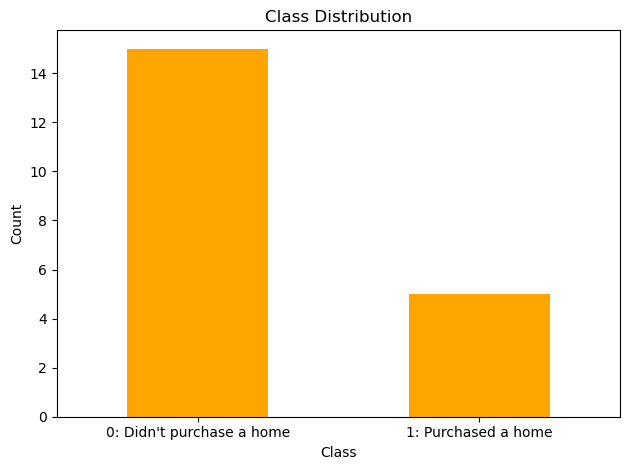

0    15
1     5
Name: home_ownership_class, dtype: int64

0    0.75
1    0.25
Name: home_ownership_class, dtype: float64

In [122]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [123]:
scaler = RobustScaler()

In [124]:
t06_adaboost_gs, t06_adaboost_be, t06_adaboost_model_info, t06_adaboost_metrics_df = adaboost_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


The least populated class in y has only 4 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__algorithm': 'SAMME.R', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.1
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 AdaBoostClassifier(estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 4.17615008354187 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.13
Stdev Test Precision: 0.12041594578792296
Ave Test Accuracy: 0.2
Stdev Test Accuracy: 0.14142135623


160 fits failed out of a total of 400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
48 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 35

In [125]:
t06_dt_gs, t06_dt_be, t06_dt_model_info, t06_dt_metrics_df = dt_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


The least populated class in y has only 4 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__max_features': 'sqrt', 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=2, max_features='sqrt',
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 62.00826597213745 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.5
Ave Test Precision: 0.2
Stdev Test Precision: 0.2738612787525831
Ave Test Accuracy: 0.55999999999999


10800 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1296 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", l

In [126]:
t06_logreg_gs, t06_logreg_be, t06_logreg_model_info, t06_logreg_metrics_df = logreg_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


The least populated class in y has only 4 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': 'l2', 'classifier__solver': 'newton-cholesky', 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, random_state=0,
                                    solver='newton-cholesky'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 15.49973177909851 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.12000000000000002
Stdev Test Precision: 0.10954451150103323
Ave Test Accuracy: 0.2
Stdev Test Accuracy: 0.14142135623730953
Ave Test Specificit


2145 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
468 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [127]:
t06_knn_gs, t06_knn_be, t06_knn_model_info, t06_knn_metrics_df = knn_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


The least populated class in y has only 4 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__metric': 'euclidean', 'classifier__n_neighbors': 11, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='euclidean', n_neighbors=11))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 24.03193163871765 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.16
Stdev Test Precision: 0.08944271909999159
Ave Test Accuracy: 0.27999999999999997
Stdev Test Accuracy: 0.17888543819998315
Ave Test Specificity: 0.15
Ave Test Recall: 0.8
Ave Test NPV: 0.75
Ave Test F1-Score: 0.2666666666666667
Ave T


2400 fits failed out of a total of 6000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
720 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [128]:
t06_svm_gs, t06_svm_be, t06_svm_model_info, t06_svm_metrics_df = svm_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


The least populated class in y has only 4 members, which is less than n_splits=10.


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 20.07661461830139 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.2
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.2
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.16
Stdev Test Precision: 0.08944271909999159
Ave Test Accuracy: 0.27999999999999997
Stdev Test Accuracy: 0.1


2392 fits failed out of a total of 5200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
624 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [129]:
t06_catboost_gs, t06_catboost_be, t06_catboost_model_info, t06_catboost_metrics_df = catboost_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


The least populated class in y has only 4 members, which is less than n_splits=10.

23 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
6 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c

Learning rate set to 0.001311
0:	learn: 0.6926326	total: 1.36ms	remaining: 1.35s
1:	learn: 0.6915653	total: 2.63ms	remaining: 1.31s
2:	learn: 0.6907314	total: 4.39ms	remaining: 1.46s
3:	learn: 0.6896654	total: 5.63ms	remaining: 1.4s
4:	learn: 0.6890399	total: 6.65ms	remaining: 1.32s
5:	learn: 0.6880214	total: 7.88ms	remaining: 1.31s
6:	learn: 0.6870054	total: 9.06ms	remaining: 1.28s
7:	learn: 0.6860828	total: 10.3ms	remaining: 1.27s
8:	learn: 0.6850272	total: 11.5ms	remaining: 1.26s
9:	learn: 0.6842895	total: 12.7ms	remaining: 1.26s
10:	learn: 0.6835566	total: 14ms	remaining: 1.25s
11:	learn: 0.6828324	total: 15.9ms	remaining: 1.3s
12:	learn: 0.6821083	total: 17.8ms	remaining: 1.35s
13:	learn: 0.6812901	total: 19.4ms	remaining: 1.36s
14:	learn: 0.6804750	total: 20.7ms	remaining: 1.36s
15:	learn: 0.6796609	total: 22.2ms	remaining: 1.36s
16:	learn: 0.6787941	total: 23.3ms	remaining: 1.35s
17:	learn: 0.6778890	total: 25.1ms	remaining: 1.37s
18:	learn: 0.6768461	total: 26.5ms	remaining: 1.

In [130]:
t06_lgbm_gs, t06_lgbm_be, t06_lgbm_model_info, t06_lgbm_metrics_df = lgbm_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


The least populated class in y has only 4 members, which is less than n_splits=10.

720 fits failed out of a total of 1800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
216 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  Fi

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 4, number of negative: 1
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 5, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.800000 -> initscore=1.386294
[LightGBM] [Info] Start training from score 1.386294
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there 

invalid value encountered in scalar divide
invalid value encountered in scalar divide


In [131]:
t06_gbm_gs, t06_gbm_be, t06_gbm_model_info, t06_gbm_metrics_df = gbm_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


The least populated class in y has only 4 members, which is less than n_splits=10.



368 fits failed out of a total of 800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
96 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 35

Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.05
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 10.277265071868896 secs
Run 1 - Random State: 0
Test Precision: 0.0


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


Run 2 - Random State: 1
Test Precision: 1.0
Run 3 - Random State: 2
Test Precision: 0.0


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.2
Stdev Test Precision: 0.44721359549995804
Ave Test Accuracy: 0.6799999999999999
Stdev Test Accuracy: 0.2683281572999748
Ave Test Specificity: 0.8
Ave Test Recall: 0.2
Ave Test NPV: 0.7866666666666666
Ave Test F1-Score: 0.2
Ave Test G-mean: 0.2
Ave Runtime: 0.13415465354919434


In [132]:
t06_rf_gs, t06_rf_be, t06_rf_model_info, t06_rf_metrics_df = rf_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


The least populated class in y has only 4 members, which is less than n_splits=10.

1920 fits failed out of a total of 4800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
576 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  F

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.15
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 85.09043431282043 secs
Run 1 - Random State: 0
Test Precision: 0.2


invalid value encountered in scalar divide
invalid value encountered in scalar divide


Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.2


invalid value encountered in scalar divide


Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.2
Ave Test Precision: 0.16
Stdev Test Precision: 0.08944271909999159
Ave Test Accuracy: 0.16
Stdev Test Accuracy: 0.08944271909999159
Ave Test Specificity: 0.0
Ave Test Recall: 0.8
Ave Test NPV: 0.0
Ave Test F1-Score: 0.2666666666666667
Ave Test G-mean: 0.0
Ave Runtime: 0.19467101097106934


invalid value encountered in scalar divide


In [133]:
t06_xgb_gs, t06_xgb_be, t06_xgb_model_info, t06_xgb_metrics_df = xgb_class2(t06, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 4 members, which is less than n_splits=10.


Fitting 10 folds for each of 540 candidates, totalling 5400 fits



2484 fits failed out of a total of 5400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
648 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.1
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, learni

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.0


Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.0
Stdev Test Precision: 0.0
Ave Test Accuracy: 0.52
Stdev Test Accuracy: 0.33466401061363027
Ave Test Specificity: 0.65
Ave Test Recall: 0.0
Ave Test NPV: 0.6033333333333333
Ave Test F1-Score: 0.0
Ave Test G-mean: 0.0
Ave Runtime: 0.1372657299041748


## Results

In [134]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't06_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t06_model_summ)
t06_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t06_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
3,Decision Tree,0.20,0.273861,0.20,NaN,NaN,0.56,0.260768,0.60,0.4,0.783333,0.266667,0.34641
5,Gradient Boosting Machine (GBM),0.20,0.447214,0.05,NaN,NaN,0.68,0.268328,0.80,0.2,0.786667,0.200000,0.20000
6,LightGBM,0.20,0.000000,0.15,NaN,NaN,0.20,0.000000,0.00,1.0,NaN,0.333333,0.00000
0,k-Nearest Neighbors,0.16,0.089443,0.25,NaN,NaN,0.28,0.178885,0.15,0.8,0.750000,0.266667,0.00000
1,SVM Classifier,0.16,0.089443,0.20,NaN,NaN,0.28,0.178885,0.15,0.8,0.750000,0.266667,0.00000
4,Random Forest,0.16,0.089443,0.15,NaN,NaN,0.16,0.089443,0.00,0.8,0.000000,0.266667,0.00000
8,AdaBoost,0.13,0.120416,0.10,NaN,NaN,0.20,0.141421,0.10,0.6,0.500000,0.213333,0.10000
2,Logistic Regression,0.12,0.109545,0.25,NaN,NaN,0.20,0.141421,0.10,0.6,0.333333,0.200000,0.00000
7,Extreme Gradient Boosting (XGBoost),0.00,0.000000,0.10,NaN,NaN,0.52,0.334664,0.65,0.0,0.603333,0.000000,0.00000
9,CatBoost,0.00,0.000000,0.05,NaN,NaN,0.28,0.178885,0.35,0.0,0.500000,0.000000,0.00000


In [135]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t06_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.680000,Gradient Boosting Machine (GBM)
Highest Test G-mean,0.346410,Decision Tree
Highest Test Recall,1.000000,LightGBM
Highest Test Precision,0.200000,Decision Tree
Highest Test Specificity,0.800000,Gradient Boosting Machine (GBM)
Highest Test F1-score,0.333333,LightGBM


# HO_T07: Yes - 1, 4, 30

In [136]:
t07 = dataset.copy().drop(columns=cols_with_nulls)
t07 = t07[t07['positiveMonthlyFamilyNetIncome'] != 0]
# t07_num = t07.drop(columns=['gender', 'province', 'job'])
t07 = pd.get_dummies(t07, columns=['gender'], prefix='gender', drop_first='True')
t07 = pd.get_dummies(t07, columns=['province'], prefix='province', drop_first='True')
t07 = pd.get_dummies(t07, columns=['job'], prefix='job', drop_first='True')

t07.loc[t07['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t07.isna().sum()[t07.isna().sum() > 0]
df = t07

## EDA on Dataset

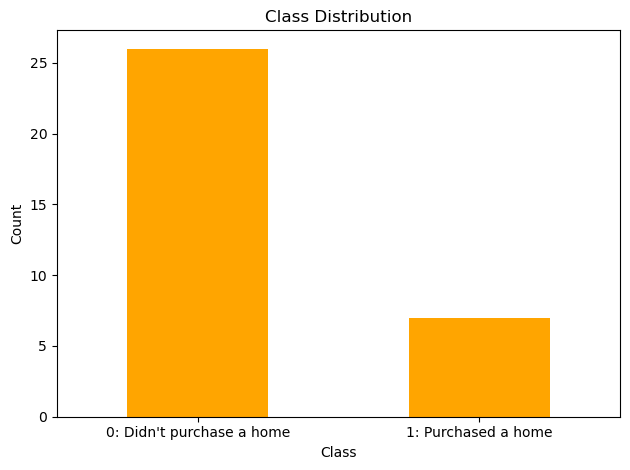

0    26
1     7
Name: home_ownership_class, dtype: int64

0    0.787879
1    0.212121
Name: home_ownership_class, dtype: float64

In [137]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [138]:
scaler = RobustScaler()

In [139]:
t07_adaboost_gs, t07_adaboost_be, t07_adaboost_model_info, t07_adaboost_metrics_df = adaboost_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


The least populated class in y has only 5 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 6.323152542114258 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.13
Stdev Test P


160 fits failed out of a total of 400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 35

In [140]:
t07_dt_gs, t07_dt_be, t07_dt_model_info, t07_dt_metrics_df = dt_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

10800 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1080 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=2, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 121.92637705802917 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.09047619047619046
Stdev Test Precision: 0.1308441110860389
Ave Test Accuracy: 0.4666666666666667
Stdev Test

In [141]:
t07_logreg_gs, t07_logreg_be, t07_logreg_model_info, t07_logreg_metrics_df = logreg_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

1950 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
390 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  F

Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': None, 'classifier__solver': 'lbfgs', 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, penalty=None,
                                    random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 30.765156507492065 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.07333333333333333
Stdev Test Precision: 0.10110500592068734
Ave Test Accuracy: 0.42222222222222217
Stdev Test Accuracy: 0.049690399499995326
Ave Te

Setting penalty=None will ignore the C and l1_ratio parameters


In [142]:
t07_knn_gs, t07_knn_be, t07_knn_model_info, t07_knn_metrics_df = knn_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 5 members, which is less than n_splits=10.


Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'cityblock', 'classifier__n_neighbors': 5, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='cityblock'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 50.14860415458679 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2222222222222222
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Precision: 0.2682539682539683
Stdev Test Precision: 0.042794634014421934
Ave Test Accuracy: 0.39999999999999997
Stdev Test Accuracy: 0.16850834320114558
A


2400 fits failed out of a total of 6000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
600 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [143]:
t07_svm_gs, t07_svm_be, t07_svm_model_info, t07_svm_metrics_df = svm_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


The least populated class in y has only 5 members, which is less than n_splits=10.


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.21666666666666665
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 39.143367767333984 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.0
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.25
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.09
Stdev Test Precision: 0.12449899597988733
Ave Test Accuracy: 0.4222222222222222
Stdev Test Accuracy: 0.26


2080 fits failed out of a total of 5200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
520 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [144]:
t07_catboost_gs, t07_catboost_be, t07_catboost_model_info, t07_catboost_metrics_df = catboost_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

20 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c

Learning rate set to 0.001442
0:	learn: 0.6921648	total: 2.8ms	remaining: 2.8s
1:	learn: 0.6911845	total: 4.89ms	remaining: 2.44s
2:	learn: 0.6904728	total: 7ms	remaining: 2.33s
3:	learn: 0.6895798	total: 9.23ms	remaining: 2.3s
4:	learn: 0.6888525	total: 11.8ms	remaining: 2.35s
5:	learn: 0.6878280	total: 13.6ms	remaining: 2.26s
6:	learn: 0.6865873	total: 15.6ms	remaining: 2.21s
7:	learn: 0.6860727	total: 17.3ms	remaining: 2.14s
8:	learn: 0.6853870	total: 19.5ms	remaining: 2.15s
9:	learn: 0.6847847	total: 21.5ms	remaining: 2.13s
10:	learn: 0.6839023	total: 24.4ms	remaining: 2.19s
11:	learn: 0.6831781	total: 26.9ms	remaining: 2.22s
12:	learn: 0.6824581	total: 29.9ms	remaining: 2.27s
13:	learn: 0.6815329	total: 32.4ms	remaining: 2.28s
14:	learn: 0.6807371	total: 35.2ms	remaining: 2.31s
15:	learn: 0.6798634	total: 37.7ms	remaining: 2.32s
16:	learn: 0.6788220	total: 40.1ms	remaining: 2.32s
17:	learn: 0.6777858	total: 42.4ms	remaining: 2.31s
18:	learn: 0.6769148	total: 45.1ms	remaining: 2.33

In [145]:
t07_lgbm_gs, t07_lgbm_be, t07_lgbm_model_info, t07_lgbm_metrics_df = lgbm_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

720 fits failed out of a total of 1800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
180 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  Fi

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 5, number of negative: 7
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 12, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.416667 -> initscore=-0.336472
[LightGBM] [Info] Start training from score -0.336472
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because the

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
invalid value encountered in scalar divide
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


Run 2 - Random State: 1
Test Precision: 0.0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 5, number of negative: 4
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 9, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.555556 -> initscore=0.223144
[LightGBM] [Info] Start training from score 0.223144
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGB

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [146]:
t07_gbm_gs, t07_gbm_be, t07_gbm_model_info, t07_gbm_metrics_df = gbm_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

320 fits failed out of a total of 800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
80 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File

Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 18.043535470962524 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.0


In [147]:
t07_rf_gs, t07_rf_be, t07_rf_model_info, t07_rf_metrics_df = rf_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

1920 fits failed out of a total of 4800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
480 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  F

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 165.4815571308136 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.16666666666666666
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4

In [148]:
t07_xgb_gs, t07_xgb_be, t07_xgb_model_info, t07_xgb_metrics_df = xgb_class2(t07, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

2160 fits failed out of a total of 5400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
540 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  F

Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, 

## Results

In [149]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't07_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t07_model_summ)
t07_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t07_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
0,k-Nearest Neighbors,0.268254,0.042795,0.283333,NaN,NaN,0.400000,0.168508,0.257143,0.9,0.958333,0.401616,0.377613
8,AdaBoost,0.130000,0.120416,0.283333,NaN,NaN,0.511111,0.099381,0.571429,0.3,0.743333,0.180952,0.292069
5,Gradient Boosting Machine (GBM),0.106667,0.153478,0.283333,NaN,NaN,0.511111,0.185924,0.571429,0.3,0.750000,0.157143,0.223513
3,Decision Tree,0.090476,0.130844,0.300000,NaN,NaN,0.466667,0.198762,0.514286,0.3,0.733333,0.138889,0.182497
1,SVM Classifier,0.090000,0.124499,0.216667,NaN,NaN,0.422222,0.265274,0.485714,0.2,0.632222,0.123810,0.199487
4,Random Forest,0.083333,0.117851,0.250000,NaN,NaN,0.444444,0.157135,0.514286,0.2,0.683333,0.116667,0.182497
2,Logistic Regression,0.073333,0.101105,0.200000,NaN,NaN,0.422222,0.049690,0.485714,0.2,0.683333,0.107143,0.168175
7,Extreme Gradient Boosting (XGBoost),0.073333,0.101105,0.250000,NaN,NaN,0.422222,0.213726,0.485714,0.2,0.642857,0.107143,0.168175
6,LightGBM,0.044444,0.099381,0.000000,NaN,NaN,0.666667,0.248452,0.800000,0.2,0.777778,0.072727,0.000000
9,CatBoost,0.040000,0.089443,0.150000,NaN,NaN,0.444444,0.111111,0.542857,0.1,0.675714,0.057143,0.092582


In [150]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t07_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.666667,LightGBM
Highest Test G-mean,0.377613,k-Nearest Neighbors
Highest Test Recall,0.900000,k-Nearest Neighbors
Highest Test Precision,0.268254,k-Nearest Neighbors
Highest Test Specificity,0.800000,LightGBM
Highest Test F1-score,0.401616,k-Nearest Neighbors


# HO_T08: Yes - 1, 7, 30

In [151]:
t08 = dataset.copy().drop(columns=cols_with_nulls)
t08 = t08[t08['positive monthlyFamilyIncome - basicMonthlySalary'] != 0]
# t08_num = t08.drop(columns=['gender', 'province', 'job'])
t08 = pd.get_dummies(t08, columns=['gender'], prefix='gender', drop_first='True')
t08 = pd.get_dummies(t08, columns=['province'], prefix='province', drop_first='True')
t08 = pd.get_dummies(t08, columns=['job'], prefix='job', drop_first='True')

t08.loc[t08['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t08.isna().sum()[t08.isna().sum() > 0]
df = t08

## EDA on Dataset

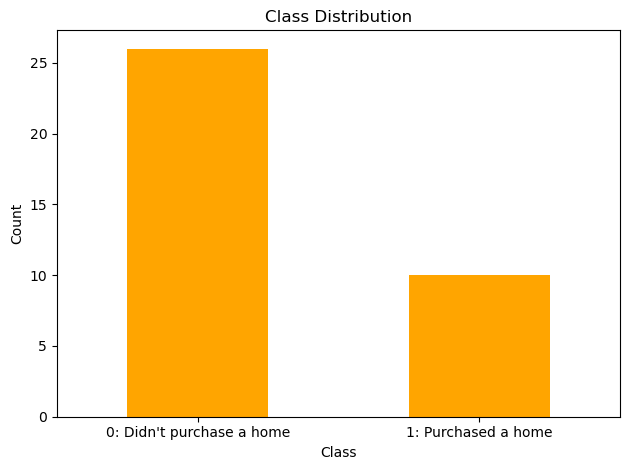

0    26
1    10
Name: home_ownership_class, dtype: int64

0    0.722222
1    0.277778
Name: home_ownership_class, dtype: float64

In [152]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [153]:
scaler = RobustScaler()

In [154]:
t08_adaboost_gs, t08_adaboost_be, t08_adaboost_model_info, t08_adaboost_metrics_df = adaboost_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


The least populated class in y has only 8 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8659184426684426
Std Train Score (Precision) 0.031082508168471405
GridSearchCV Runtime: 9.255211114883423 secs
Run 1 - Random State: 0
Test Precision: 0.4
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Preci

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [155]:
t08_dt_gs, t08_dt_be, t08_dt_model_info, t08_dt_metrics_df = dt_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 8 members, which is less than n_splits=10.


Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1961 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 3, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': TomekLinks()}
Best Validation Score (Precision): 0.55
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()), ('resampling', TomekLinks()),
                ('classifier',
                 DecisionTreeClassifier(max_depth=3, max_features='log2',
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 184.12198042869568 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.5
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.4
Run 5 - Random State: 4
Test Precision: 0.5
Ave Test Precision: 0.3466666666666667
Stdev Test Precision: 0.2062899792902107
Ave Test Accuracy: 0.711111111111111
Stde

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [156]:
t08_logreg_gs, t08_logreg_be, t08_logreg_model_info, t08_logreg_metrics_df = logreg_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 8 members, which is less than n_splits=10.


Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.55
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 36.630313873291016 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test Precision: 0.30333333333333334
Stdev Test Precision: 0.07852812659593164
Ave Test Accuracy: 0.5777777777777777
Stdev Test Accuracy: 0.09296222517045283
Av

In [157]:
t08_knn_gs, t08_knn_be, t08_knn_model_info, t08_knn_metrics_df = knn_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


The least populated class in y has only 8 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__metric': 'chebyshev', 'classifier__n_neighbors': 3, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.55
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='chebyshev', n_neighbors=3))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 54.81571364402771 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.6666666666666666
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.13333333333333333
Stdev Test Precision: 0.29814239699997197
Ave Test Accuracy: 0.6444444444444445
Stdev Test Accuracy: 0.09296222517045283
Ave Test Specificity: 0.7952380952380953
Ave Test Recall: 0.13333333333333333
Ave T

One or more of the test scores are non-finite: [0.35       0.25       0.45       0.25       0.45       0.25
 0.25       0.3        0.25       0.25       0.45       0.45
 0.4        0.35       0.35       0.25       0.3        0.2
 0.3        0.         0.35       0.35       0.25       0.35
 0.05       0.25       0.35       0.         0.35       0.
 0.25       0.4        0.         0.45       0.         0.25
 0.35       0.         0.3        0.         0.25       0.3
 0.         0.3        0.         0.25       0.2        0.
 0.3        0.         0.25       0.25       0.         0.4
 0.         0.25       0.2        0.         0.2        0.
 0.25       0.25       0.         0.2        0.         0.2
 0.2        0.         0.2        0.         0.25       0.25
 0.         0.2               nan 0.18333333 0.2        0.45
 0.2        0.33333333 0.2        0.2        0.25       0.2
 0.1        0.35       0.45       0.48333333 0.35       0.25
 0.3        0.25       0.35       0.05       0.25

In [158]:
t08_svm_gs, t08_svm_be, t08_svm_model_info, t08_svm_metrics_df = svm_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 8 members, which is less than n_splits=10.


Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 0.1, 'classifier__kernel': 'linear', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=0.1, kernel='linear', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.8297618405377603
Std Train Score (Precision) 0.09630847516234892
GridSearchCV Runtime: 42.281245946884155 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.0
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.3333333333333333
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.2
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.25
[LibSVM]Run 5 - Random State: 4
Test Precision: 1.0
Ave Test Precision: 0.35666666666666663
Stdev Test Precision: 0.37998537983571007
Ave Test Accuracy: 0

In [159]:
t08_catboost_gs, t08_catboost_be, t08_catboost_model_info, t08_catboost_metrics_df = catboost_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


The least populated class in y has only 8 members, which is less than n_splits=10.


Learning rate set to 0.00255
0:	learn: 0.6914602	total: 3.4ms	remaining: 3.4s
1:	learn: 0.6895362	total: 5.52ms	remaining: 2.75s
2:	learn: 0.6879698	total: 7.78ms	remaining: 2.58s
3:	learn: 0.6857582	total: 10ms	remaining: 2.49s
4:	learn: 0.6836318	total: 12.3ms	remaining: 2.46s
5:	learn: 0.6813520	total: 14.2ms	remaining: 2.36s
6:	learn: 0.6794990	total: 16.2ms	remaining: 2.3s
7:	learn: 0.6777650	total: 18.3ms	remaining: 2.27s
8:	learn: 0.6751793	total: 20.2ms	remaining: 2.23s
9:	learn: 0.6734634	total: 21.9ms	remaining: 2.16s
10:	learn: 0.6716680	total: 23.4ms	remaining: 2.11s
11:	learn: 0.6694976	total: 24.9ms	remaining: 2.05s
12:	learn: 0.6678129	total: 26.7ms	remaining: 2.03s
13:	learn: 0.6657815	total: 28.2ms	remaining: 1.98s
14:	learn: 0.6637750	total: 29.6ms	remaining: 1.94s
15:	learn: 0.6618269	total: 31.8ms	remaining: 1.96s
16:	learn: 0.6603660	total: 33.4ms	remaining: 1.93s
17:	learn: 0.6585566	total: 35.2ms	remaining: 1.92s
18:	learn: 0.6570108	total: 36.8ms	remaining: 1.9s

In [160]:
t08_lgbm_gs, t08_lgbm_be, t08_lgbm_model_info, t08_lgbm_metrics_df = lgbm_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


The least populated class in y has only 8 members, which is less than n_splits=10.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 19, number of negative: 19
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 38, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirement

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


Run 2 - Random State: 1
Test Precision: 0.0
[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 18, number of negative: 19
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 37, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.486486 -> initscore=-0.054067
[LightGBM] [Info] Start training from score -0.054067
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[Li

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [161]:
t08_gbm_gs, t08_gbm_be, t08_gbm_model_info, t08_gbm_metrics_df = gbm_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 8 members, which is less than n_splits=10.


Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 3, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(min_samples_leaf=3,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8628367604617605
Std Train Score (Precision) 0.03899400911575416
GridSearchCV Runtime: 35.16961097717285 secs
Run 1 - Random State: 0
Test Precision: 0.3333333333333333
Run 2 - Random State: 1
Test Precision: 0.4
Run 3 - Random State: 2
Test Precision: 0.4
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0

In [162]:
t08_rf_gs, t08_rf_be, t08_rf_model_info, t08_rf_metrics_df = rf_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


The least populated class in y has only 8 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=2,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.8758195461945462
Std Train Score (Precision) 0.04245542413198376
GridSearchCV Runtime: 431.16193532943726 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.6666666666666666
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 -

In [163]:
t08_xgb_gs, t08_xgb_be, t08_xgb_model_info, t08_xgb_metrics_df = xgb_class2(t08, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


The least populated class in y has only 8 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.41666666666666663
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constr

## Results

In [164]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't08_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t08_model_summ)
t08_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t08_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
9,CatBoost,0.466667,0.315128,0.233333,0.874439,0.038886,0.666667,0.111111,0.742857,0.466667,0.808095,0.413333,0.579733
1,SVM Classifier,0.356667,0.379985,0.500000,0.829762,0.096308,0.622222,0.168508,0.704762,0.366667,0.768333,0.323810,0.435189
4,Random Forest,0.350000,0.180662,0.283333,0.875820,0.042455,0.600000,0.099381,0.595238,0.633333,0.846667,0.433333,0.600715
3,Decision Tree,0.346667,0.206290,0.550000,NaN,NaN,0.711111,0.060858,0.795238,0.466667,0.836508,0.374286,0.507049
7,Extreme Gradient Boosting (XGBoost),0.340000,0.106458,0.416667,0.853583,0.038275,0.555556,0.078567,0.476190,0.833333,0.910000,0.471429,0.618708
5,Gradient Boosting Machine (GBM),0.326667,0.075093,0.400000,0.862837,0.038994,0.533333,0.121716,0.442857,0.833333,0.910000,0.460952,0.580084
2,Logistic Regression,0.303333,0.078528,0.550000,NaN,NaN,0.577778,0.092962,0.585714,0.533333,0.793333,0.383810,0.554002
8,AdaBoost,0.244286,0.147807,0.300000,0.865918,0.031083,0.555556,0.111111,0.542857,0.700000,0.893333,0.358730,0.471899
0,k-Nearest Neighbors,0.133333,0.298142,0.550000,NaN,NaN,0.644444,0.092962,0.795238,0.133333,0.752381,0.133333,0.149071
6,LightGBM,0.050000,0.111803,0.033333,0.005833,0.017500,0.666667,0.192450,0.828571,0.200000,0.800000,0.080000,0.075593


In [165]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t08_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.711111,Decision Tree
Highest Test G-mean,0.618708,Extreme Gradient Boosting (XGBoost)
Highest Test Recall,0.833333,Gradient Boosting Machine (GBM)
Highest Test Precision,0.466667,CatBoost
Highest Test Specificity,0.828571,LightGBM
Highest Test F1-score,0.471429,Extreme Gradient Boosting (XGBoost)


# HO_T09: Yes - 20 (20k, 50k, 100k), 30

In [260]:
t09 = dataset.copy().drop(columns=cols_with_nulls)
# t09 = t09[t09['positiveMonthlyFamilyNetIncomeWithSavings'] != 0]
# t09_num = t09.drop(columns=['gender', 'province', 'job'])
t09 = pd.get_dummies(t09, columns=['gender'], prefix='gender', drop_first='True')
t09 = pd.get_dummies(t09, columns=['province'], prefix='province', drop_first='True')
t09 = pd.get_dummies(t09, columns=['job'], prefix='job', drop_first='True')

bins = [0, 20000, 50000, 100000, float('inf')]  # float('inf') represents infinity
labels = ['0-20k', '20k-50k', '50k-100k', '100k+']
t09['salary_bin'] = pd.cut(t09['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
t09['salary_bin_encoded'] = t09['salary_bin'].cat.codes
t09 = t09.drop(columns=['salary_bin'])

# t09.isna().sum()[t09.isna().sum() > 0]
df = t09

## EDA on Dataset

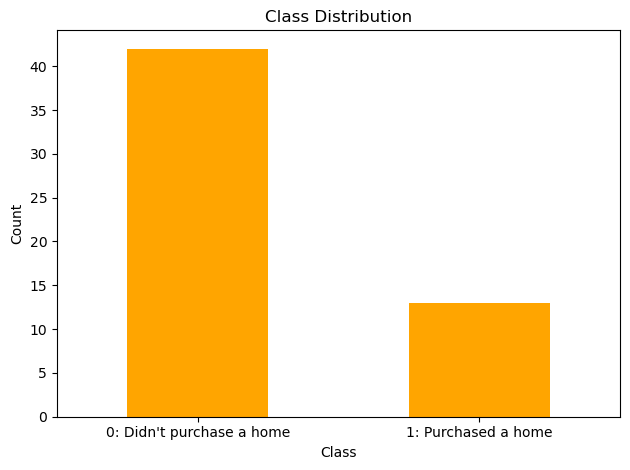

0    42
1    13
Name: home_ownership_class, dtype: int64

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

In [167]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [168]:
scaler = RobustScaler()

In [169]:
t09_adaboost_gs, t09_adaboost_be, t09_adaboost_model_info, t09_adaboost_metrics_df = adaboost_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.26666666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8138963548061845
Std Train Score (Precision) 0.034783577484896515
GridSearchCV Runtime: 9.747325420379639 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.375
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.2
A

In [170]:
t09_dt_gs, t09_dt_be, t09_dt_model_info, t09_dt_metrics_df = dt_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1944 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.36666666666666664
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        min_samples_leaf=3, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 163.404541015625 secs
Run 1 - Random State: 0
Test Precision: 0.18181818181818182
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Precisi

In [171]:
t09_logreg_gs, t09_logreg_be, t09_logreg_model_info, t09_logreg_metrics_df = logreg_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.01, 'classifier__penalty': 'l2', 'classifier__solver': 'liblinear', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.01, max_iter=1000, random_state=0,
                                    solver='liblinear'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 39.83625030517578 secs
Run 1 - Random State: 0
Test Precision: 0.125
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.18181818181818182
Run 5 - Random State: 4
Test Precision: 0.14285714285714285
Ave Test Precision: 0.17326839826839824
Stdev Test Precision: 0.04811211669182702
Ave Test Accuracy: 0.4428571428571428
Stdev Test Accuracy: 0.1

In [172]:
t09_knn_gs, t09_knn_be, t09_knn_model_info, t09_knn_metrics_df = knn_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'braycurtis', 'classifier__n_neighbors': 13, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 KNeighborsClassifier(metric='braycurtis', n_neighbors=13))])
Mean Train Score (Precision) 0.4670620515914984
Std Train Score (Precision) 0.11032473105152701
GridSearchCV Runtime: 101.25573015213013 secs
Run 1 - Random State: 0
Test Precision: 0.5
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.2857142857142857
Run 4 - Random State: 3
Test Precision: 0.2857142857142857
Run 5 - Random State: 4
Test Precision: 0.25
Ave Test Precision: 0.30428571428571427
Stdev Test Precision: 0.11490901458394402
Ave Test Accuracy: 0.6
Stdev Test Accuracy: 0.1083267920578793
Ave Test Specificity: 0.5818181818181818
Ave T

In [173]:
t09_svm_gs, t09_svm_be, t09_svm_model_info, t09_svm_metrics_df = svm_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 10000.0, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': RandomOverSampler(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomOverSampler(random_state=0)),
                ('classifier',
                 SVC(C=10000.0, max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) 0.6770603045623546
Std Train Score (Precision) 0.11957696015050974
GridSearchCV Runtime: 50.63983941078186 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.14285714285714285
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.25
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.5
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.2222222222222222
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Precision: 0.28015873015873016
Stdev Test Precision: 0.1336

In [174]:
t09_catboost_gs, t09_catboost_be, t09_catboost_model_info, t09_catboost_metrics_df = catboost_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


Learning rate set to 0.001939
0:	learn: 0.6920548	total: 2.87ms	remaining: 2.86s
1:	learn: 0.6906527	total: 6.15ms	remaining: 3.07s
2:	learn: 0.6895655	total: 9.48ms	remaining: 3.15s
3:	learn: 0.6883976	total: 12.6ms	remaining: 3.13s
4:	learn: 0.6870102	total: 15.9ms	remaining: 3.17s
5:	learn: 0.6860069	total: 18.2ms	remaining: 3.01s
6:	learn: 0.6852564	total: 21.1ms	remaining: 2.99s
7:	learn: 0.6843912	total: 24.1ms	remaining: 2.98s
8:	learn: 0.6834969	total: 26.4ms	remaining: 2.9s
9:	learn: 0.6821457	total: 29.6ms	remaining: 2.93s
10:	learn: 0.6811699	total: 32.2ms	remaining: 2.89s
11:	learn: 0.6797695	total: 35.2ms	remaining: 2.9s
12:	learn: 0.6785895	total: 38.4ms	remaining: 2.91s
13:	learn: 0.6771356	total: 41.2ms	remaining: 2.9s
14:	learn: 0.6759166	total: 45ms	remaining: 2.96s
15:	learn: 0.6748267	total: 48.2ms	remaining: 2.96s
16:	learn: 0.6740989	total: 51.4ms	remaining: 2.97s
17:	learn: 0.6730601	total: 54.2ms	remaining: 2.96s
18:	learn: 0.6718674	total: 57.4ms	remaining: 2.9

In [175]:
t09_lgbm_gs, t09_lgbm_be, t09_lgbm_model_info, t09_lgbm_metrics_df = lgbm_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 718
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive g

In [176]:
t09_gbm_gs, t09_gbm_be, t09_gbm_model_info, t09_gbm_metrics_df = gbm_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.8064606752380745
Std Train Score (Precision) 0.02864678416288647
GridSearchCV Runtime: 51.07800579071045 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.5
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.3333333333333333
Ave Test

In [177]:
t09_rf_gs, t09_rf_be, t09_rf_model_info, t09_rf_metrics_df = rf_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits
Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.25833333333333336
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=3,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.7908661901741179
Std Train Score (Precision) 0.07221646558865023
GridSearchCV Runtime: 302.55501198768616 secs
Run 1 - Random State: 0
Test Precision: 0.14285714285714285
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random St

No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored


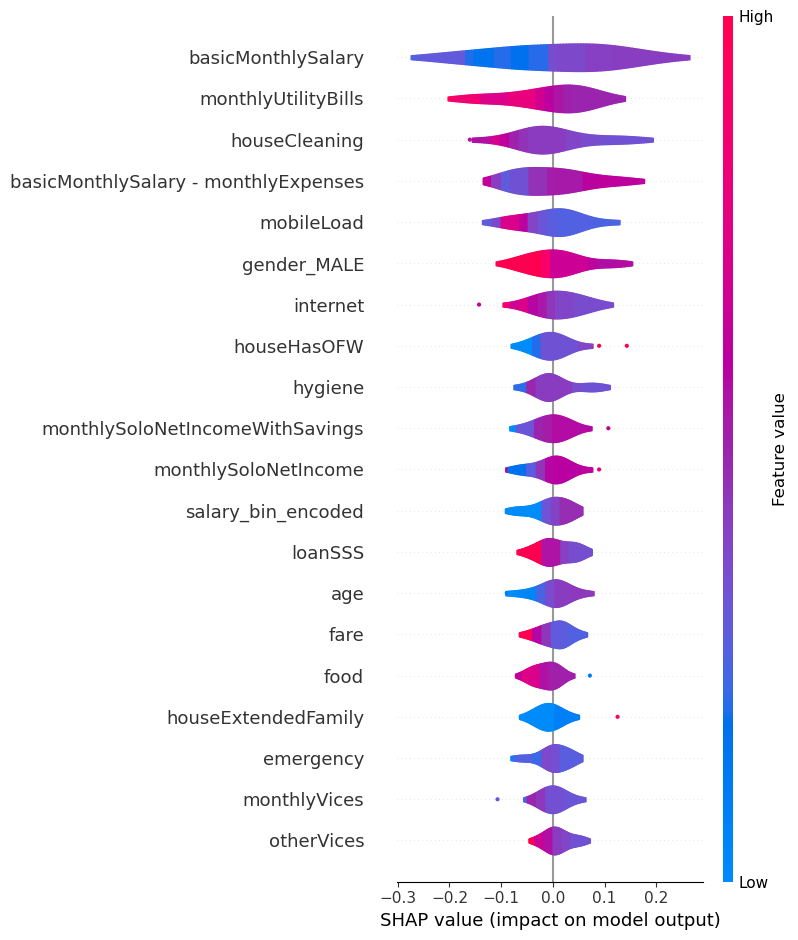

In [261]:
df = t09.copy()
# model = ho_t02_xgb_be.named_steps['classifier']
model = t09_rf_be
label_col = 'home_ownership_class'
X = df.drop(['userId', 'lastFirstName', label_col], axis=1)
y = df.loc[:, label_col]
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.25,
                                                    stratify=y,
                                                    random_state=0)

# input = ho_t12_adaboost_c0.drop(['user_id', 'lastFirstName', 'home_ownership_class'], axis=1)
# Fits the explainer
explainer = shap.Explainer(model.predict, X_test)
# explainer = shap.TreeExplainer(model=model,
#                                data=X_test,
#                                model_output='raw',
# #                                feature_perturbation='tree_path_dependent'
#                               )

# Calculates the SHAP values - It takes some time
shap_values = explainer(X_test)
# shap_values = explainer.shap_values(X_test)

feature_names = X.columns

# shap.summary_plot(shap_values, feature_names=feature_names, plot_type='dot')
shap.summary_plot(shap_values, feature_names=feature_names, plot_type='violin')

In [178]:
t09_xgb_gs, t09_xgb_be, t09_xgb_model_info, t09_xgb_metrics_df = xgb_class2(t09, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 250, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.35833333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', imp

## Results

In [205]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't09_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t09_model_summ)
t09_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t09_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.361455,0.048309,0.420675,0.613207,0.042813,0.694118,0.025377,0.815584,0.320,0.787300,0.336285,0.506975
1,SVM Classifier,0.348984,0.065785,0.520714,0.372463,0.087482,0.715686,0.019608,0.890909,0.176,0.768995,0.233131,0.395401
9,CatBoost,0.335556,0.043319,0.500000,0.838330,0.016672,0.711765,0.024608,0.890909,0.160,0.765648,0.209665,0.371892
2,Logistic Regression,0.324377,0.091456,0.411667,NaN,NaN,0.688235,0.036288,0.825974,0.264,0.776136,0.287607,0.457104
3,Decision Tree,0.309406,0.089842,0.485238,NaN,NaN,0.684314,0.029737,0.825974,0.248,0.772798,0.270303,0.441011
7,Extreme Gradient Boosting (XGBoost),0.284746,0.060130,0.527857,0.790612,0.019381,0.690196,0.028245,0.859740,0.168,0.760777,0.210003,0.378359
5,Gradient Boosting Machine (GBM),0.277157,0.048578,0.446190,0.817734,0.014624,0.670588,0.030691,0.818182,0.216,0.762839,0.239507,0.414237
8,AdaBoost,0.270057,0.042939,0.454611,0.822878,0.011457,0.641176,0.022570,0.761039,0.272,0.763007,0.270877,0.453884
6,LightGBM,0.264622,0.048128,0.499524,0.725418,0.030022,0.670588,0.028245,0.825974,0.192,0.758917,0.220443,0.394438
0,k-Nearest Neighbors,0.161538,0.149333,0.470000,0.507912,0.030439,0.715686,0.018341,0.927273,0.064,0.753348,0.090590,0.183819


In [ ]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t09_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.715686,k-Nearest Neighbors
Highest Test G-mean,0.506975,Random Forest
Highest Test Recall,0.320000,Random Forest
Highest Test Precision,0.361455,Random Forest
Highest Test Specificity,0.927273,k-Nearest Neighbors
Highest Test F1-score,0.336285,Random Forest


# HO_T10: Yes - 1, 20 (20k, 50k, 100k), 30

In [195]:
t10 = dataset.copy().drop(columns=cols_with_nulls)
# t10 = t10[t10['positiveMonthlySoloNetIncome'] != 0]
# t10_num = t10.drop(columns=['gender', 'province', 'job'])
t10 = pd.get_dummies(t10, columns=['gender'], prefix='gender', drop_first='True')
t10 = pd.get_dummies(t10, columns=['province'], prefix='province', drop_first='True')
t10 = pd.get_dummies(t10, columns=['job'], prefix='job', drop_first='True')

bins = [0, 20000, 50000, 100000, float('inf')]  # float('inf') represents infinity
labels = ['0-20k', '20k-50k', '50k-100k', '100k+']
t10['salary_bin'] = pd.cut(t10['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
t10['salary_bin_encoded'] = t10['salary_bin'].cat.codes
t10 = t10.drop(columns=['salary_bin'])

t10.loc[t10['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# t10.isna().sum()[t10.isna().sum() > 0]
df = t10

## EDA on Dataset

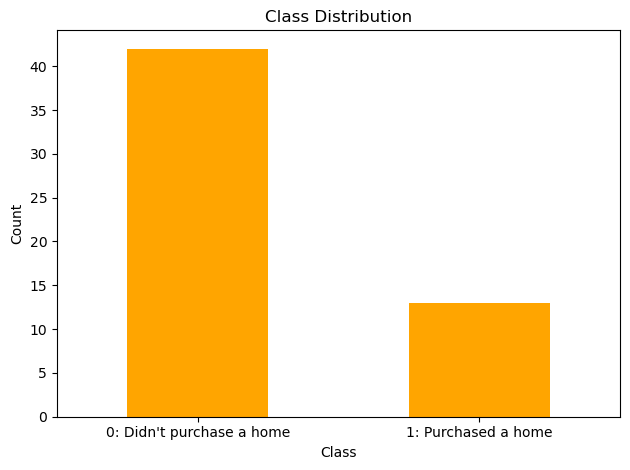

0    42
1    13
Name: home_ownership_class, dtype: int64

0    0.763636
1    0.236364
Name: home_ownership_class, dtype: float64

In [196]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [197]:
scaler = RobustScaler()

In [198]:
t10_adaboost_gs, t10_adaboost_be, t10_adaboost_model_info, t10_adaboost_metrics_df = adaboost_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.26666666666666666
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8176488414835938
Std Train Score (Precision) 0.03492415707405393
GridSearchCV Runtime: 4.958294630050659 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.375
Run 4 - Random State: 3
Test

In [200]:
t10_dt_gs, t10_dt_be, t10_dt_model_info, t10_dt_metrics_df = dt_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits
Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 3, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.4
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=3,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 29.233473539352417 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.3
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.


4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1990 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

In [201]:
t10_logreg_gs, t10_logreg_be, t10_logreg_model_info, t10_logreg_metrics_df = logreg_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


Best Hyperparameters: {'classifier__C': 100.0, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.2333333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=100.0, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 7.357244491577148 secs
Run 1 - Random State: 0
Test Precision: 0.1
Run 2 - Random State: 1
Test Precision: 0.2857142857142857
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2222222222222222
Run 5 - Random State: 4
Test Precision: 0.16666666666666666
Ave Test Precision: 0.22158730158730156
Stdev Test Precision: 0.09273564157834267
Ave Test Accuracy: 0.4714285714285714
Stdev Test Accuracy: 0.16444092047459055
Ave Test Specific


650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

In [202]:
t10_knn_gs, t10_knn_be, t10_knn_model_info, t10_knn_metrics_df = knn_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


Best Hyperparameters: {'classifier__metric': 'hamming', 'classifier__n_neighbors': 9, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.35
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='hamming', n_neighbors=9))])
Mean Train Score (Precision) 0.4723559577217007
Std Train Score (Precision) 0.11005585797727145
GridSearchCV Runtime: 10.672712564468384 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.5
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 0.2
Run 5 - Random State: 4
Test Precision: 1.0
Ave Test Precision: 0.4066666666666666
Stdev Test Precision: 0.3788872596902086
Ave Test Accuracy: 0.6857142857142857
Stdev Test Accuracy: 0.14811743823805515
Ave Test Specificity: 0.8
Ave Test Recall: 0.26666666666666666
Ave Test N

In [203]:
t10_svm_gs, t10_svm_be, t10_svm_model_info, t10_svm_metrics_df = svm_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 1000000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 SVC(C=1000000.0, kernel='poly', max_iter=1000,
                     probability=True, random_state=0, verbose=True))])
Mean Train Score (Precision) 0.6726979256408718
Std Train Score (Precision) 0.12648076350515167
GridSearchCV Runtime: 9.331697225570679 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.6666666666666666
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.5
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.0
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.2333333333333333
Stdev Test Precision: 0.32489314482696546
Ave Test Accuracy: 0.

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


In [204]:
t10_catboost_gs, t10_catboost_be, t10_catboost_model_info, t10_catboost_metrics_df = catboost_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.001939
0:	learn: 0.6918785	total: 2.31ms	remaining: 2.31s
1:	learn: 0.6906960	total: 4.36ms	remaining: 2.18s
2:	learn: 0.6896087	total: 6.79ms	remaining: 2.26s
3:	learn: 0.6884404	total: 8.91ms	remaining: 2.22s
4:	learn: 0.6870515	total: 11ms	remaining: 2.18s
5:	learn: 0.6860502	total: 12.4ms	remaining: 2.06s
6:	learn: 0.6852977	total: 14.4ms	remaining: 2.04s
7:	learn: 0.6844326	total: 16.2ms	remaining: 2.01s
8:	learn: 0.6832478	total: 18.2ms	remaining: 2s
9:	learn: 0.6818275	total: 20.4ms	remaining: 2.02s
10:	learn: 0.6804214	total: 22.3ms	remaining: 2s
11:	learn: 0.6791874	total: 24.2ms	remaining: 1.99s
12:	learn: 0.6777836	total: 26.1ms	remaining: 1.98s
13:	learn: 0.6763065	total: 27.6ms	remaining: 1.94s
14:	learn: 0.6751316	total: 29.4ms	remaining: 1.93s
15:	learn: 0.6741781	total: 31.3ms	remaining: 1.92s
16:	learn: 0.6730084	total: 33.3ms	remaining: 1.93s
17:	learn: 0.6719673	total: 35.4ms	remainin

In [205]:
t10_lgbm_gs, t10_lgbm_be, t10_lgbm_model_info, t10_lgbm_metrics_df = lgbm_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Info] Number of positive: 31, number of negative: 31
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000705 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 717
[LightGBM] [Info] Number of data points in the train set: 62, number of used features: 69
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

In [206]:
t10_gbm_gs, t10_gbm_be, t10_gbm_model_info, t10_gbm_metrics_df = gbm_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits
Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.25833333333333336
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) 0.808946733780925
Std Train Score (Precision) 0.031206139681104073
GridSearchCV Runtime: 22.329843521118164 secs
Run 1 - Random State: 0
Test Precision: 0.3
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.5
Run 4 -

In [207]:
t10_rf_gs, t10_rf_be, t10_rf_model_info, t10_rf_metrics_df = rf_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.23333333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=3,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) 0.7928949904215713
Std Train Score (Precision) 0.06998194396208453
GridSearchCV Runtime: 154.8312635421753 secs
Run 1 - Random State: 0
Test Precision: 0.2
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 3
Test Precision: 

In [208]:
t10_xgb_gs, t10_xgb_be, t10_xgb_model_info, t10_xgb_metrics_df = xgb_class2(t10, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.1, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.35
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=Non

## Results

In [209]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't10_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t10_model_summ)
t10_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t10_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
0,k-Nearest Neighbors,0.406667,0.378887,0.350000,0.472356,0.110056,0.685714,0.148117,0.800000,0.266667,0.795089,0.296667,0.422126
6,LightGBM,0.400000,0.091287,0.283333,0.439480,0.030536,0.742857,0.039123,0.836364,0.400000,0.837576,0.394286,0.571146
5,Gradient Boosting Machine (GBM),0.342143,0.099309,0.258333,0.808947,0.031206,0.600000,0.119523,0.527273,0.866667,0.938095,0.487459,0.669576
9,CatBoost,0.301587,0.095185,0.233333,0.833339,0.037691,0.600000,0.119523,0.600000,0.600000,0.842540,0.396667,0.589715
7,Extreme Gradient Boosting (XGBoost),0.296032,0.116966,0.350000,0.813310,0.029867,0.542857,0.148117,0.490909,0.733333,0.858095,0.419394,0.598208
3,Decision Tree,0.290952,0.030042,0.400000,NaN,NaN,0.514286,0.093131,0.418182,0.866667,0.942857,0.432308,0.581934
8,AdaBoost,0.255000,0.071589,0.266667,0.817649,0.034924,0.500000,0.142857,0.454545,0.666667,0.826667,0.362038,0.526840
1,SVM Classifier,0.233333,0.324893,0.300000,0.672698,0.126481,0.771429,0.078246,0.909091,0.266667,0.826104,0.247619,0.303410
2,Logistic Regression,0.221587,0.092736,0.233333,NaN,NaN,0.471429,0.164441,0.454545,0.533333,0.756429,0.310769,0.483862
4,Random Forest,0.190000,0.123378,0.233333,0.792895,0.069982,0.571429,0.087482,0.636364,0.333333,0.781313,0.233838,0.391936


In [211]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t10_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.771429,SVM Classifier
Highest Test G-mean,0.669576,Gradient Boosting Machine (GBM)
Highest Test Recall,0.866667,Decision Tree
Highest Test Precision,0.406667,k-Nearest Neighbors
Highest Test Specificity,0.909091,SVM Classifier
Highest Test F1-score,0.487459,Gradient Boosting Machine (GBM)


# HO_T11: Yes - 4, 20 (20k, 50k, 75k, 100k), 30

In [222]:
t11 = dataset.copy().drop(columns=cols_with_nulls)
t11 = t11[t11['positiveMonthlyFamilyNetIncome'] != 0]
# t11_num = t11.drop(columns=['gender', 'province', 'job'])
t11 = pd.get_dummies(t11, columns=['gender'], prefix='gender', drop_first='True')
t11 = pd.get_dummies(t11, columns=['province'], prefix='province', drop_first='True')
t11 = pd.get_dummies(t11, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
t11['salary_bin'] = pd.cut(t11['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
t11['salary_bin_encoded'] = t11['salary_bin'].cat.codes
t11 = t11.drop(columns=['salary_bin'])

# t11.isna().sum()[t11.isna().sum() > 0]
df = t11

## EDA on Dataset

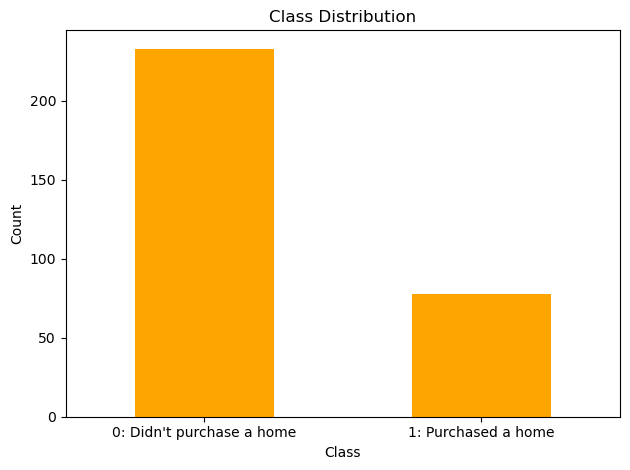

0    233
1     78
Name: home_ownership_class, dtype: int64

0    0.749196
1    0.250804
Name: home_ownership_class, dtype: float64

In [223]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

## Runs: RobustScaler()

In [224]:
scaler = RobustScaler()

In [225]:
t11_adaboost_gs, t11_adaboost_be, t11_adaboost_model_info, t11_adaboost_metrics_df = adaboost_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits
Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': RandomForestClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3416666666666667
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=RandomForestClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) 0.8308122326499163
Std Train Score (Precision) 0.013278976542280538
GridSearchCV Runtime: 25.025787353515625 secs
Run 1 - Random State: 0
Test Precision: 0.2222222222222222
Run 2 - Random State: 1
Test Precision: 0.375
Run 3 - Random State: 2
Test Precision: 0.3333333333333333
Run 4 - Random State: 

In [226]:
t11_dt_gs, t11_dt_be, t11_dt_model_info, t11_dt_metrics_df = dt_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



4320 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1808 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 638, in _

Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 5, 'classifier__max_features': 'log2', 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'resampling': ADASYN(random_state=0)}
Best Validation Score (Precision): 0.3973917748917749
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', ADASYN(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(criterion='entropy', max_depth=5,
                                        max_features='log2', min_samples_leaf=2,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 93.16027665138245 secs
Run 1 - Random State: 0
Test Precision: 0.23333333333333334
Run 2 - Random State: 1
Test Precision: 0.2903225806451613
Run 3 - Random State: 2
Test Precision: 0.32
Run 4 - Random State: 3
Test Precision: 0.21428571428571427
Run 5 - Random Stat

In [227]:
t11_logreg_gs, t11_logreg_be, t11_logreg_model_info, t11_logreg_metrics_df = logreg_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits



650 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
650 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 297, in fit
    self._final_estimator.fit(Xt, yt, **fit_params_last_step)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\base.py", line 1152, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\linear_mod

Best Hyperparameters: {'classifier__C': 0.001, 'classifier__penalty': 'l2', 'classifier__solver': 'lbfgs', 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4352380952380953
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 LogisticRegression(C=0.001, max_iter=1000, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 81.68340134620667 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.35294117647058826
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2727272727272727
Ave Test Precision: 0.2584670231729055
Stdev Test Precision: 0.10662690157030995
Ave Test Accuracy: 0.6487179487179487
Stdev Test Accuracy: 0.03087588353536484
Ave Test Specifi

In [228]:
t11_knn_gs, t11_knn_be, t11_knn_model_info, t11_knn_metrics_df = knn_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits
Best Hyperparameters: {'classifier__metric': 'canberra', 'classifier__n_neighbors': 15, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.4184523809523809
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 KNeighborsClassifier(metric='canberra', n_neighbors=15))])
Mean Train Score (Precision) 0.5091761085718846
Std Train Score (Precision) 0.03319810013466686
GridSearchCV Runtime: 51.15581250190735 secs
Run 1 - Random State: 0
Test Precision: 0.3157894736842105
Run 2 - Random State: 1
Test Precision: 0.08333333333333333
Run 3 - Random State: 2
Test Precision: 0.43478260869565216
Run 4 - Random State: 3
Test Precision: 0.43333333333333335
Run 5 - Random State: 4
Test Precision: 0.47368421052631576
Ave Test Precision: 0.348184591914569
Stdev Test Precision: 0.15944851191257142
Ave Te

In [229]:
t11_svm_gs, t11_svm_be, t11_svm_model_info, t11_svm_metrics_df = svm_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


[LibSVM]Best Hyperparameters: {'classifier__C': 10000.0, 'classifier__kernel': 'poly', 'classifier__probability': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.5138095238095237
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 SVC(C=10000.0, kernel='poly', max_iter=1000, probability=True,
                     random_state=0, verbose=True))])
Mean Train Score (Precision) 0.38396488414102453
Std Train Score (Precision) 0.06757688766936748
GridSearchCV Runtime: 56.87662196159363 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2857142857142857
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.42857142857142855


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


[LibSVM]Run 3 - Random State: 2
Test Precision: 0.45454545454545453
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.25
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.2777777777777778
Ave Test Precision: 0.33932178932178936
Stdev Test Precision: 0.09471246351638478
Ave Test Accuracy: 0.6128205128205128
Stdev Test Accuracy: 0.20258844384746905
Ave Test Specificity: 0.7068965517241379
Ave Test Recall: 0.33999999999999997
Ave Test NPV: 0.7066323313012403
Ave Test F1-Score: 0.2703884487203672
Ave Test G-mean: 0.3435647379493808
Ave Runtime: 0.05944418907165527


Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
Solver terminated early (max_iter=1000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.


In [230]:
t11_catboost_gs, t11_catboost_be, t11_catboost_model_info, t11_catboost_metrics_df = catboost_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 5 candidates, totalling 50 fits
Learning rate set to 0.00658
0:	learn: 0.6895590	total: 12.5ms	remaining: 12.4s
1:	learn: 0.6866397	total: 24.5ms	remaining: 12.2s
2:	learn: 0.6828479	total: 36.5ms	remaining: 12.1s
3:	learn: 0.6801841	total: 47.8ms	remaining: 11.9s
4:	learn: 0.6773414	total: 58.9ms	remaining: 11.7s
5:	learn: 0.6741829	total: 69.4ms	remaining: 11.5s
6:	learn: 0.6712446	total: 81ms	remaining: 11.5s
7:	learn: 0.6685637	total: 92.1ms	remaining: 11.4s
8:	learn: 0.6663407	total: 103ms	remaining: 11.3s
9:	learn: 0.6633535	total: 114ms	remaining: 11.3s
10:	learn: 0.6607155	total: 125ms	remaining: 11.2s
11:	learn: 0.6586848	total: 136ms	remaining: 11.2s
12:	learn: 0.6566603	total: 147ms	remaining: 11.2s
13:	learn: 0.6539184	total: 159ms	remaining: 11.2s
14:	learn: 0.6511092	total: 170ms	remaining: 11.2s
15:	learn: 0.6481442	total: 182ms	remaining: 11.2s
16:	learn: 0.6448998	total: 194ms	remaining: 11.2s
17:	learn: 0.6425868	total: 206ms	remaining: 11

In [232]:
t11_lgbm_gs, t11_lgbm_be, t11_lgbm_model_info, t11_lgbm_metrics_df = lgbm_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Info] Number of positive: 58, number of negative: 86
[LightGBM] [Warning] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000425 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1078
[LightGBM] [Info] Number of data points in the train set: 144, number of used features: 66
[LightGBM] [Info] Using GOSS
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.402778 -> i

In [233]:
t11_gbm_gs, t11_gbm_be, t11_gbm_model_info, t11_gbm_metrics_df = gbm_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 250, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.2852380952380952
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=3,
                                            n_estimators=250,
                                            random_state=0))])
Mean Train Score (Precision) 0.8231588055567285
Std Train Score (Precision) 0.009634254876077915
GridSearchCV Runtime: 169.25146484375 secs
Run 1 - Random State: 0
Test Precision: 0.125
Run 2 - Random State: 1
Test Precision: 0.1111111111111111
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4


In [234]:
t11_rf_gs, t11_rf_be, t11_rf_model_info, t11_rf_metrics_df = rf_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


Best Hyperparameters: {'classifier__criterion': 'entropy', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': EditedNearestNeighbours()}
Best Validation Score (Precision): 0.44071428571428567
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', EditedNearestNeighbours()),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', max_depth=2,
                                        min_samples_leaf=2, n_estimators=200,
                                        oob_score=True, random_state=0))])
Mean Train Score (Precision) 0.5609004134537909
Std Train Score (Precision) 0.039504894980957904
GridSearchCV Runtime: 511.69627690315247 secs
Run 1 - Random State: 0
Test Precision: 0.375
Run 2 - Random State: 1
Test Precision: 0.42857142857142855
Run 3 - Random State: 2
Test Precision: 0.42857142857142

In [235]:
t11_xgb_gs, t11_xgb_be, t11_xgb_model_info, t11_xgb_metrics_df = xgb_class2(t11, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits
Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 1, 'classifier__max_depth': 3, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': SMOTE(random_state=0)}
Best Validation Score (Precision): 0.4008333333333334
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', SMOTE(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
              

## Results

In [236]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't11_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t11_model_summ)
t11_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t11_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
4,Random Forest,0.385777,0.046638,0.440714,0.560900,0.039505,0.697436,0.029515,0.837931,0.29,0.774366,0.323621,0.485372
0,k-Nearest Neighbors,0.348185,0.159449,0.418452,0.509176,0.033198,0.679487,0.045327,0.779310,0.39,0.792148,0.363369,0.518938
1,SVM Classifier,0.339322,0.094712,0.513810,0.383965,0.067577,0.612821,0.202588,0.706897,0.34,0.706632,0.270388,0.343565
8,AdaBoost,0.325505,0.060609,0.341667,0.830812,0.013279,0.707692,0.016716,0.906897,0.13,0.751493,0.183595,0.339275
6,LightGBM,0.318616,0.023902,0.396667,0.708492,0.027407,0.607692,0.024992,0.655172,0.47,0.783415,0.377240,0.549708
9,CatBoost,0.290519,0.076375,0.359524,0.841319,0.013950,0.687179,0.019443,0.868966,0.16,0.750204,0.204814,0.366438
2,Logistic Regression,0.258467,0.106627,0.435238,NaN,NaN,0.648718,0.030876,0.796552,0.22,0.748341,0.235166,0.400840
7,Extreme Gradient Boosting (XGBoost),0.257143,0.131320,0.400833,0.790155,0.015983,0.666667,0.040542,0.841379,0.16,0.743934,0.196078,0.355402
3,Decision Tree,0.256750,0.045926,0.397392,NaN,NaN,0.561538,0.041937,0.627586,0.37,0.742423,0.302601,0.480860
5,Gradient Boosting Machine (GBM),0.209444,0.096057,0.285238,0.823159,0.009634,0.669231,0.029235,0.862069,0.11,0.737701,0.138146,0.291289


In [237]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t11_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.707692,AdaBoost
Highest Test G-mean,0.549708,LightGBM
Highest Test Recall,0.470000,LightGBM
Highest Test Precision,0.385777,Random Forest
Highest Test Specificity,0.906897,AdaBoost
Highest Test F1-score,0.377240,LightGBM


# HO_T12: Yes - 1, 20 (20k, 50k, 75k, 100k), 30

In [210]:
df = dataset.copy().drop(columns=cols_with_nulls)
df = df[df['positiveMonthlyFamilyNetIncome'] != 0]
# df_num = df.drop(columns=['gender', 'province', 'job'])
df = pd.get_dummies(df, columns=['gender'], prefix='gender', drop_first='True')
df = pd.get_dummies(df, columns=['province'], prefix='province', drop_first='True')
df = pd.get_dummies(df, columns=['job'], prefix='job', drop_first='True')

bins = [0, 25_000, 50_000, 75_000, 100_000, float('inf')]  # float('inf') represents infinity
labels = ['0-25k', '25k-50k', '50k-75k', '75k-100k', '100k+']
df['salary_bin'] = pd.cut(df['basicMonthlySalary'], bins=bins, labels=labels, right=False, ordered=True)
df['salary_bin_encoded'] = df['salary_bin'].cat.codes
df = df.drop(columns=['salary_bin'])

df.loc[df['basicMonthlySalary'] < 100, 'basicMonthlySalary'] *= 1000

# df.isna().sum()[df.isna().sum() > 0]
# df = t11

## EDA on Dataset

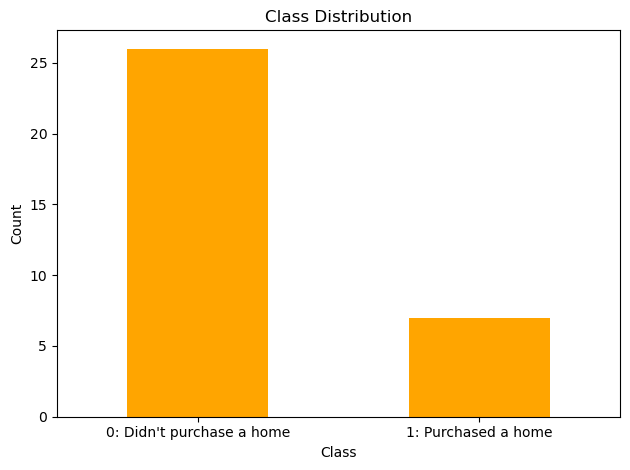

0    26
1     7
Name: home_ownership_class, dtype: int64

0    0.787879
1    0.212121
Name: home_ownership_class, dtype: float64

In [180]:
class_counts = df['home_ownership_class'].value_counts()
class_counts = class_counts.rename({0: "0: Didn't purchase a home",
                                    1: "1: Purchased a home"})

# Plot
class_counts.plot(kind='bar', color='orange')
plt.title('Class Distribution')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

display(df['home_ownership_class'].value_counts())
display(df['home_ownership_class'].value_counts(normalize=True))

In [181]:
t12 = df.copy()

## Runs: RobustScaler()

In [182]:
scaler = RobustScaler()

In [183]:
t12_adaboost_gs, t12_adaboost_be, t12_adaboost_model_info, t12_adaboost_metrics_df = adaboost_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 40 candidates, totalling 400 fits


The least populated class in y has only 5 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__algorithm': 'SAMME', 'classifier__estimator': DecisionTreeClassifier(random_state=0), 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.3
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 AdaBoostClassifier(algorithm='SAMME',
                                    estimator=DecisionTreeClassifier(random_state=0),
                                    n_estimators=200, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 6.469697713851929 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.25
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.25
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.15
Stdev Test Precision: 0.1


160 fits failed out of a total of 400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
40 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 35

In [184]:
t12_dt_gs, t12_dt_be, t12_dt_model_info, t12_dt_metrics_df = dt_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 5 members, which is less than n_splits=10.


Fitting 10 folds for each of 1728 candidates, totalling 17280 fits



10800 fits failed out of a total of 17280.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
1080 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", l

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__max_features': None, 'classifier__min_samples_leaf': 1, 'classifier__min_samples_split': 2, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 DecisionTreeClassifier(max_depth=2, random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 106.18783807754517 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.16666666666666666
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.11666666666666665
Stdev Test Precision: 0.1118033988749895
Ave Test Accuracy: 0.4222222222

In [185]:
t12_logreg_gs, t12_logreg_be, t12_logreg_model_info, t12_logreg_metrics_df = logreg_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 390 candidates, totalling 3900 fits


The least populated class in y has only 5 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__penalty': None, 'classifier__solver': 'lbfgs', 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 LogisticRegression(C=1e-06, max_iter=1000, penalty=None,
                                    random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 26.927831172943115 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.2
Run 3 - Random State: 2
Test Precision: 0.2
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.08
Stdev Test Precision: 0.10954451150103324
Ave Test Accuracy: 0.4444444444444445
Stdev Test Accuracy: 6.206335383118183e-17
Ave Test Specificity: 0.5142857142857


1950 fits failed out of a total of 3900.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
390 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [186]:
t12_knn_gs, t12_knn_be, t12_knn_model_info, t12_knn_metrics_df = knn_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 600 candidates, totalling 6000 fits


The least populated class in y has only 5 members, which is less than n_splits=10.


Best Hyperparameters: {'classifier__metric': 'cityblock', 'classifier__n_neighbors': 5, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier', KNeighborsClassifier(metric='cityblock'))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 42.329832315444946 secs
Run 1 - Random State: 0
Test Precision: 0.25
Run 2 - Random State: 1
Test Precision: 0.14285714285714285
Run 3 - Random State: 2
Test Precision: 0.25
Run 4 - Random State: 3
Test Precision: 0.3333333333333333
Run 5 - Random State: 4
Test Precision: 0.2857142857142857
Ave Test Precision: 0.2523809523809524
Stdev Test Precision: 0.07012703083344353
Ave Test Accuracy: 0.39999999999999997
Stdev Test Accuracy: 0.16850834320114558
Ave Test Specificity: 0.2857142857142857
Ave Test Recall: 0.8
Ave


2400 fits failed out of a total of 6000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
600 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [187]:
t12_svm_gs, t12_svm_be, t12_svm_model_info, t12_svm_metrics_df = svm_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 520 candidates, totalling 5200 fits


The least populated class in y has only 5 members, which is less than n_splits=10.


[LibSVM]Best Hyperparameters: {'classifier__C': 1e-06, 'classifier__kernel': 'rbf', 'classifier__probability': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.21666666666666665
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 SVC(C=1e-06, max_iter=1000, probability=True, random_state=0,
                     verbose=True))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 34.81638240814209 secs
[LibSVM]Run 1 - Random State: 0
Test Precision: 0.2
[LibSVM]Run 2 - Random State: 1
Test Precision: 0.0
[LibSVM]Run 3 - Random State: 2
Test Precision: 0.0
[LibSVM]Run 4 - Random State: 3
Test Precision: 0.25
[LibSVM]Run 5 - Random State: 4
Test Precision: 0.0
Ave Test Precision: 0.09
Stdev Test Precision: 0.12449899597988733
Ave Test Accuracy: 0.4222222222222222
Stdev Test Accuracy: 0.265


2080 fits failed out of a total of 5200.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
520 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

In [188]:
t12_catboost_gs, t12_catboost_be, t12_catboost_model_info, t12_catboost_metrics_df = catboost_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

The least populated class in y has only 5 members, which is less than n_splits=10.


Fitting 10 folds for each of 5 candidates, totalling 50 fits



20 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line 353, 

Learning rate set to 0.001442
0:	learn: 0.6922423	total: 1.43ms	remaining: 1.43s
1:	learn: 0.6911359	total: 4.28ms	remaining: 2.13s
2:	learn: 0.6906517	total: 8.14ms	remaining: 2.71s
3:	learn: 0.6898148	total: 10.9ms	remaining: 2.7s
4:	learn: 0.6891236	total: 16.5ms	remaining: 3.28s
5:	learn: 0.6883103	total: 19.2ms	remaining: 3.18s
6:	learn: 0.6874143	total: 22.4ms	remaining: 3.18s
7:	learn: 0.6865275	total: 25.7ms	remaining: 3.19s
8:	learn: 0.6859253	total: 29.1ms	remaining: 3.21s
9:	learn: 0.6849098	total: 31.7ms	remaining: 3.13s
10:	learn: 0.6844487	total: 33.6ms	remaining: 3.02s
11:	learn: 0.6836508	total: 36.6ms	remaining: 3.01s
12:	learn: 0.6828517	total: 39.6ms	remaining: 3.01s
13:	learn: 0.6822156	total: 42.8ms	remaining: 3.01s
14:	learn: 0.6814141	total: 45.5ms	remaining: 2.99s
15:	learn: 0.6808171	total: 48ms	remaining: 2.95s
16:	learn: 0.6799462	total: 49.9ms	remaining: 2.89s
17:	learn: 0.6789922	total: 52.3ms	remaining: 2.85s
18:	learn: 0.6780343	total: 54.5ms	remaining: 2

In [189]:
t12_lgbm_gs, t12_lgbm_be, t12_lgbm_model_info, t12_lgbm_metrics_df = lgbm_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

720 fits failed out of a total of 1800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
180 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  Fi

[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 5, number of negative: 7
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 12, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.416667 -> initscore=-0.336472
[LightGBM] [Info] Start training from score -0.336472
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because the

Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
invalid value encountered in scalar divide
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.


[LightGBM] [Warning] There are no meaningful features which satisfy the provided configuration. Decreasing Dataset parameters min_data_in_bin or min_data_in_leaf and re-constructing Dataset might resolve this warning.
[LightGBM] [Info] Number of positive: 5, number of negative: 4
[LightGBM] [Info] Total Bins 0
[LightGBM] [Info] Number of data points in the train set: 9, number of used features: 0
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.555556 -> initscore=0.223144
[LightGBM] [Info] Start training from score 0.223144
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] Stopped training because there 

In [190]:
t12_gbm_gs, t12_gbm_be, t12_gbm_model_info, t12_gbm_metrics_df = gbm_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 80 candidates, totalling 800 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

320 fits failed out of a total of 800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
80 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File

Best Hyperparameters: {'classifier__learning_rate': 0.1, 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 2, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.2833333333333333
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 GradientBoostingClassifier(max_depth=2, min_samples_leaf=2,
                                            n_estimators=200,
                                            random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 15.700591564178467 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.3333333333333333
Run 3 - Random State: 2
Test Precision: 0.0
Run 4 - Random State: 3
Test Precision: 0.16666666666666666
Run 5 - Random State: 4
Test

In [191]:
t12_rf_gs, t12_rf_be, t12_rf_model_info, t12_rf_metrics_df = rf_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


The least populated class in y has only 5 members, which is less than n_splits=10.

1920 fits failed out of a total of 4800.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
480 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  F

Best Hyperparameters: {'classifier__criterion': 'gini', 'classifier__max_depth': 2, 'classifier__min_samples_leaf': 3, 'classifier__min_samples_split': 2, 'classifier__n_estimators': 200, 'classifier__oob_score': True, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 RandomForestClassifier(max_depth=2, min_samples_leaf=3,
                                        n_estimators=200, oob_score=True,
                                        random_state=0))])
Mean Train Score (Precision) nan
Std Train Score (Precision) nan
GridSearchCV Runtime: 156.51528525352478 secs
Run 1 - Random State: 0
Test Precision: 0.0
Run 2 - Random State: 1
Test Precision: 0.0
Run 3 - Random State: 2
Test Precision: 0.14285714285714285
Run 4 - Random State: 3
Test Precision: 0.0
Run 5 - Random State: 4

In [192]:
t12_xgb_gs, t12_xgb_be, t12_xgb_model_info, t12_xgb_metrics_df = xgb_class2(t12, 'precision',
                                                            'home_ownership_class', scaler, random_state=0)

Fitting 10 folds for each of 540 candidates, totalling 5400 fits


The least populated class in y has only 5 members, which is less than n_splits=10.



2160 fits failed out of a total of 5400.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
540 fits failed with the following error:
Traceback (most recent call last):
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 293, in fit
    Xt, yt = self._fit(X, y, **fit_params_steps)
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\imblearn\pipeline.py", line 250, in _fit
    X, y, fitted_transformer = fit_resample_one_cached(
  File "c:\Users\Carlo\mambaforge\envs\myenv\lib\site-packages\joblib\memory.py", line

Best Hyperparameters: {'classifier__grow_policy': 'depthwise', 'classifier__learning_rate': 0.01, 'classifier__max_depth': None, 'classifier__max_leaves': 10, 'classifier__n_estimators': 200, 'resampling': RandomUnderSampler(random_state=0)}
Best Validation Score (Precision): 0.25
Best Estimator: Pipeline(steps=[('scaler', RobustScaler()),
                ('resampling', RandomUnderSampler(random_state=0)),
                ('classifier',
                 XGBClassifier(base_score=None, booster=None, callbacks=None,
                               colsample_bylevel=None, colsample_bynode=None,
                               colsample_bytree=None,
                               early_stopping_rounds=None,
                               enable_categorical=False, eval_metric=None,
                               feature_types=None, gamma=None, gpu_id=None,
                               grow_policy='depthwise', importance_type=None,
                               interaction_constraints=None, 

## Results

In [193]:
model_vars = ['knn', 'svm', 'logreg', 'dt', 'rf', 'gbm', 'lgbm', 'xgb', 'adaboost', 'catboost']

var_df = {
    'Classifier model': [
        'k-Nearest Neighbors', 'SVM Classifier',
        'Logistic Regression', 'Decision Tree', 'Random Forest',
        'Gradient Boosting Machine (GBM)',
        'LightGBM', 'Extreme Gradient Boosting (XGBoost)',
        'AdaBoost', 'CatBoost'
    ],
    'Best Hyperparameters': [],
    'Average Val Precision': [],
    'Average Train Precision': [],
    'Stdev Train Precision': [],
    'Average Test Precision': [],
    'Stdev Test Precision': [],
    'Average Test Accuracy': [],
    'Stdev Test Accuracy': [],
    'Average Runtime': [],
    'Average Test Specificity': [],
    'Average Test Recall': [],
    'Average Test NPV': [],
    'Average Test F1-score': [],
    'Average Test G-mean': []
}

prefix = 't12_'
for name in model_vars:
    var_df['Best Hyperparameters'].append(globals()[prefix+name+'_model_info']['best_params'])
    var_df['Average Val Precision'].append(globals()[prefix+name+'_model_info']['best_cv_score'])
    var_df['Average Train Precision'].append(globals()[prefix+name+'_model_info']['mean_train_score'])
    var_df['Stdev Train Precision'].append(globals()[prefix+name+'_model_info']['std_train_score'])
    var_df['Average Test Precision'].append(globals()[prefix+name+'_model_info']['average_test_precision'])
    var_df['Stdev Test Precision'].append(globals()[prefix+name+'_model_info']['stdev_test_precision'])
    var_df['Average Test Accuracy'].append(globals()[prefix+name+'_model_info']['average_test_accuracy'])
    var_df['Stdev Test Accuracy'].append(globals()[prefix+name+'_model_info']['stdev_test_accuracy'])
    var_df['Average Runtime'].append(globals()[prefix+name+'_model_info']['average_runtime'])
    var_df['Average Test Specificity'].append(globals()[prefix+name+'_model_info']['average_test_specificity'])
    var_df['Average Test Recall'].append(globals()[prefix+name+'_model_info']['average_test_recall'])
    var_df['Average Test NPV'].append(globals()[prefix+name+'_model_info']['average_test_npv'])
    var_df['Average Test F1-score'].append(globals()[prefix+name+'_model_info']['average_test_f1_score'])
    var_df['Average Test G-mean'].append(globals()[prefix+name+'_model_info']['average_test_g_mean'])

# display(t12_model_summ)
t12_summ = pd.DataFrame(var_df)

# columns_to_exclude = ['Best Hyperparameters', 'Average Runtime']
# selected_columns = [col for col in ho_t1__summ.columns if col not in columns_to_exclude]
# ho_t1__summ[selected_columns]

t12_summ[[
    'Classifier model', 'Average Test Precision', 'Stdev Test Precision',
    'Average Val Precision', 'Average Train Precision', 'Stdev Train Precision',
    'Average Test Accuracy', 'Stdev Test Accuracy', 'Average Test Specificity',
    'Average Test Recall', 'Average Test NPV', 'Average Test F1-score', 'Average Test G-mean'
]].sort_values(by='Average Test Precision', ascending=False)

,Classifier model,Average Test Precision,Stdev Test Precision,Average Val Precision,Average Train Precision,Stdev Train Precision,Average Test Accuracy,Stdev Test Accuracy,Average Test Specificity,Average Test Recall,Average Test NPV,Average Test F1-score,Average Test G-mean
0,k-Nearest Neighbors,0.252381,0.070127,0.283333,NaN,NaN,0.400000,1.685083e-01,0.285714,0.8,0.866667,0.373333,0.431065
8,AdaBoost,0.150000,0.136931,0.300000,NaN,NaN,0.555556,7.856742e-02,0.628571,0.3,0.763333,0.200000,0.320713
3,Decision Tree,0.116667,0.111803,0.283333,NaN,NaN,0.422222,1.448712e-01,0.428571,0.4,0.750000,0.180000,0.226779
5,Gradient Boosting Machine (GBM),0.100000,0.149071,0.283333,NaN,NaN,0.488889,2.018434e-01,0.542857,0.3,0.733333,0.150000,0.206524
1,SVM Classifier,0.090000,0.124499,0.216667,NaN,NaN,0.422222,2.652741e-01,0.485714,0.2,0.632222,0.123810,0.199487
2,Logistic Regression,0.080000,0.109545,0.200000,NaN,NaN,0.444444,6.206335e-17,0.514286,0.2,0.700000,0.114286,0.185164
7,Extreme Gradient Boosting (XGBoost),0.073333,0.101105,0.250000,NaN,NaN,0.422222,2.137265e-01,0.485714,0.2,0.642857,0.107143,0.168175
6,LightGBM,0.044444,0.099381,0.000000,NaN,NaN,0.666667,2.484520e-01,0.800000,0.2,0.777778,0.072727,0.000000
9,CatBoost,0.033333,0.074536,0.150000,NaN,NaN,0.466667,1.217161e-01,0.571429,0.1,0.681905,0.050000,0.075593
4,Random Forest,0.028571,0.063888,0.250000,NaN,NaN,0.511111,1.859245e-01,0.628571,0.1,0.676190,0.044444,0.053452


In [194]:
best_scores_models = {
    'Best Score': [],
    'Best Model': []
}

indices = [
    'Highest Test Accuracy',
    'Highest Test G-mean',
    'Highest Test Recall',
    'Highest Test Precision',
    'Highest Test Specificity',
    'Highest Test F1-score'
]

# Corresponding column names in your original dataframe
columns = [
    'Average Test Accuracy',
    'Average Test G-mean',
    'Average Test Recall',
    'Average Test Precision',
    'Average Test Specificity',
    'Average Test F1-score'
]

df = t12_summ
# Finding the best model for each metric
for col in columns:
    best_score = df[col].max()
    best_model = df.loc[df[col] == best_score, 'Classifier model'].values[0]
    
    best_scores_models['Best Score'].append(best_score)
    best_scores_models['Best Model'].append(best_model)

# Creating the new dataframe
best_df = pd.DataFrame(best_scores_models, index=indices)

# Displaying the new dataframe
best_df

,Best Score,Best Model
Highest Test Accuracy,0.666667,LightGBM
Highest Test G-mean,0.431065,k-Nearest Neighbors
Highest Test Recall,0.800000,k-Nearest Neighbors
Highest Test Precision,0.252381,k-Nearest Neighbors
Highest Test Specificity,0.800000,LightGBM
Highest Test F1-score,0.373333,k-Nearest Neighbors
